# Proyecto de Aprendizaje Supervisado [Raul Echeverry, Esteban y Fabian Salazar] Versión 2
- Con este proyecto aprenderemos como construir, entrenar y evaluar un modelo que resuelva una tarea de clasificación.
- Utilizaremos diversas librerías para la manipulación, análisis, visualización, modelado y evaluación de los datos.

### 1. Librerías a básicas utilizar

In [1]:
# Importar librerías

# Manejo de analísis de datos a través de dataframes (data tabular)
import pandas as pd
# Manipulación de arreglos y análisis numérico
import numpy as np
# Visualización de datos
import seaborn as sns
# Visualización de datos
import matplotlib.pyplot as plt
%matplotlib inline
#  Evitar mensajes de warning
import warnings
warnings.filterwarnings("ignore")

### 2. Diccionario de datos

1. location: Display de city or country where the data was taken. Cleveland, Hungría, Suiza (Country/city).
2. age: Displays the age of the patien; continuos from 28 to 77.
3. sex: Displays the gender of the patien using the following format : 1 = male 0 = female.
4. chest_pain_type: 1, 2, 3, 4 (1 = typical angina, 2 = atypical angina, 3 = non anginal pain, 4 = asymptotic).
5. resting_blood_pressure: Displays the resting blood pressure value of a patien in mmHg (unit); Continuos from 80 to 227
6. serum_cholestoral: Displays the serum cholestrol in mg/dl (unit); continuos from 0 to 564 in mg/dl 
7. fasting_blood_sugar: compares the fasting blood sugar value of the patien with 120mg/dl. If fasting blood sugar > 120mg/dl then : 1 (true) else : 0 (false)
8. resting_electrocardiographic_results: 0, 1, 2 (values 0,1,2) 0 = normal, 1 = having ST-T wave abnormality, 2 = left ventricular hyperthrophy
9. maximum_heart_rate_achieved: displays the max heart rate achieved by an patien. Continuos from 60 to 202
10. exercise_induced_angina: 0 = no, 1 = yes
11. oldpeak_ST_depression induced by exercise relative to rest: Continuos from -2 to 6.2
12. the_slope_of_the_peak_exercise_ST_segment: 1,2,3 (1 = upsloping 2 = flat 3 = downsloping)
13. number_of_major_vessels_colored_by_flourosopy: Number of major vessels (0,1,2,3) colored by flourosopy : displays the value as integer or float.
14. thal: displays the thalassemia: 3,6,7. (3 = normal 6 = fixed defect 7 = reversable defect)
15. target: Diagnosis of heart disease, displays whether the patien is suffering from heart disease or not : 0 = absence and 1,2,3,4 = present but in diferent state or with significants diferences between 1, 2, 3, and 4.

### 3. Lectura de los datos

Capturamos los datos a partir de un archivo csv. Al no tener los nombres de las columnas pero sí un diccionario de datos, renombramos al momento de obtener el dataframe.

In [2]:
df = pd.read_csv(r'https://raw.githubusercontent.com/alfa7g7/Gestion-estrategica-I/main/2_tareas_clasificacion/DatosCorazon.csv',
                 names=["location","age","sex","chest_pain_type","resting_blood_pressure","serum_cholestoral","fasting_blood_sugar",
                        "resting_electrocardiographic_results","maximum_heart_rate_achieved","exercise_induced_angina",
                        "oldpeak_ST_depression_induced_by_exercise","the_slope_of_the_peak_exercise_ST_segment",
                        "number_of_major_vessels_colored_by_fluorosopy","thal","target"],index_col=False,sep=';')
df

,location,age,sex,chest_pain_type,resting_blood_pressure,serum_cholestoral,fasting_blood_sugar,resting_electrocardiographic_results,maximum_heart_rate_achieved,exercise_induced_angina,oldpeak_ST_depression_induced_by_exercise,the_slope_of_the_peak_exercise_ST_segment,number_of_major_vessels_colored_by_fluorosopy,thal,target
0,Cleveland,63.0,1,1,145.0,233.0,1,2,150.0,0,2.3,3,0,6,0
1,Cleveland,67.0,1,4,160.0,286.0,0,2,108.0,1,1.5,2,3,3,2
2,Cleveland,67.0,1,4,120.0,229.0,0,2,129.0,1,2.6,2,2,7,1
3,Cleveland,37.0,1,3,130.0,250.0,0,0,187.0,0,3.5,3,0,3,0
4,Cleveland,41.0,0,2,130.0,204.0,0,2,172.0,0,1.4,1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,Suiza,70.0,1,4,115,0,0,1,92,1,0,2,?,7,1
716,Suiza,70.0,1,4,140,0,1,0,157,1,2,2,?,7,3
717,Suiza,72.0,1,3,160,0,?,2,114,0,1.6,2,2,?,0
718,Suiza,73.0,0,3,160,0,0,1,121,0,0,1,?,3,1


### 4. Análisis Exploratorio de Datos

- Limpieza de datos
- Exploración de datos
- Ingeniería de datos

In [3]:
df.columns

Index(['location', 'age', 'sex', 'chest_pain_type', 'resting_blood_pressure',
       'serum_cholestoral', 'fasting_blood_sugar',
       'resting_electrocardiographic_results', 'maximum_heart_rate_achieved',
       'exercise_induced_angina', 'oldpeak_ST_depression_induced_by_exercise',
       'the_slope_of_the_peak_exercise_ST_segment',
       'number_of_major_vessels_colored_by_fluorosopy', 'thal', 'target'],
      dtype='object')

### 4.1 Limpieza de datos

### Valores faltantes y tipos de datos

Vamos a revisar los datos faltantes (explícitos e implícitos)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 720 entries, 0 to 719
Data columns (total 15 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   location                                       720 non-null    object 
 1   age                                            720 non-null    float64
 2   sex                                            720 non-null    int64  
 3   chest_pain_type                                720 non-null    int64  
 4   resting_blood_pressure                         720 non-null    object 
 5   serum_cholestoral                              720 non-null    object 
 6   fasting_blood_sugar                            720 non-null    object 
 7   resting_electrocardiographic_results           720 non-null    object 
 8   maximum_heart_rate_achieved                    720 non-null    object 
 9   exercise_induced_angina                        720 non

In [5]:
df.isnull().sum()

location                                         0
age                                              0
sex                                              0
chest_pain_type                                  0
resting_blood_pressure                           0
serum_cholestoral                                0
fasting_blood_sugar                              0
resting_electrocardiographic_results             0
maximum_heart_rate_achieved                      0
exercise_induced_angina                          0
oldpeak_ST_depression_induced_by_exercise        0
the_slope_of_the_peak_exercise_ST_segment        0
number_of_major_vessels_colored_by_fluorosopy    0
thal                                             0
target                                           0
dtype: int64

Al revisar los datos básicos observamos que a primera vista no existen datos faltantes. 

In [6]:
df.head()

,location,age,sex,chest_pain_type,resting_blood_pressure,serum_cholestoral,fasting_blood_sugar,resting_electrocardiographic_results,maximum_heart_rate_achieved,exercise_induced_angina,oldpeak_ST_depression_induced_by_exercise,the_slope_of_the_peak_exercise_ST_segment,number_of_major_vessels_colored_by_fluorosopy,thal,target
0,Cleveland,63.0,1,1,145.0,233.0,1,2,150.0,0,2.3,3,0,6,0
1,Cleveland,67.0,1,4,160.0,286.0,0,2,108.0,1,1.5,2,3,3,2
2,Cleveland,67.0,1,4,120.0,229.0,0,2,129.0,1,2.6,2,2,7,1
3,Cleveland,37.0,1,3,130.0,250.0,0,0,187.0,0,3.5,3,0,3,0
4,Cleveland,41.0,0,2,130.0,204.0,0,2,172.0,0,1.4,1,0,3,0


In [7]:
df.tail()

,location,age,sex,chest_pain_type,resting_blood_pressure,serum_cholestoral,fasting_blood_sugar,resting_electrocardiographic_results,maximum_heart_rate_achieved,exercise_induced_angina,oldpeak_ST_depression_induced_by_exercise,the_slope_of_the_peak_exercise_ST_segment,number_of_major_vessels_colored_by_fluorosopy,thal,target
715,Suiza,70.0,1,4,115,0,0,1,92,1,0,2,?,7,1
716,Suiza,70.0,1,4,140,0,1,0,157,1,2,2,?,7,3
717,Suiza,72.0,1,3,160,0,?,2,114,0,1.6,2,2,?,0
718,Suiza,73.0,0,3,160,0,0,1,121,0,0,1,?,3,1
719,Suiza,74.0,1,2,145,0,?,1,123,0,1.3,1,?,?,1


Pero, tan sólo al analizar los últimos registros del dataset (fasting_blood_sugar), nos damos cuenta de datos con valores = ?. Esto, claramente, puede indicar datos faltantes. Para ratificar esta sospecha, tenemos que mirar en que columnas pueden estar apareciendo estos valores.

In [8]:
for var in df.select_dtypes(include=['object']).columns:
    cantidad = df[df[var] == '?'][var].count()
    print(f"Existen {cantidad} valores en {var} con el valor ?")

Existen 0 valores en location con el valor ?
Existen 3 valores en resting_blood_pressure con el valor ?
Existen 23 valores en serum_cholestoral con el valor ?
Existen 83 valores en fasting_blood_sugar con el valor ?
Existen 2 valores en resting_electrocardiographic_results con el valor ?
Existen 2 valores en maximum_heart_rate_achieved con el valor ?
Existen 2 valores en exercise_induced_angina con el valor ?
Existen 6 valores en oldpeak_ST_depression_induced_by_exercise con el valor ?
Existen 207 valores en the_slope_of_the_peak_exercise_ST_segment con el valor ?
Existen 413 valores en number_of_major_vessels_colored_by_fluorosopy con el valor ?
Existen 320 valores en thal con el valor ?


- Contamos, de todas las variables de tipo objeto (pues son las únicas que pueden contener un valor ?), contamos los valores en los que un valor ? aparece.

- A partir de los resutados podemos observar que existen 10 variables con valores de este tipo.

- Al tener tan pocos registros y tratarse de un estudio médico, no es bueno eliminar, así sean tan pocos, pero si queremos imputarlos debemos cambiarlos a nan

- De igual manera no podemos cambiar el valor de una variable categórica a numérica si existen datos con ?

- Cambiaremos los valores ? por nan, pero primero revisaremos tipos de datos inadecuados para todas las variables del dataset.

- Revisando detalladamente encontramos incongruencias ya que algunas variables tienen datos de distinto tipo al manifestado en el diccionario de datos   
    
    - sex debe ser categórico y no numérico
    - chest_pain_type debe ser categórico y no numérico
    - resting_blood_pressure debe ser numérico
    - serum_cholestoral debe ser numérico y no categórico
    - maximum_heart_rate_achieved debe ser numérico y no categórico
    - oldpeak_ST_depression_induced_by_exercise debe ser numérico y no categórico
    - target debe ser categórico y no numérico

In [9]:
df.dtypes

location                                          object
age                                              float64
sex                                                int64
chest_pain_type                                    int64
resting_blood_pressure                            object
serum_cholestoral                                 object
fasting_blood_sugar                               object
resting_electrocardiographic_results              object
maximum_heart_rate_achieved                       object
exercise_induced_angina                           object
oldpeak_ST_depression_induced_by_exercise         object
the_slope_of_the_peak_exercise_ST_segment         object
number_of_major_vessels_colored_by_fluorosopy     object
thal                                              object
target                                             int64
dtype: object

Antes de meternos la limpieza de datos debemos ver como están distribuidas las categorías de la clase objetivo target. Es importante conocer si nuestro conjunto de datos se encuentra balanceado o no.

<Axes: xlabel='target', ylabel='count'>

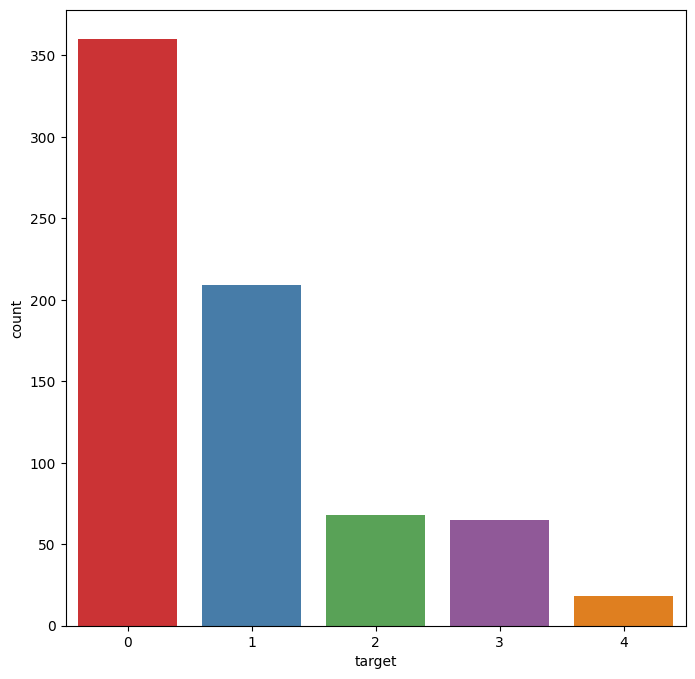

In [10]:
plt.figure(figsize=(8,8))
sns.countplot(x="target", data=df, palette = "Set1")

Construímos una tabla para ver las cantidades para cada categoría

In [11]:
pd.crosstab(index=df["target"], columns="count")

col_0,count
target,
0,360
1,209
2,68
3,65
4,18


Pocos valores para 2, 3 y 4 pero al tratarse del campo médico hay 2 caminos a seguir:
1. Reducimos todo a tiene (1) y no tiene (0).
2. Mantenemos las opciones ta lcual están pues se desconoce que acarréa que tenga afección cardiaca en 4, 3, 2, o 1. 

Teniendo en cuenta lo observado sobre la variable objetivo, creamos un transformer personalizado para realizar los cambios.

Creamos una función para cambiar los tipos de las variables independientes. Igualmente hacemos uso de un diccionario para transformar nuestros valores categóricos ordinales a numéricos.

In [12]:
# Creamos un Transformer personalizado formatea la variable objetivo
# Agrupamos valores con riesgo negativo
# Convertimos el tipo de la variable objetivo a categórica

from sklearn.base import BaseEstimator, TransformerMixin

class Format_target(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        result.loc[(result.target > 0), "target"] = 1
        result['target'] = result['target'].astype(int).astype(str) #paso primero a entero para que no me quede decimal cuando lo pase a decimal
        return result

In [13]:
df_modified = Format_target().fit_transform(df)

<Axes: xlabel='target', ylabel='count'>

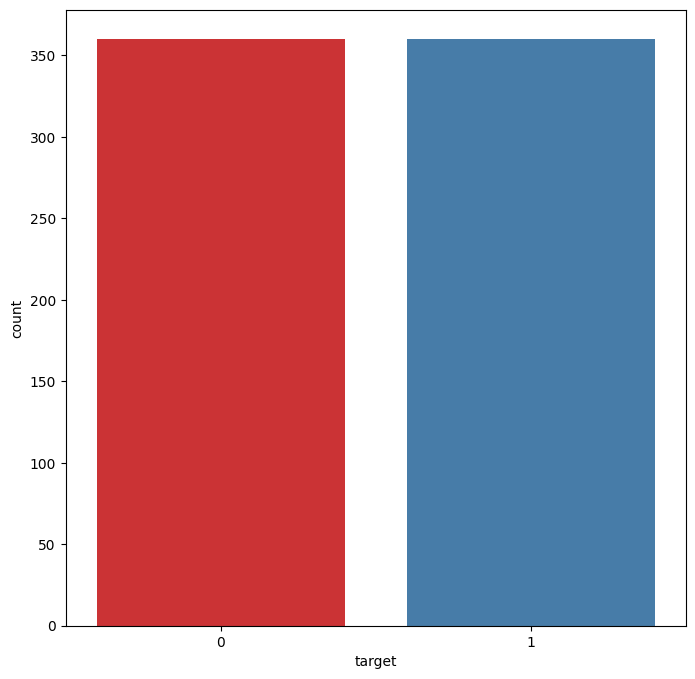

In [14]:
plt.figure(figsize=(8,8))
sns.countplot(x='target',data=df_modified, palette='Set1')

In [15]:
# Vemos la tabla luego del cambio

pd.crosstab(index=df_modified["target"], columns="count")

col_0,count
target,
0,360
1,360


Nuestro conjunto de datos parece más balanceado con respecto a la variable objetivo. Incluso, antes de realizar más cambios podemos observar la línea base que servirá como punto de partida  para los modelos que vamos a implementar. Al estar trabajando con una tarea de clasificación, utilizamos la clase mayoritaria, en este caso es el riesgo neutro.

In [16]:
df_modified['target'][df_modified['target'] == '0'].count()/df.shape[0]*100

50.0

**ACLARACIÓN**

De la forma anterior la variable target sería mucho más simple y fácil de trabajar pero de nuevo al tratarse de un tema de salud, médico y sabiendo que el ejercicio viene del origen de un análisis de ataques o infartos cardiacos en eseta versión lo abordaremos haciendo una fusión para simplmente para tratar de predecir si tiene o no una condición cardiaca enfermiza.

Ahora trabajaremos con los problemas encontrados en las variables independientes con respecto a valores que podrían ser faltantes y tipos de datos distintos a los indicados en el diccionario de datos.

In [17]:
def convert(df,columns,val):
    result = df.copy()
    for col in columns:
        result[col] = result[col].astype(val)
    return result


In [18]:
# Creamos un Transformer personalizado que nos cambia los valores ? por nulos
# Igualmente nos modifica los tipos de variables errados
class Format_variables(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        result = result.replace('?',np.nan)
        result = convert(result,['resting_blood_pressure','serum_cholestoral','maximum_heart_rate_achieved',
            'oldpeak_ST_depression_induced_by_exercise'],'float64')
        result = convert(result,['sex','chest_pain_type','target'],'object')
        return result 

In [19]:
df_modified = Format_variables().fit_transform(df_modified)

In [20]:
# Verificamos que los tipos de datos son los correctos
# Asimismo nos damos cuenta que ahora sí tenemos datos faltantes
df_modified.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 720 entries, 0 to 719
Data columns (total 15 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   location                                       720 non-null    object 
 1   age                                            720 non-null    float64
 2   sex                                            720 non-null    object 
 3   chest_pain_type                                720 non-null    object 
 4   resting_blood_pressure                         717 non-null    float64
 5   serum_cholestoral                              697 non-null    float64
 6   fasting_blood_sugar                            637 non-null    object 
 7   resting_electrocardiographic_results           718 non-null    object 
 8   maximum_heart_rate_achieved                    718 non-null    float64
 9   exercise_induced_angina                        718 non

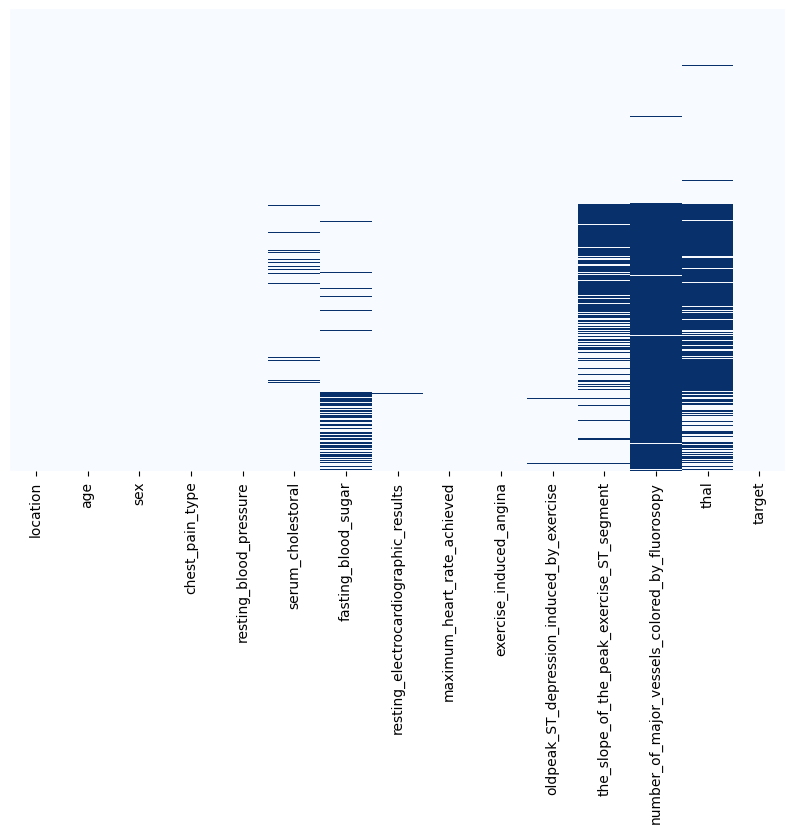

In [21]:
# Dibujamos un mapa de calor para vislumbrar la ubicación de los valores faltantes

plt.figure(figsize=(10,6))
sns.heatmap(df_modified.isnull(), yticklabels = False, cbar = False, cmap="Blues")
plt.show()

In [22]:
df_modified.isnull().sum()

location                                           0
age                                                0
sex                                                0
chest_pain_type                                    0
resting_blood_pressure                             3
serum_cholestoral                                 23
fasting_blood_sugar                               83
resting_electrocardiographic_results               2
maximum_heart_rate_achieved                        2
exercise_induced_angina                            2
oldpeak_ST_depression_induced_by_exercise          6
the_slope_of_the_peak_exercise_ST_segment        207
number_of_major_vessels_colored_by_fluorosopy    413
thal                                             320
target                                             0
dtype: int64

Cada columna tiene 720 registros y de las 15 (14 independientes y 1 dependiente) tenemos 10 con datos faltantes.

- resting_blood_pressure:                       3 faltantes
- serum_cholestoral:                            23 faltantes
- fasting_blood_sugar:                          83 faltantes
- resting_electrocardiographic_results:         2 faltantes
- maximum_heart_rate_achieved:                  2 faltantes
- exercise_induced_angina:                      2 faltantes
- oldpeak_ST_depression_induced_by_exercise:    6 faltantes
- the_slope_of_the_peak_exercise_ST_segment     207 faltantes
- number_of_major_vessels_colored_by_fluorosopy 413 faltantes
- thal                                          320 faltantes

¿Cómo manejar estos valores faltantes?
- Eliminar columnas o registros.
- Imputar con la media, frecuencia o con base en alguna función

En este caso trabajaremos de la siguiente manera:
- Imputación con la media (numéricas):
    - resting_blood_pressure
    - serum_cholestoral
    - maximum_heart_rate_achieved
    - oldpeak_ST_depression_induced_by_exercise
- Imputación con la moda:
    - fasting_blood_sugar
    - resting_electrocardiographic_results
    - exercise_induced_angina
    - the_slope_of_the_peak_exercise_ST_segment
    - thal
    - number_of_major_vessels_colored_by_fluorosopy

In [23]:
df_modified

,location,age,sex,chest_pain_type,resting_blood_pressure,serum_cholestoral,fasting_blood_sugar,resting_electrocardiographic_results,maximum_heart_rate_achieved,exercise_induced_angina,oldpeak_ST_depression_induced_by_exercise,the_slope_of_the_peak_exercise_ST_segment,number_of_major_vessels_colored_by_fluorosopy,thal,target
0,Cleveland,63.0,1,1,145.0,233.0,1,2,150.0,0,2.3,3,0,6,0
1,Cleveland,67.0,1,4,160.0,286.0,0,2,108.0,1,1.5,2,3,3,1
2,Cleveland,67.0,1,4,120.0,229.0,0,2,129.0,1,2.6,2,2,7,1
3,Cleveland,37.0,1,3,130.0,250.0,0,0,187.0,0,3.5,3,0,3,0
4,Cleveland,41.0,0,2,130.0,204.0,0,2,172.0,0,1.4,1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,Suiza,70.0,1,4,115.0,0.0,0,1,92.0,1,0.0,2,NaN,7,1
716,Suiza,70.0,1,4,140.0,0.0,1,0,157.0,1,2.0,2,NaN,7,1
717,Suiza,72.0,1,3,160.0,0.0,NaN,2,114.0,0,1.6,2,2,NaN,0
718,Suiza,73.0,0,3,160.0,0.0,0,1,121.0,0,0.0,1,NaN,3,1


**ACLARACIÓN**
Al ser datos de estudios médicos estas imputaciones no deberían hacerse, pero con el fin de seguir el ejercicio académico se procede. Tenemos entendidos que hay métodos para imputación de datos médicos como el MICE y otros. 

De ser posible profe nos podría señalar hacía donde podríamos ver esto. O si por lo contrario estamos siendo demasiado precavidos.

In [24]:
# Creamos un Transformer personalizado que nos imputa los valores faltantes
# Utiliza la media para columnas numéricas y la moda para las categóricas
class Imputer(BaseEstimator, TransformerMixin):
    def __init__(self, cont, cat):
        self.cont = cont
        self.cat = cat

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        for c in self.cont:
            avg = result[c].mean(axis=0)
            result[c].replace(np.nan,avg,inplace=True)
        for c in self.cat:
            mode = result[c].value_counts().idxmax()
            result[c].replace(np.nan,mode,inplace=True)
        return result

In [25]:
cont = ['resting_blood_pressure', 'serum_cholestoral', 'maximum_heart_rate_achieved', 'oldpeak_ST_depression_induced_by_exercise'
        ]
cat = ['fasting_blood_sugar', 'resting_electrocardiographic_results', 'exercise_induced_angina', 'the_slope_of_the_peak_exercise_ST_segment',
       'thal', 'number_of_major_vessels_colored_by_fluorosopy']

df_modified = Imputer(cont,cat).fit_transform(df_modified)

In [26]:
df_modified.info(all)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 720 entries, 0 to 719
Data columns (total 15 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   location                                       720 non-null    object 
 1   age                                            720 non-null    float64
 2   sex                                            720 non-null    object 
 3   chest_pain_type                                720 non-null    object 
 4   resting_blood_pressure                         720 non-null    float64
 5   serum_cholestoral                              720 non-null    float64
 6   fasting_blood_sugar                            720 non-null    object 
 7   resting_electrocardiographic_results           720 non-null    object 
 8   maximum_heart_rate_achieved                    720 non-null    float64
 9   exercise_induced_angina                        720 non

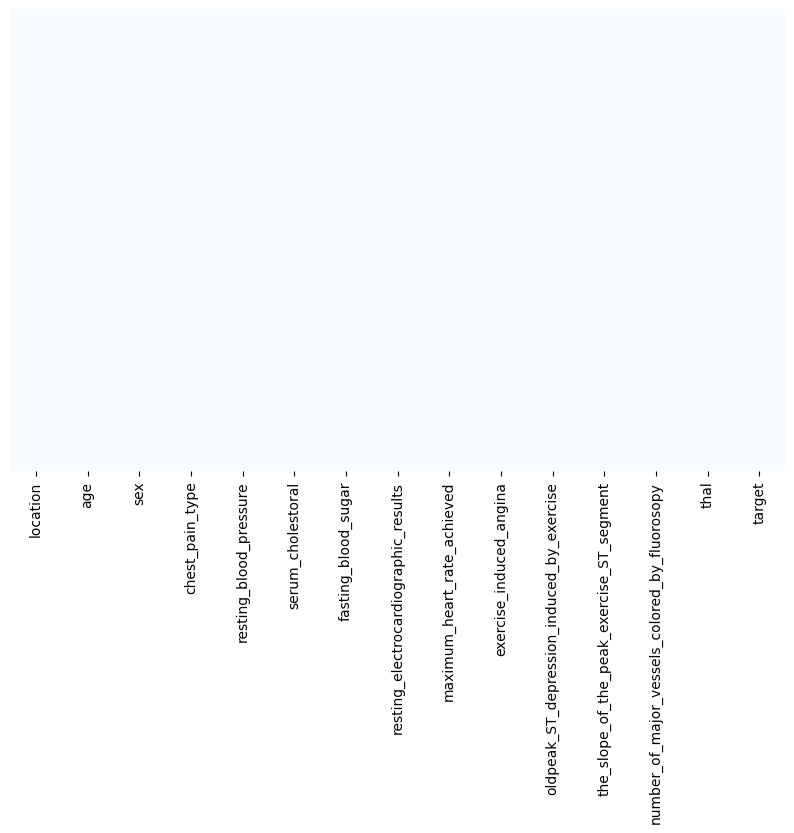

In [27]:
# Dibujamos un mapa de calor para vislumbrar la ubicación de los valores faltantes

plt.figure(figsize=(10,6))
sns.heatmap(df_modified.isnull(), yticklabels = False, cbar = False, cmap="Blues")
plt.show()

Observamos que ya no contamos con valores faltantes.

### Valores atípicos
Visualizamos utilizando
- Diagramas de cajas y bigotes
- Histogramas

In [65]:
# Función para graficar los valores continuos del dataframe
#def outliers_visual(data):
    #cont_vars = list(data.select_dtypes('number').columns)
    #plt.figure(figsize=(15, 60))
    #i = 0
    #val = int(len(cont_vars)/2) + 1
    #for col in cont_vars:
        #i += 1
        #plt.subplot(val, 4, i)
        #plt.boxplot(data[col])
        #plt.title('{} boxplot'.format(col))
        #i += 1
        #plt.subplot(val, 4, i)
        #plt.hist(data[col])
        #plt.title('{} histogram'.format(col))
        
    #plt.show()

In [28]:
# Función para graficar los valores continuos del dataframe
def outliers_visual(data):
    cont_vars = list(data.select_dtypes('number').columns)
    plt.figure(figsize=(15, len(cont_vars)*5))
    for i, col in enumerate(cont_vars):
        plt.subplot(len(cont_vars), 2, 2*i+1)
        plt.boxplot(data[col])
        plt.title('{} boxplot'.format(col))
        plt.subplot(len(cont_vars), 2, 2*i+2)
        plt.hist(data[col])
        plt.title('{} histogram'.format(col))
    plt.tight_layout()
    plt.show()


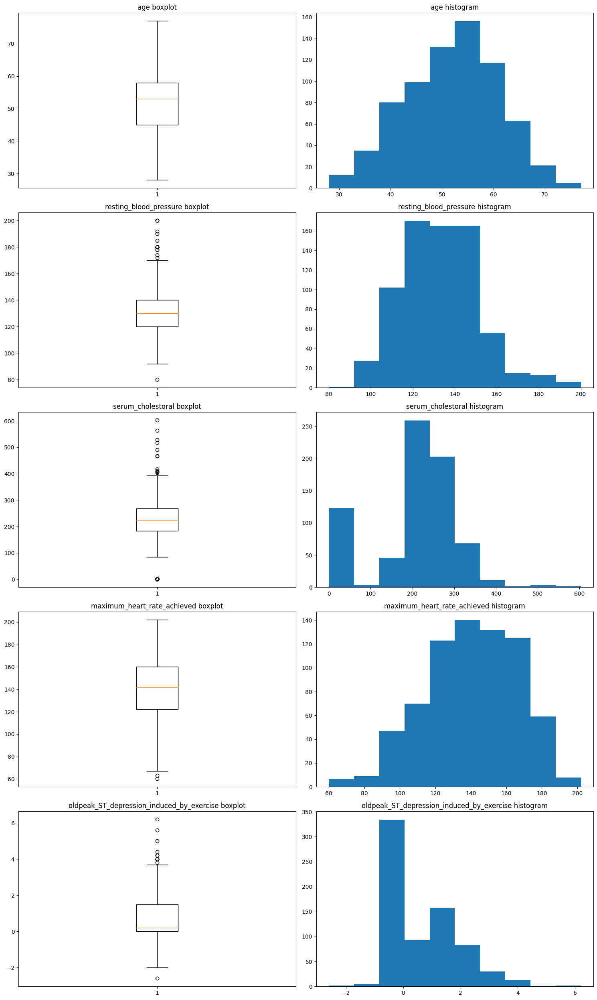

In [29]:
outliers_visual(df_modified)

In [30]:
df_modified

,location,age,sex,chest_pain_type,resting_blood_pressure,serum_cholestoral,fasting_blood_sugar,resting_electrocardiographic_results,maximum_heart_rate_achieved,exercise_induced_angina,oldpeak_ST_depression_induced_by_exercise,the_slope_of_the_peak_exercise_ST_segment,number_of_major_vessels_colored_by_fluorosopy,thal,target
0,Cleveland,63.0,1,1,145.0,233.0,1,2,150.0,0,2.3,3,0,6,0
1,Cleveland,67.0,1,4,160.0,286.0,0,2,108.0,1,1.5,2,3,3,1
2,Cleveland,67.0,1,4,120.0,229.0,0,2,129.0,1,2.6,2,2,7,1
3,Cleveland,37.0,1,3,130.0,250.0,0,0,187.0,0,3.5,3,0,3,0
4,Cleveland,41.0,0,2,130.0,204.0,0,2,172.0,0,1.4,1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,Suiza,70.0,1,4,115.0,0.0,0,1,92.0,1,0.0,2,0,7,1
716,Suiza,70.0,1,4,140.0,0.0,1,0,157.0,1,2.0,2,0,7,1
717,Suiza,72.0,1,3,160.0,0.0,0,2,114.0,0,1.6,2,2,3,0
718,Suiza,73.0,0,3,160.0,0.0,0,1,121.0,0,0.0,1,0,3,1


Utilizando los gráficos anteriores podemos observar las distribuciones para cada variable continua.

Visualmente resulta claro que existen outliers para algunas de las variables dentro del dataset:
- resting_blood_pressure
- serum_cholestoral
- maximum_heart_rate_achieved
- oldpeak_ST_depression_induced_by_exercise
- number_of_major_vessels_colored_by_fluorosopy

Podemos corroborar lo anterior de manera estadística haciendo uso del método de Tukey (se consideran como datos atípicos aquellos que están 1.5 veces por fuera del rango intercuartil)

In [31]:
# Función para calcular los datos atípicos utilizando el método de Tukey
def outlier_count(col, data):
    print(15*'-' + col + 15*'-')
    q75, q25 = np.percentile(data[col], [75, 25])
    iqr = q75 - q25
    min_val = q25 - (iqr*1.5)
    max_val = q75 + (iqr*1.5)
    outlier_count = len(np.where((data[col] > max_val) | (data[col] < min_val))[0])
    outlier_percent = round(outlier_count/len(data[col])*100, 2)
    print('Number of outliers: {}'.format(outlier_count))
    print('Percent of data that is outlier: {}%'.format(outlier_percent))
    return outlier_count

In [32]:
# Guardar las columnas de tipo continuas con datos atípicos
cont_vars = []
for col in list(df_modified.select_dtypes('number').columns):
    if outlier_count(col, df_modified) > 0:
        cont_vars.append(col)

---------------age---------------
Number of outliers: 0
Percent of data that is outlier: 0.0%
---------------resting_blood_pressure---------------
Number of outliers: 22
Percent of data that is outlier: 3.06%
---------------serum_cholestoral---------------
Number of outliers: 135
Percent of data that is outlier: 18.75%
---------------maximum_heart_rate_achieved---------------
Number of outliers: 2
Percent of data that is outlier: 0.28%
---------------oldpeak_ST_depression_induced_by_exercise---------------
Number of outliers: 12
Percent of data that is outlier: 1.67%


Teniendo en cuenta los gráficos previos y los estadísticos, se puede ver que existen cantidades diferentes de outliers para cada variable y hacia diferentes direcciones. Limitaremos a través de winsorizing

In [33]:
from scipy.stats.mstats import winsorize

wins_dict = {}

def test_wins(col, df, wins_dict, lower_limit=0, upper_limit=0, show_plot=True):
    wins_data = winsorize(df[col], limits=(lower_limit, upper_limit))
    wins_dict[col] = wins_data
    if show_plot == True:
        plt.figure(figsize=(15,5))
        plt.subplot(121)
        plt.boxplot(df[col])
        plt.title('original {}'.format(col))
        plt.subplot(122)
        plt.boxplot(wins_data)
        plt.title('wins=({},{}) {}'.format(lower_limit, upper_limit, col))
        plt.show()
    return wins_dict

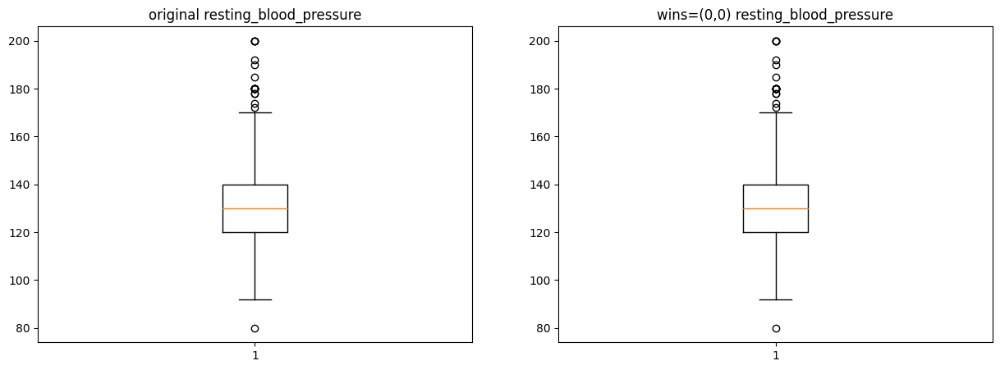

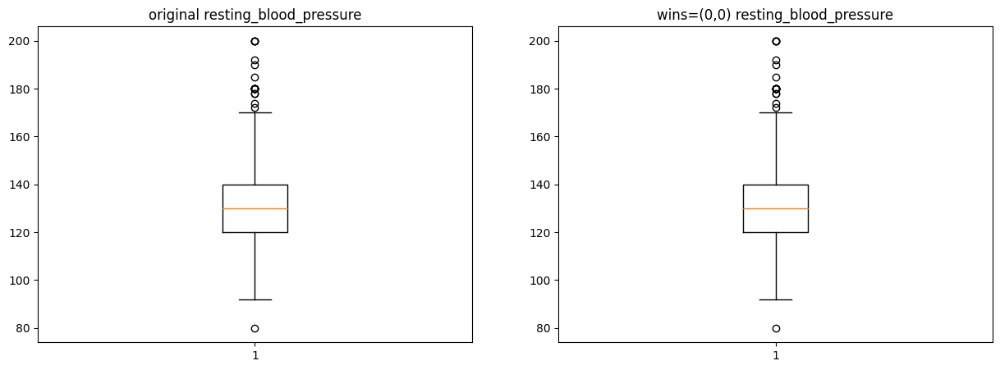

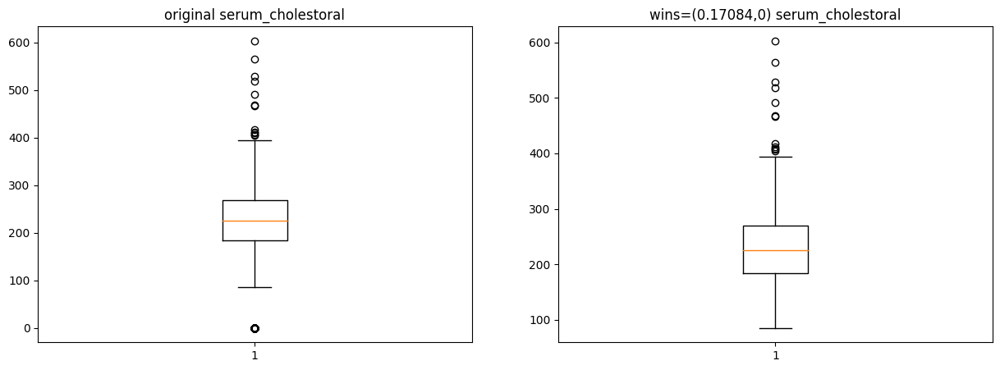

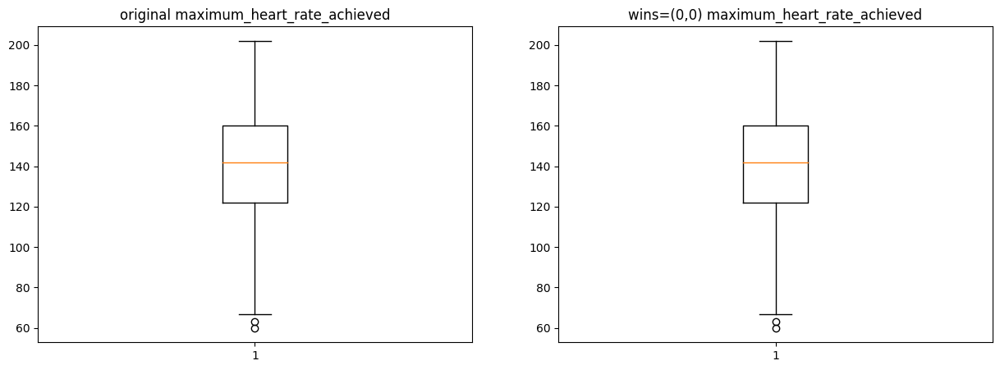

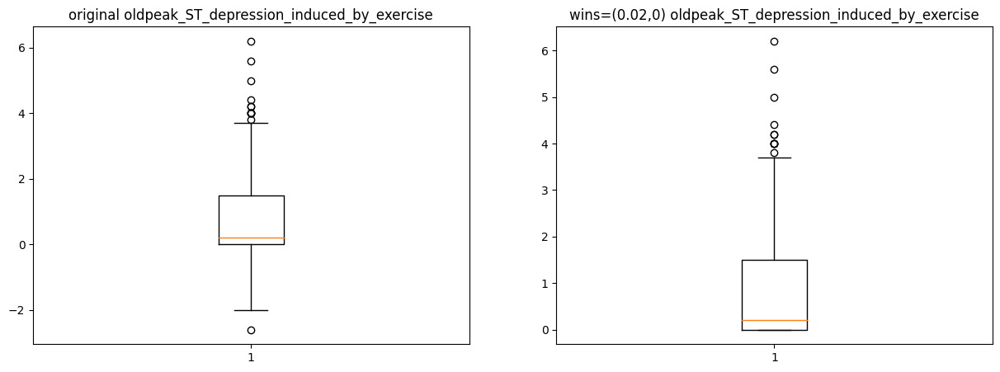

In [34]:
# Verificación de la winsorizing
wins_dict = {}
wins_dict = test_wins(cont_vars[0], df_modified, wins_dict, upper_limit=0, show_plot=True) #NO se ajusta
wins_dict = test_wins(cont_vars[0], df_modified, wins_dict, lower_limit=0, show_plot=True) #NO se ajusta
wins_dict = test_wins(cont_vars[1], df_modified, wins_dict, lower_limit=.17084, show_plot=True) #Se ajusta 
wins_dict = test_wins(cont_vars[2], df_modified, wins_dict, lower_limit=0, show_plot=True) #NO se ajusta
wins_dict = test_wins(cont_vars[3], df_modified, wins_dict, lower_limit=.02, show_plot=True) #Se ajusta


In [35]:
# Creamos un Transformer personalizado para limitar los outliers con el winsorizing
class Winsorizer(BaseEstimator, TransformerMixin):
    def __init__(self, wins, cont_vars):
        self.wins = wins
        self.cont_vars = cont_vars
        
    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        for col in cont_vars:
            result[col] = self.wins[col]     
        return result

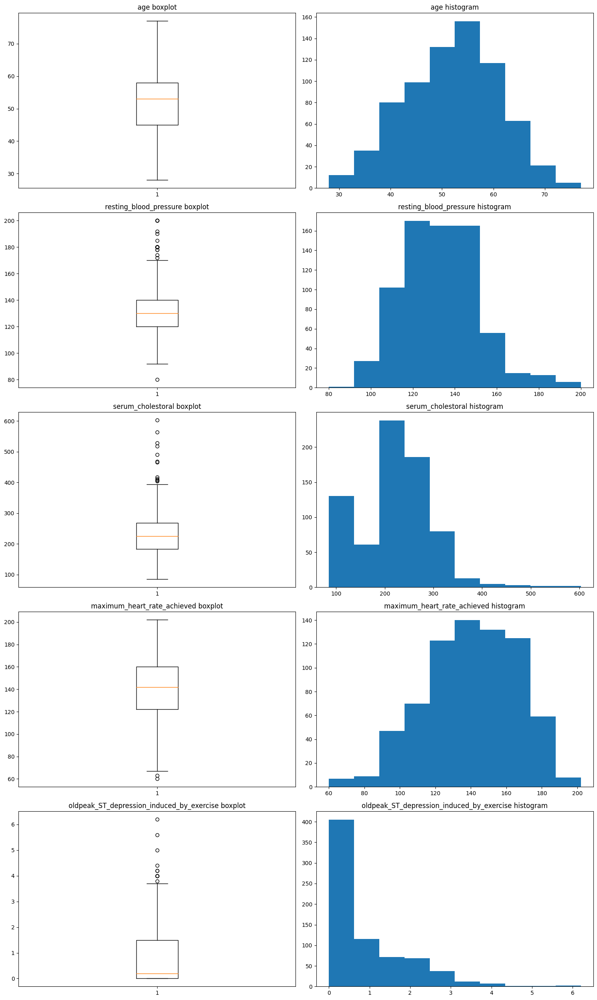

In [36]:
df_wins = Winsorizer(wins_dict,cont_vars).fit_transform(df_modified)
outliers_visual(df_wins)

**Aclaración**

Por motivos académicos decidimos hacer el protocolo para acomodar ciertos datos atípicos tratando de ceñirnos a conceptos de especialistas en el tema.

De acuerdo a eso al final solo se ajustaron 2 variables en sus límites bajos:
- serum_cholestoral (No hay valores de colesterol 0 en pacientes en la vida real)

- oldpeak_ST_depression_induced_by_exercise (No hay medidas o valores negativos en el segmento ST)

Todo esto teniendo en cuenta el dictamen de expertos. Claramente todo esto viene desde la imputación y demás creemos. 

Las demás variables que presentaban atípicos estadísticos no se modificaron o ajustaron debido a que representan valores reales que pueden tomar o tener un paciente.

### 4.2 Exploración de datos

#### Análisis univariado

In [37]:
# Descriptores estadísticos para valores continuos
df_wins.describe()

,age,resting_blood_pressure,serum_cholestoral,maximum_heart_rate_achieved,oldpeak_ST_depression_induced_by_exercise
count,720.000000,720.000000,720.000000,720.000000,720.000000
mean,51.888889,131.804742,219.295582,140.565460,0.806580
std,9.193720,18.490635,81.416504,25.611477,1.037402
min,28.000000,80.000000,85.000000,60.000000,0.000000
25%,45.000000,120.000000,184.000000,122.000000,0.000000
50%,53.000000,130.000000,225.000000,142.000000,0.200000
75%,58.000000,140.000000,269.000000,160.000000,1.500000
max,77.000000,200.000000,603.000000,202.000000,6.200000


In [38]:
# Descriptores estadísticos para valores categóricos
df_wins.describe(include='O')

,location,sex,chest_pain_type,fasting_blood_sugar,resting_electrocardiographic_results,exercise_induced_angina,the_slope_of_the_peak_exercise_ST_segment,number_of_major_vessels_colored_by_fluorosopy,thal,target
count,720,720,720,720,720,720,720,720,720,720
unique,3,2,4,2,3,2,5,5,5,2
top,Cleveland,1,4,0,0,0,2,0,3,0
freq,303,532,365,650,473,478,497,590,510,360


In [39]:
# Función para visualizar las distribuciones de las variables continuas
def visualize_distributions(df):
    cols = df.select_dtypes('number').columns
    val = int(len(cols)/2)+1
    plt.figure(figsize=(15, 20))
    for i, col in enumerate(cols, 1):
        plt.subplot(val, 3, i)
        plt.hist(df[col])
        plt.title(col)

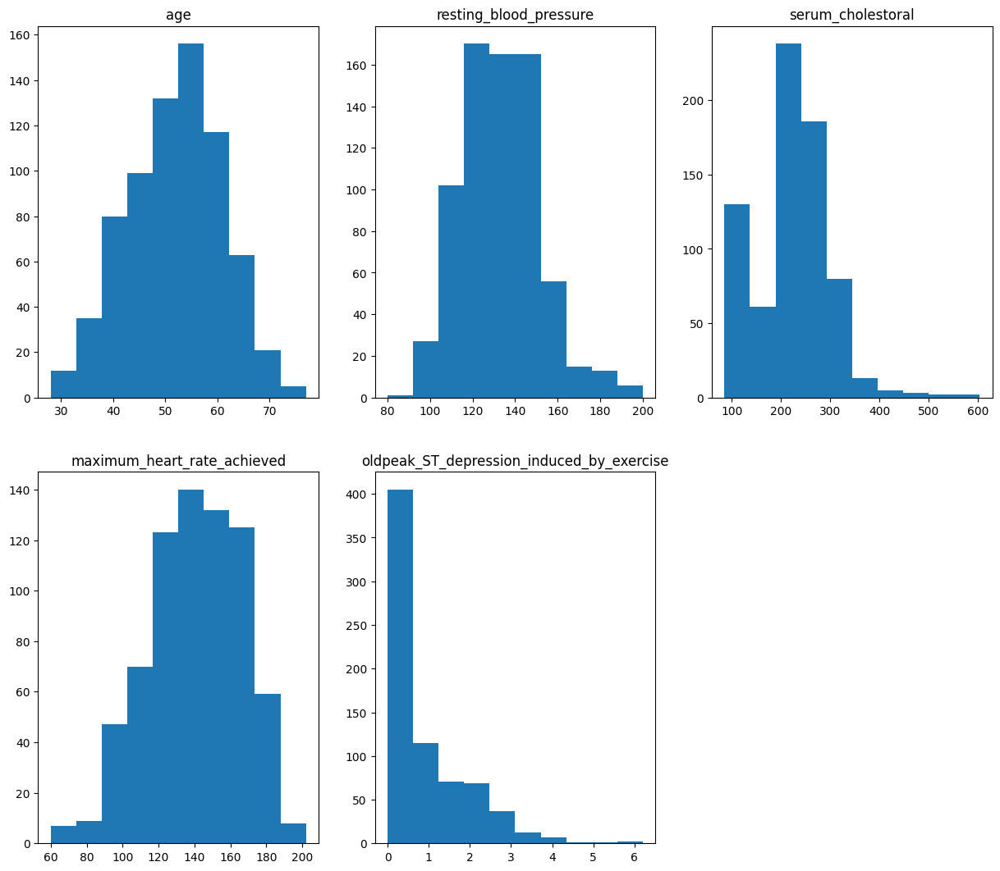

In [40]:
# Visualizamos la distribución de las variables continuas
visualize_distributions(df_wins)

Ahora demos un vistazo a las variables categóricas para ver su distribución y saber si necesitan algún ajuste:

In [41]:
# Función para visualizar las distribuciones de las variables categóricas
def visualize_distributions_cat(df):
    cols = df.select_dtypes('object').columns
    val = int(len(cols)/2)+1
    plt.figure(figsize=(15, 25))
    for i, col in enumerate(cols, 1):
        plt.subplot(val, 3, i)
        plt.hist(df[col])
        plt.title(col)

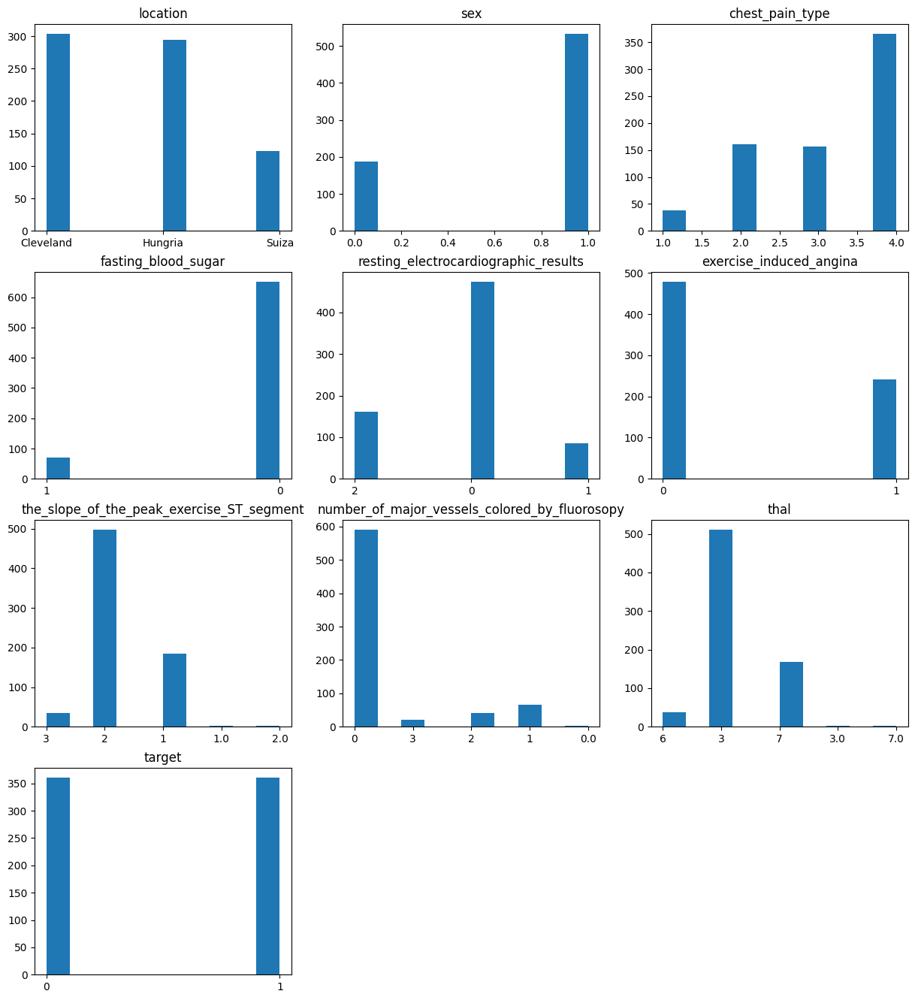

In [42]:
# Visualizamos la distribución de las variables categóricas
visualize_distributions_cat(df_wins)

Observamos que algunas han creados otros valores únicos debido a que tienen datos flotantes cuando deberían ser enteros, procedemos a hacer la transformación.
Como se evidencia en las variables:
- the_slope_of_the_peak_exercise_ST_segment
- number_of_major_vessels_colored_by_fluorosopy
- thal

In [43]:
def transform_float_int_str(data, columnas):
    for columna in columnas:
        data[columna] = data[columna].astype(float).astype(int).astype(str)
    return data

# Lista de variables categóricas
variables_categoricas = ['the_slope_of_the_peak_exercise_ST_segment', 
                         'number_of_major_vessels_colored_by_fluorosopy', 'thal']

# Aplicar la función al dataframe
df_wins = transform_float_int_str(df_wins, variables_categoricas)

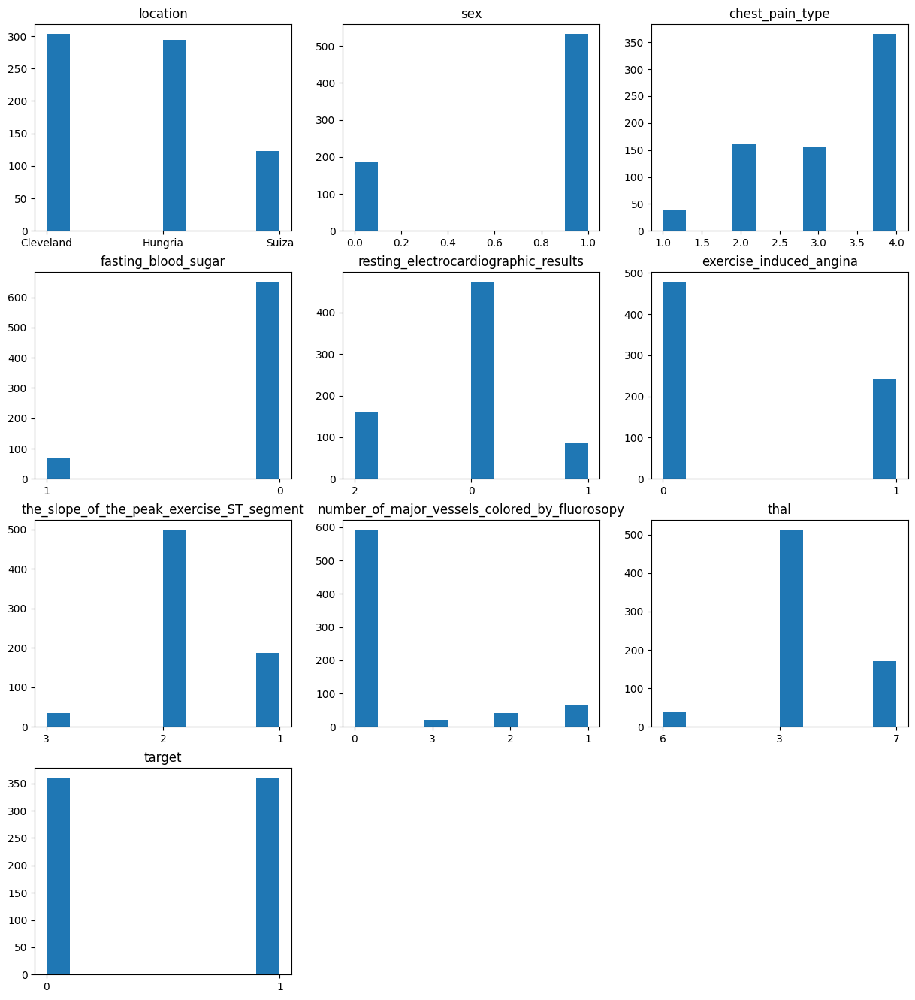

In [44]:
# Visualizamos la distribución de las variables categóricas
visualize_distributions_cat(df_wins)

Luego de realizar la limpieza de datos, imputando datos y winsorizing, logramos percibir distribuciones menos sesgadas.

Text(0.5, 0, 'sex')

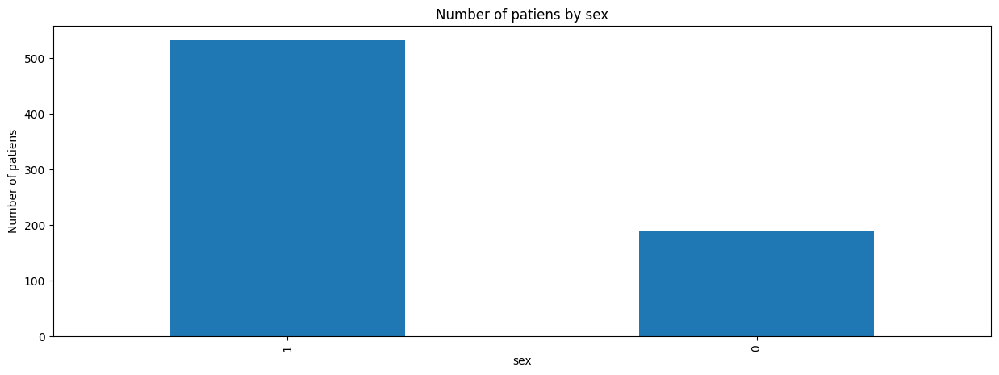

In [45]:
df_wins.sex.value_counts().nlargest(10).plot(kind='bar', figsize=(15,5))
plt.title("Number of patiens by sex")
plt.ylabel('Number of patiens')
plt.xlabel('sex')

Text(0.5, 0, 'chest pain type')

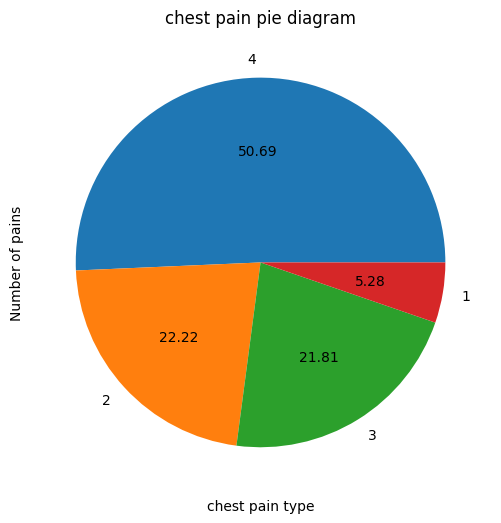

In [46]:
df_wins['chest_pain_type'].value_counts().plot.pie(figsize=(6, 6), autopct='%.2f')
plt.title("chest pain pie diagram")
plt.ylabel('Number of pains')
plt.xlabel('chest pain type')

Text(0.5, 0, 'serum_cholestoral')

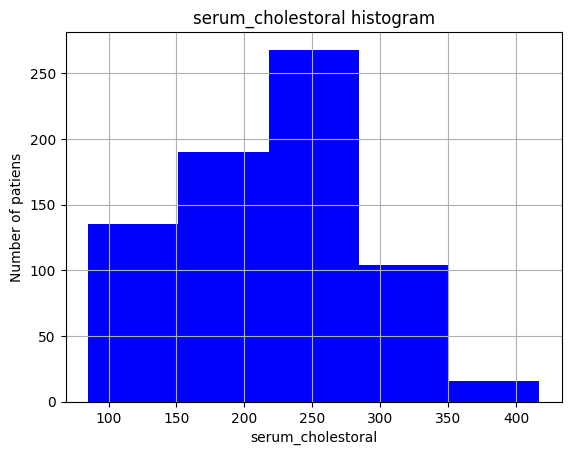

In [47]:
df_wins.serum_cholestoral[np.abs(df_wins.serum_cholestoral-df_wins.serum_cholestoral.mean())<=(3*df_wins.serum_cholestoral.std())].hist(bins=5,color='blue');
plt.title("serum_cholestoral histogram")
plt.ylabel('Number of patiens')
plt.xlabel('serum_cholestoral')

Text(0.5, 0, 'oldpeak_ST_depression_induced_by_exercise')

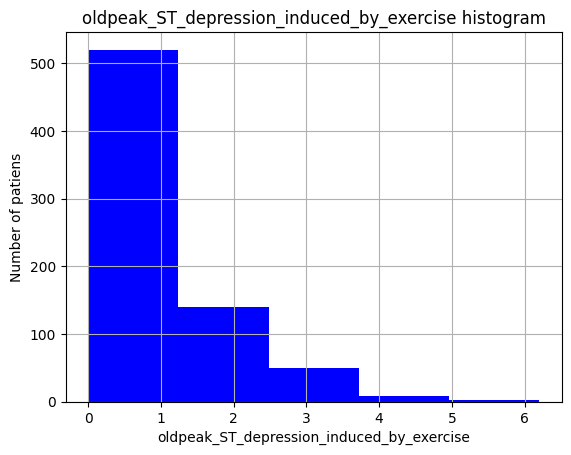

In [48]:
df_wins['oldpeak_ST_depression_induced_by_exercise'].hist(bins=5,color='blue')
plt.title("oldpeak_ST_depression_induced_by_exercise histogram")
plt.ylabel('Number of patiens')
plt.xlabel('oldpeak_ST_depression_induced_by_exercise')

Text(0.5, 0, 'number_of_major_vessels_colored_by_fluorosopy')

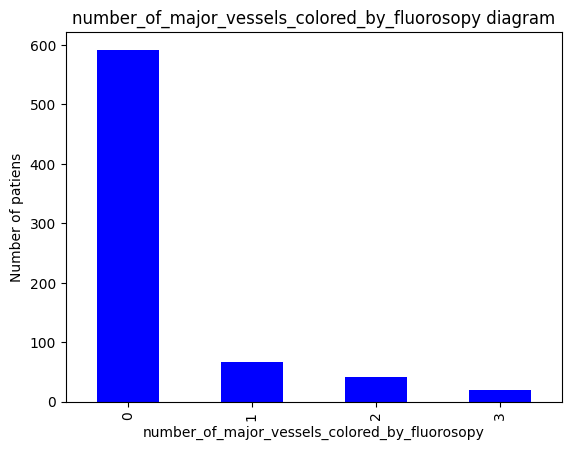

In [49]:
df_wins['number_of_major_vessels_colored_by_fluorosopy'].value_counts().plot(kind='bar',color='blue')
plt.title("number_of_major_vessels_colored_by_fluorosopy diagram")
plt.ylabel('Number of patiens')
plt.xlabel('number_of_major_vessels_colored_by_fluorosopy')

Text(0.5, 0, 'thal')

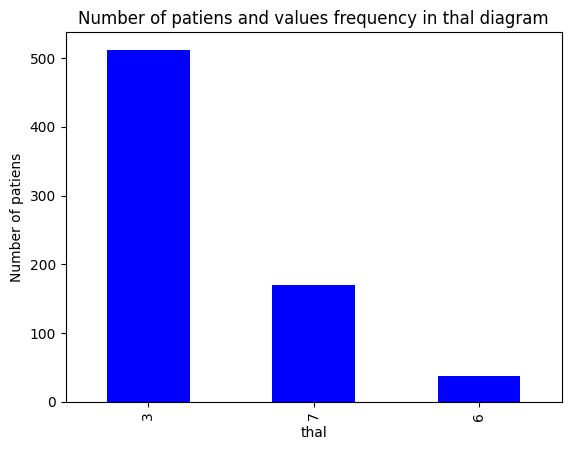

In [50]:
df_wins['thal'].value_counts().plot(kind='bar',color='blue')
plt.title("Number of patiens and values frequency in thal diagram")
plt.ylabel('Number of patiens')
plt.xlabel('thal')

Text(0.5, 0, 'exercise_induced_angina')

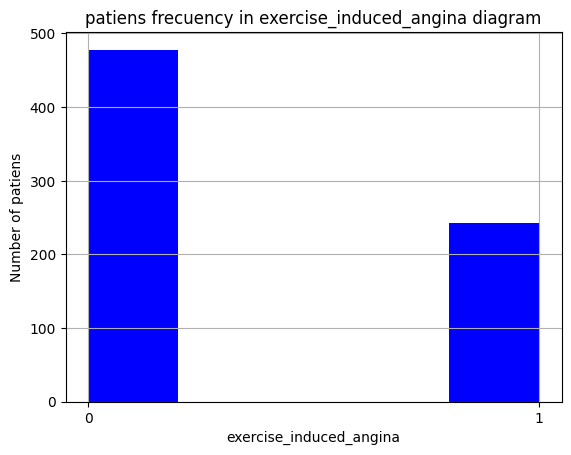

In [51]:
df_wins['exercise_induced_angina'].hist(bins=5,color='blue')
plt.title("patiens frecuency in exercise_induced_angina diagram")
plt.ylabel('Number of patiens')
plt.xlabel('exercise_induced_angina')

A partir del anterior del anterior análisis obtenemos los siguientes hallazgos:

- La población predomina en sexo = 1, se asume es másculino segun investigacíon del origen de la tarea. manejando un poco más del doble de la población con sexo = 0 femenino.
- El dolor de pecho que predomina es el tipo 4 contando con mas del 50% del total.
- Los valores de colesterol en sangre predominan en valores en rango normales 
- El último pico o medida des un ataque de segmento ST muestra gran población sin afección.
- thal, muestra que el tipo que predomina es el 3, el cual indica normalidad segun investigación.

#### Análisis Bivariado

Haciendo uso del diagrama de cajas y bigotes obtendremos un resumen visual de la distribución de cada una de las variables independientes con respecto a la dependiente, observando así la distribución de los distintos grupos.

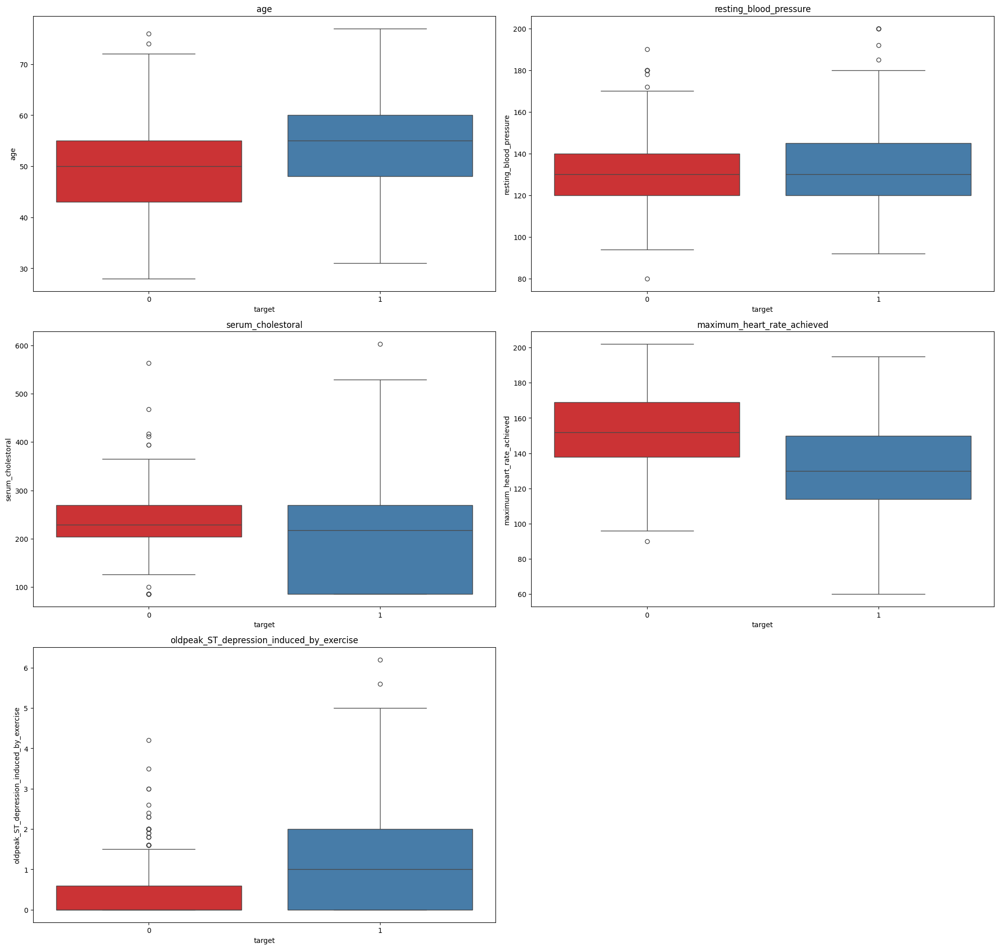

In [52]:
fig = plt.figure(figsize=(20,50))
i=1

for var_num in df_wins.select_dtypes(include=['int64','float64']):
    ax = fig.add_subplot(8, 2, i)
    sns.boxplot(x=df_wins.columns[14], y=var_num, data=df_wins, palette='Set1')
    plt.title(var_num)
    i+=1
fig.tight_layout()

Conociendo un poco acerca de las distribuciones de las variables con respecto a la variable objetivo, nos podemos dar una primera idea sobre cuáles características podrían resultar siendo más importantes al momento de influir en la variable objetivo. Esto resulta útil pues al incluirlas, nuestro modelo puede brindarnos mejores resultados en cuanto a correctitud de la predicción.

Observando las medianas de cada grupo (características) nos puede mostrar si verdaderamente existe una relación entre dicha variable independiente y la objetivo.

El tamaño de la caja nos puede mostrar la variabilidad dentro de esa característica.

Por ejemplo podemos notar que:

- age evidentemente indica una relación directamente proporcional con el target (Diagnostico de enfermedad cardiaca). Es decir, mayores edades claramente indica mayor valor de target, que en otras palabras es una mayor posibilidad de enfermedad cardiaca.
- mayor tamaño del oldpeak asociado a mayor riesgo de enfermedad cardiaca (target más alto)

Para ratificar algunos de estos descubrimientos utilizamos un diagrama de violín. Al ser estos unos diagramas que combinan los boxplots y los diagramas de densidad, nos pueden dar una noción de qué variables independientes pueden sernos de mayor untilidad para distinguir entre las distintas categorías de la variable objetivo.


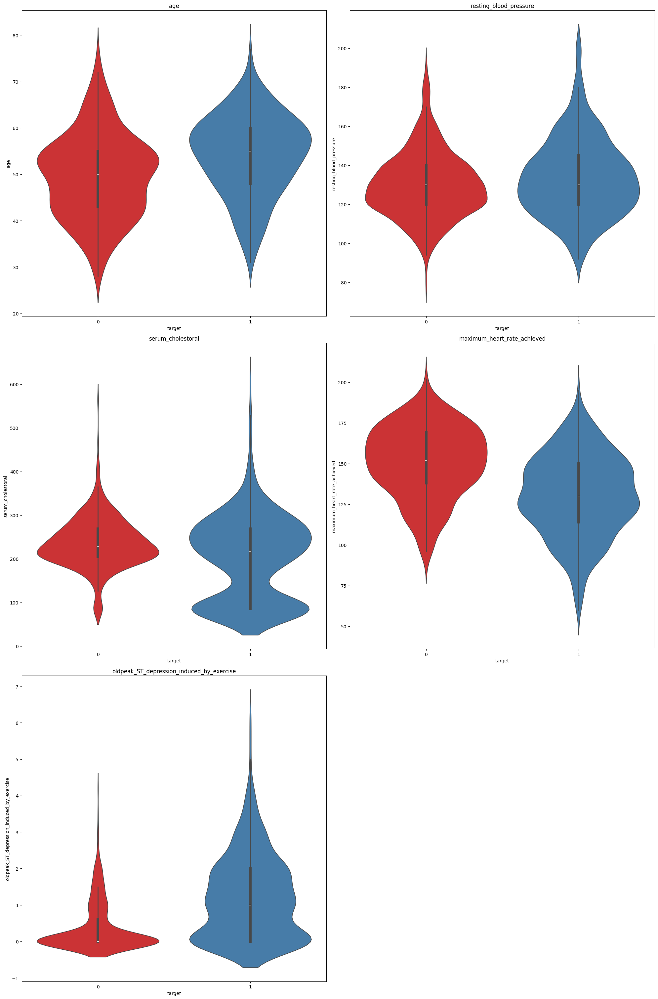

In [53]:
fig = plt.figure(figsize=(20,50))
i=1

for var_num in df_wins.select_dtypes(include=['int64','float64']):
    ax = fig.add_subplot(5, 2, i)
    sns.violinplot(x=df_wins.columns[14], y=var_num, data=df_wins, palette='Set1')
    plt.title(var_num)
    i+=1
fig.tight_layout()

Vamos a ubicar los registros de acuerdo a su categoría, de manera que podamos dibujar nuestro diagrama de densidad.

In [54]:
df_wins.target.describe(include='O')

count     720
unique      2
top         0
freq      360
Name: target, dtype: object

In [67]:
def categories(df):
    risks = {}
    risks["0"] = df.loc[df.target == '0']
    risks["1"] = df.loc[df.target == "1"]
    return risks 

# probar miranddo los valores no como numero sino como caracteres es decir entre ''

Con el diagrama de densidad se puede observar aquellas variables independientes que mejor 
discriminan las clases de la variable objetivo.

**Aquí voy¨** Paro no se porqué no me grafica... 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


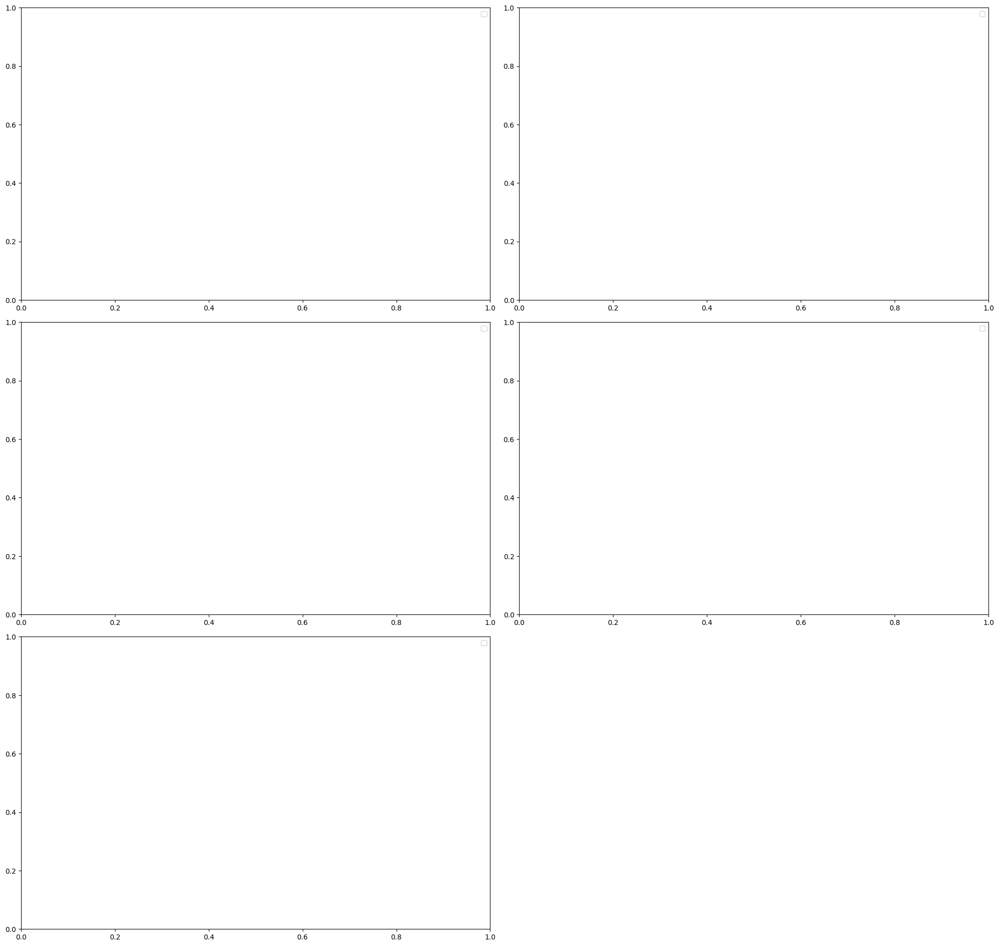

In [87]:
risks = categories(df_wins)

i=1
fig = plt.figure(figsize=[20, 50])
for var_num in df_wins.select_dtypes('number').columns:
    ax = fig.add_subplot(8, 2, i)
    sns.kdeplot(risks['0'][[var_num]].iloc[:,0], shade=True, color="b", label="Risk = 0",palette='Set1')
    sns.kdeplot(risks['1'][[var_num]].iloc[:,0], shade=True, color="r", label="Risk = 1",palette='Set1')
    plt.legend()
    i+=1
fig.tight_layout()

Utilizando los gráficos de densidad logramos percibir que algunas features nos permiten distinguir la variable objetivo, mientras otras no nos brindan mayor información.

Dentro de las candidatas podríamos tener:
- age
- serum_cholestoral
- oldpeak_ST_depression_induced_by_exercise

Pero al tratarse de un tema de salud y al ser tan pocas en este casó específico vamos con todas.

In [88]:
df_wins.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 720 entries, 0 to 719
Data columns (total 15 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   location                                       720 non-null    object 
 1   age                                            720 non-null    float64
 2   sex                                            720 non-null    object 
 3   chest_pain_type                                720 non-null    object 
 4   resting_blood_pressure                         720 non-null    float64
 5   serum_cholestoral                              720 non-null    float64
 6   fasting_blood_sugar                            720 non-null    object 
 7   resting_electrocardiographic_results           720 non-null    object 
 8   maximum_heart_rate_achieved                    720 non-null    float64
 9   exercise_induced_angina                        720 non

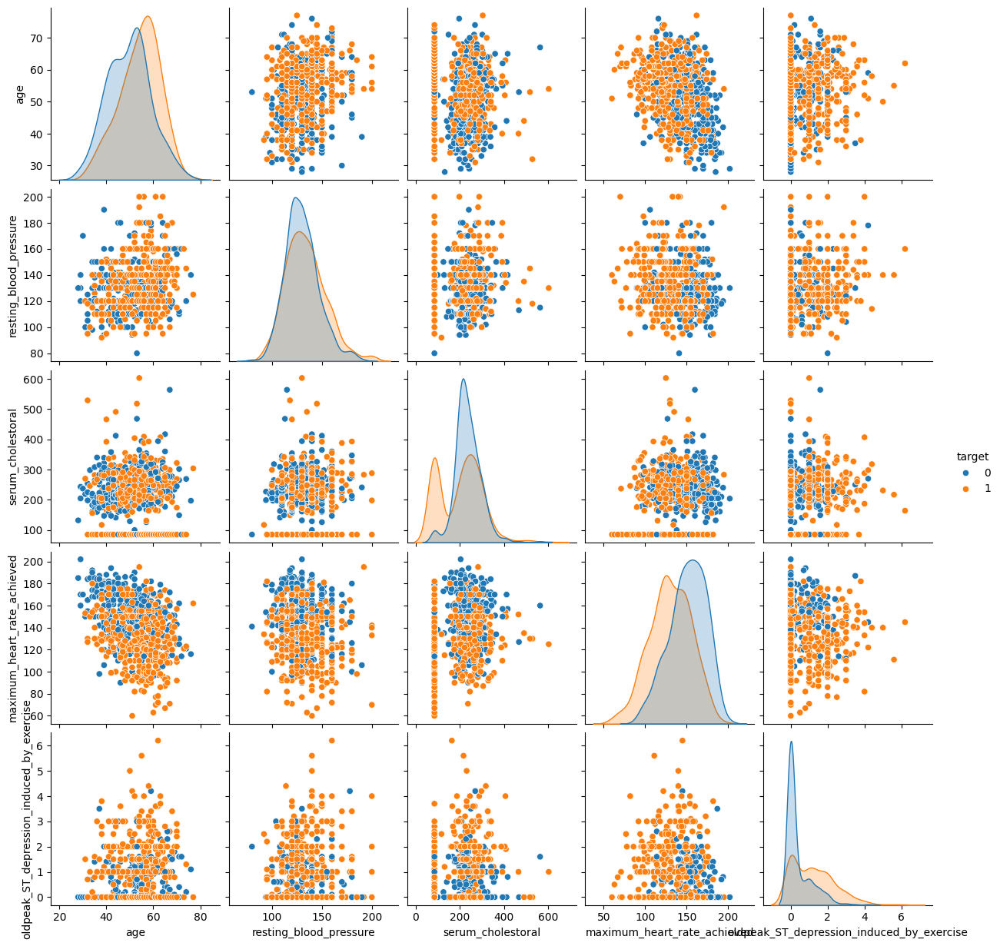

In [89]:

ax = sns.pairplot(df_wins, vars=['age','resting_blood_pressure', 'serum_cholestoral', 
                                 'maximum_heart_rate_achieved', 'oldpeak_ST_depression_induced_by_exercise'],
                  hue="target")

Haciendo uso de los pairplots de aquellas variables que mejor discriminaban la variable objetivo, intentamos encontrar combinaciones que nos ayuden a distinguir mejor los 5 grupos de riesgo que tenemos en nuestra variable objetivo target.

Definitivamente no resulta claro un par de variables que nos discrimene la variable objetivo

### Matriz de correlación

Vamos a utilizar la matriz de correlación para corroborar los indicios sobre las relaciones presentes entre algunas de las características y la variable objetivo.

El uso de la matriz de correlación es importante para conocer la correlación entre cada par de variables
- Las variables independientes a utilizar deberían estar altamente correlacionadas con la objetivo
- Se deben evitar problemas de multicolinealidad
- Las variables independientes no deben estar correlacionadas entre sí
- Si las variables independientes se encuentran altamente correlacionadas, el modelo puede presentar problemas al momento de entrenarlo e interpretarlo. No se podría aislar la relación entre cada variable independiente y la dependiente. Si no se pueden aislar los efectos, se pueden confundir dichos efectos
- Cuando las variables independientes están muy correlacionadas entre sí los cambios en una variable están asociados con cambios en otra variable y, por tanto, los coeficientes de regresión del modelo ya no van a medir el efecto de una variable independiente sobre la respuesta manteniendo constante, o sin variar, el resto de predictores. 
- Al contar con variables categóricas (la dependiente y varias dependientes) no podemos utilizar la matriz de correlación clásica que utiliza el coeficiente de correlación de Pearson ya que este tan sólo nos sirve para relación entre variables continuas.
- Al haber varias características categóricas utilizamos la función associations de dython que utiliza el coeficiente de Pearson para continuas vs continuas, la razón de correlación para continuas vs categóricas y Cramer's V o Theil's U para categóricas vs categóricas

In [90]:
# Utilizamos la librería dython para identificar las variables categóricas y numéricas

from dython.nominal import identify_nominal_columns, identify_numeric_columns, correlation_ratio
categorical_features=identify_nominal_columns(df_wins)
continuous_features=identify_numeric_columns(df_wins)
categorical_features

['location',
 'sex',
 'chest_pain_type',
 'fasting_blood_sugar',
 'resting_electrocardiographic_results',
 'exercise_induced_angina',
 'the_slope_of_the_peak_exercise_ST_segment',
 'number_of_major_vessels_colored_by_fluorosopy',
 'thal',
 'target']

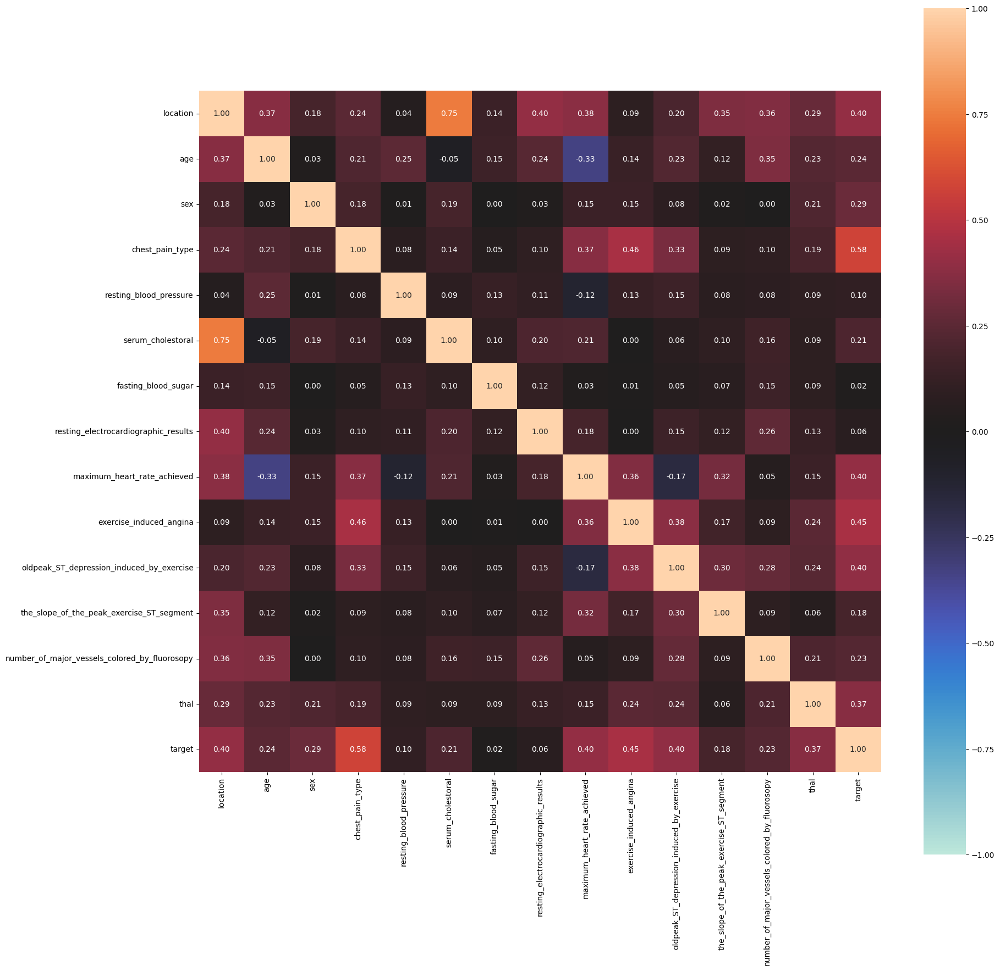

In [91]:

from dython.nominal import associations
complete_correlation= associations(df_wins, filename= r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\correlations_img_corazon_V2\complete_correlation.png', figsize=(20,20))


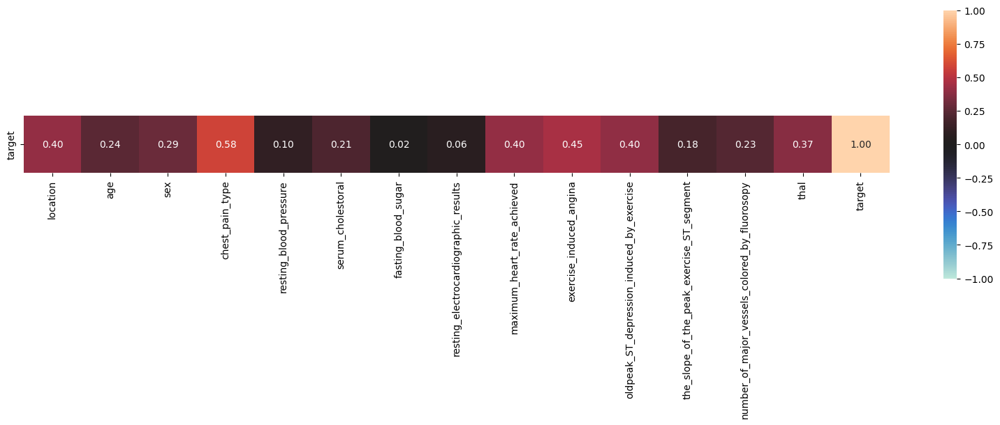

In [92]:
target_correlation= associations(df_wins, display_rows=['target'], filename= r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\correlations_img_corazon_V2\target_correlation.png', figsize=(20,5))

Detallamos primero las variables independientes que más influencian a la objetivo (aunque ninguna tiene una alta correlación >= 0.7 o <= -0.7) en orden descendente es decir de mayor a menor importancia:
- exercise_induced_angina
- oldpeak_ST_depression_induced_by_exercise
- maximum_heart_rate_achieved
- location (En realidad sabemos que no pero académicamente es la 4ta. Se intuye que es debido a que la mayoría del conjunto de datos proviene originalmnete de donde se hizo el estudio Cleveland)
- thal
- chest_pain_type
- age, sex (NO olvidemos que la poblacion predominante es masculina)

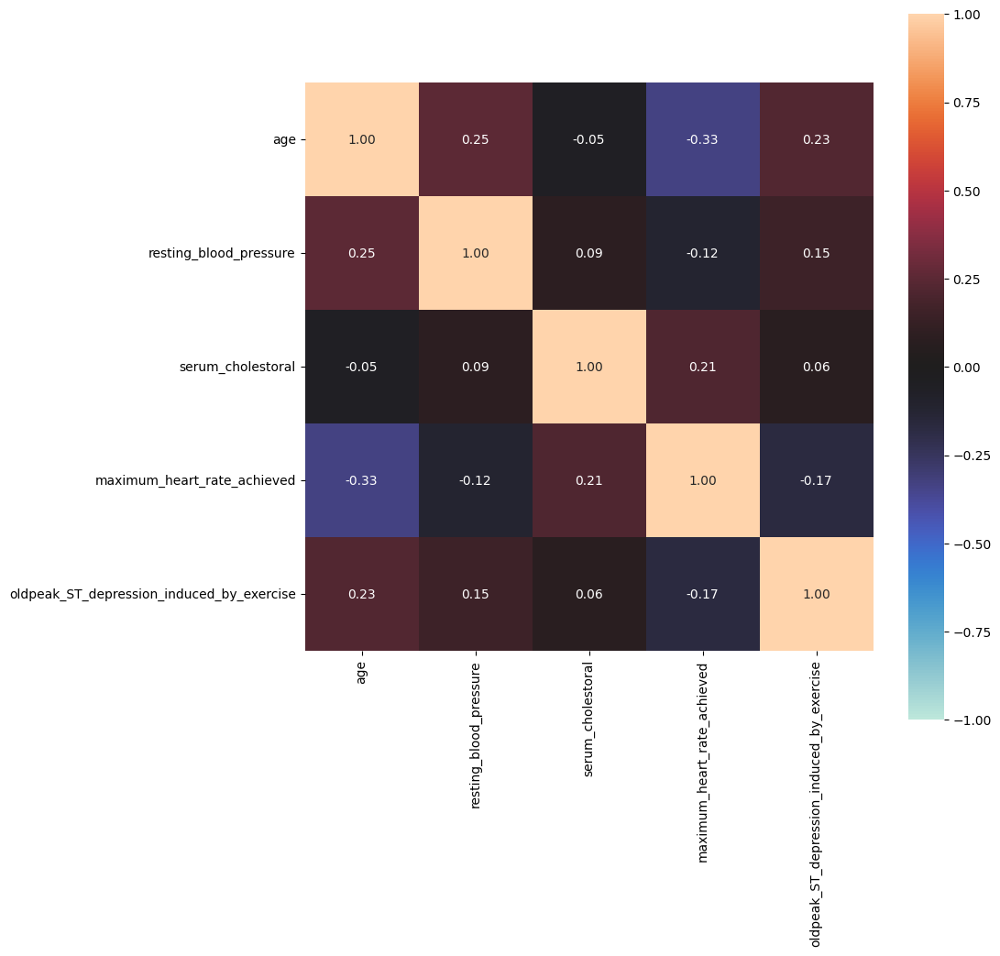

In [93]:
# Obtenemos la matriz de correlación entre las variables continuas

selected_column= df_wins[continuous_features]
continuous_df = selected_column.copy()

continuous_correlation= associations(continuous_df, filename= r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\correlations_img_corazon_V2\continuous_correlation.png', figsize=(10,10))

Revisamos aquellas variables independientes continuas que pueden llegar a generar problemas al encontrarse altamente correlacionadas entre sí (problemas de multicolinealidad, redundancia, complejitud innecesaria del modelo):
- age y resting_blood_pressure 0.25
- age y oldpeak_ST_depression_induced_by_exercise 0.23
- serum_cholestoral y maximum_heart_rate_achieved 0.21

En realidad son valores bajos pero para el ejercicio académico se dejan anotados. Además en el campo de la salud según los expertos no debemos desechar ninguna de estas.

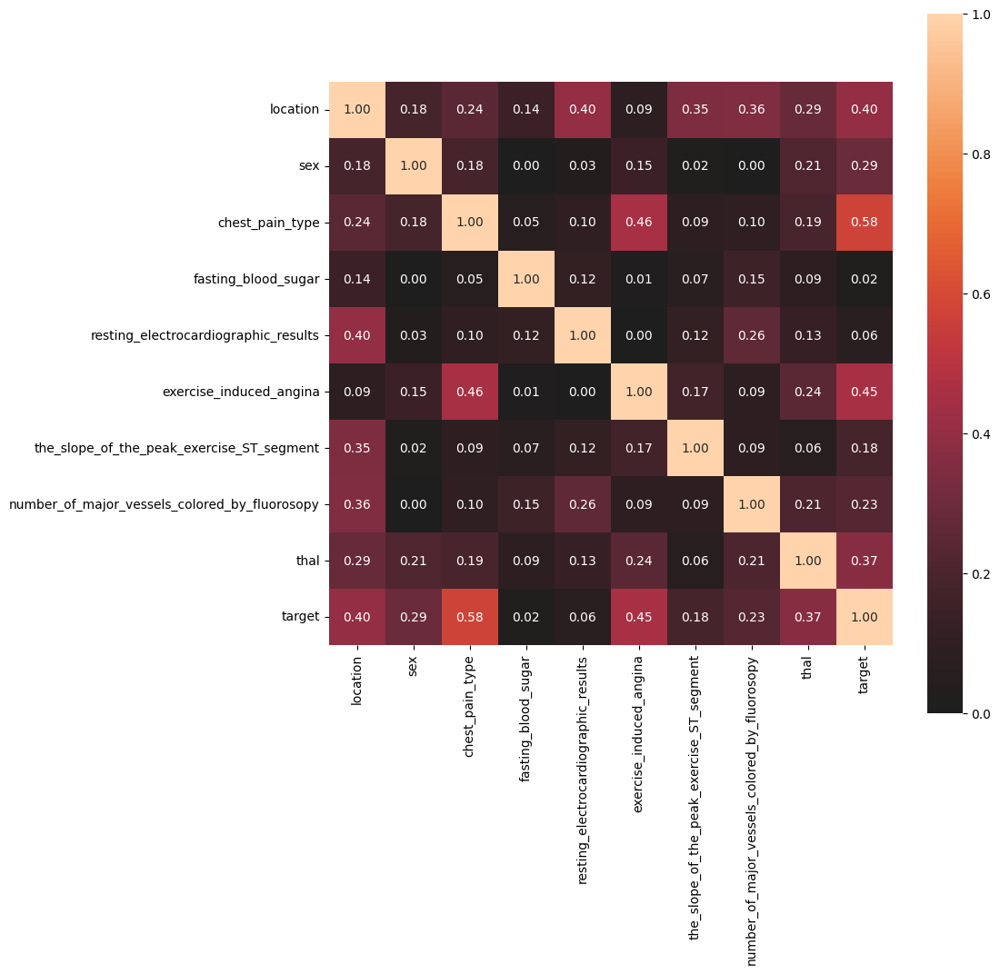

In [94]:
# Obtenemos la matriz de correlación entre las variables categoricas

selected_column= df_wins[categorical_features]
categorical_df = selected_column.copy()

categorical_correlation= associations(categorical_df, filename= r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\correlations_img_corazon_V2\categorical_correlation.png', figsize=(10,10))

Revisamos aquellas variables independientes categóricas que pueden llegar a generar problemas al encontrarse altamente correlacionadas entre sí (redundacia y complejidad innecesaria del modelo) pero no hay ninguna que esté por encima de 0.7 las más altas son las siguientes:
- exercise_induce_angina y chest_pain_type 0.46
- target y exercise_induced_angina 0.46
- chest_pain_type y exercise_induced_angina 0.46 

### 4.3. Ingeniería de características

Vamos a eliminar y/o crear nuevas características que nos resulten útiles para la futura implementación de nuestros modelos

Las siguientes variables podemos considerarlas como altamente correlacionadas entre sí (correlación >= .7 o correlación <= -.7):

En este apartado no se encuentra ninguna variable significante. Por este motivo y por concepto de experto se procede a usar todas.

Puede resultar útil eliminar las variables que no se encuentren muy correlacionadas con target.
Por concepto de los expertos no eliminamos ninguna.

In [95]:
print(correlation_ratio(categories=df_wins['target'],measurements=df_wins['age']))
print(correlation_ratio(categories=df_wins['target'],measurements=df_wins['resting_blood_pressure']))

0.24278595417458237
0.1020598233983358


In [35]:
# Creamos un Transformer personalizado para realizar la eliminación de variables
# a partir de sus correlaciones
class Remove_highly_correlated_features(BaseEstimator, TransformerMixin):
    def __init__(self,elims):
        self.elims = elims
        
    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        result = result.drop(columns=self.elims)
        return result

In [36]:
cols = ['resting_blood_pressure'] # Columna a eliminar en este caso solo 1

df_elims = Remove_highly_correlated_features(cols).fit_transform(df_wins)
df_elims

,location,age,sex,chest_pain_type,serum_cholestoral,fasting_blood_sugar,resting_electrocardiographic_results,maximum_heart_rate_achieved,exercise_induced_angina,oldpeak_ST_depression_induced_by_exercise,the_slope_of_the_peak_exercise_ST_segment,number_of_major_vessels_colored_by_fluorosopy,thal,target
0,Cleveland,63.0,1,1,233.0,1,2,150.0,0,2.3,3,0,6,0
1,Cleveland,67.0,1,4,286.0,0,2,108.0,1,1.5,2,3,3,2
2,Cleveland,67.0,1,4,229.0,0,2,129.0,1,2.6,2,2,7,1
3,Cleveland,37.0,1,3,250.0,0,0,187.0,0,3.5,3,0,3,0
4,Cleveland,41.0,0,2,204.0,0,2,172.0,0,1.4,1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,Suiza,70.0,1,4,85.0,0,1,92.0,1,0.0,2,0,7,1
716,Suiza,70.0,1,4,85.0,1,0,157.0,1,2.0,2,0,7,3
717,Suiza,72.0,1,3,85.0,0,2,114.0,0,1.6,2,2,3,0
718,Suiza,73.0,0,3,85.0,0,1,121.0,0,0.0,1,0,3,1


In [37]:
# Creamos un Transformer personalizado para dummificar las variables categóricas
class Dummify(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        result = pd.get_dummies(result,columns=result.select_dtypes('object').drop(columns=['target']).columns,dtype=float)
        return result

In [38]:
df_elims_dummified = Dummify().fit_transform(df_elims)
df_elims_dummified

,age,serum_cholestoral,maximum_heart_rate_achieved,oldpeak_ST_depression_induced_by_exercise,target,location_Cleveland,location_Hungria,location_Suiza,sex_0,sex_1,...,the_slope_of_the_peak_exercise_ST_segment_1,the_slope_of_the_peak_exercise_ST_segment_2,the_slope_of_the_peak_exercise_ST_segment_3,number_of_major_vessels_colored_by_fluorosopy_0,number_of_major_vessels_colored_by_fluorosopy_1,number_of_major_vessels_colored_by_fluorosopy_2,number_of_major_vessels_colored_by_fluorosopy_3,thal_3,thal_6,thal_7
0,63.0,233.0,150.0,2.3,0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,67.0,286.0,108.0,1.5,2,1.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
2,67.0,229.0,129.0,2.6,1,1.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
3,37.0,250.0,187.0,3.5,0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
4,41.0,204.0,172.0,1.4,0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,70.0,85.0,92.0,0.0,1,0.0,0.0,1.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
716,70.0,85.0,157.0,2.0,3,0.0,0.0,1.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
717,72.0,85.0,114.0,1.6,0,0.0,0.0,1.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
718,73.0,85.0,121.0,0.0,1,0.0,0.0,1.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0


Teniendo en cuenta que uno de los hallazgos importantes fue la alta correlación existente entre las variables independientes podemos aplicar PCA para reducir dimensiones y utilizar variables nuevas con mucha mayor información. 

Estandarizamos primero, pues de no hacerlo, al PCA basarse en distancias, se tendrán las variables nuevas fuertemente influenciadas por las variables originales de mayor escala.

In [39]:
# Usamos el estarizador
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_wins.select_dtypes('number'))
df_scaled = pd.DataFrame(df_scaled, columns=df_wins.select_dtypes('number').columns)
df_scaled.head()

,age,resting_blood_pressure,serum_cholestoral,maximum_heart_rate_achieved,oldpeak_ST_depression_induced_by_exercise
0,1.209395,0.714115,0.168442,0.368628,1.440578
1,1.644777,1.525900,0.819868,-1.272402,0.668884
2,1.644777,-0.638861,0.119278,-0.451887,1.729963
3,-1.620589,-0.097671,0.377390,1.814297,2.598118
4,-1.185207,-0.097671,-0.187999,1.228215,0.572423


- Creamos el objeto PCA
- Entrenamos y transformamos los datos originales
- Los guardamos en un nuevo dataframe proyectado

In [40]:
from sklearn.decomposition import PCA

pca = PCA()
df_projected = pca.fit_transform(df_scaled)

Vemos el dataset proyectado en las nuevas dimensiones

In [41]:
df_projected

array([[ 1.40969217,  0.99306506,  0.45801741, -0.43530177, -0.91620977],
       [ 2.45882099,  0.99299041, -0.54781262,  0.61828689,  0.2409352 ],
       [ 1.68149066,  0.18146587,  1.53923651,  0.50166103, -0.91835763],
       ...,
       [ 3.00423532, -0.80807196, -0.78280082, -0.62446677, -0.90922757],
       [ 2.25931063, -1.14795599, -1.95675202, -0.01420711, -1.1275928 ],
       [ 2.48988455, -1.08634335, -0.51460696, -0.15093838, -1.43423908]])

Observamos cada uno de los componentes principales resultantes del proceso

In [42]:
pca.components_

array([[ 0.59147561,  0.40849854, -0.12414944, -0.53185594,  0.43011826],
       [ 0.01304482,  0.40764116,  0.77910833,  0.37887142,  0.2882797 ],
       [-0.11921932, -0.65000895,  0.09285712, -0.05272946,  0.74288106],
       [ 0.44044611, -0.45889379,  0.55183555, -0.333961  , -0.42352248],
       [-0.66466564,  0.18401759,  0.25383502, -0.67769858, -0.02548588]])

Obtenemos la varianza explicada de cada uno de los componentes principales (nos damos cuenta que los primeros componentes tienen mayor varianza explicada)

In [43]:
pca.explained_variance_

array([1.6504293 , 1.17282065, 0.85254471, 0.71189244, 0.61926701])

Miramos ahora el ratio de la varianza explicada

In [44]:
var_exp=pca.explained_variance_ratio_
cum_var_exp = np.cumsum(var_exp) 
var_exp

array([0.32962741, 0.23423835, 0.17027212, 0.14218074, 0.12368138])

Diagramamos con el objetivo de identificar los componentes principales necesarios, aquellos que en conjunto nos expliquen un porcentaje considerable de la varianza (80%-95%)

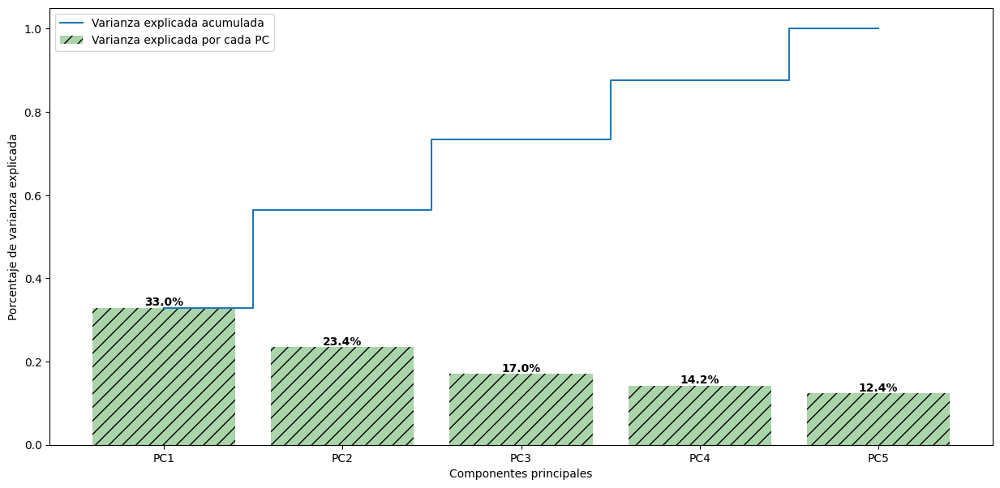

In [45]:
labels = ['PC' + str(x) for x in range(1, len(var_exp)+1)]
plt.figure(figsize=(15, 7))
bars = plt.bar(range(len(var_exp)), var_exp, alpha=0.3333, align='center', label='Varianza explicada por cada PC', 
         tick_label=labels, color = 'g',hatch='//')
plt.step(range(len(cum_var_exp)), cum_var_exp, where='mid',label='Varianza explicada acumulada')
plt.ylabel('Porcentaje de varianza explicada')
plt.xlabel('Componentes principales')
plt.legend(loc='best')
for i, bar in enumerate(bars):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(),
            f'{round(var_exp[i]*100,1)}%', ha='center', va='bottom', color='black', fontweight='bold')
plt.show()

Encontramos que entre los primeros 4 componentes principales tenemos el 87.6% de la información


In [46]:
np.sum(pca.explained_variance_ratio_[0:4])

0.8763186159552683

Ahora utilizamos los 4 primeros componentes, obteniendo un dataframe con las nuevas variables. En este caso particular, como nuestro objetivo es la predicción, no vamos a caracterizar las nuevas variables (esto sería útil si quisiésemos interpretar los resultados utilizando las variables generadas por el PCA)



In [47]:
pca = PCA(n_components=4)
pca_ = pca.fit_transform(df_scaled)
pca_df = pd.DataFrame(pca_, columns=['pc1','pc2','pc3','pc4'],index=df.index)
print('\nFinal PCA:')
pca_df


Final PCA:


,pc1,pc2,pc3,pc4
0,1.409692,0.993065,0.458017,-0.435302
1,2.458821,0.992990,-0.547813,0.618287
2,1.681491,0.181466,1.539237,0.501661
3,-0.892736,1.669442,2.126162,-2.166970
4,-1.124603,0.428606,0.547808,-1.233553
...,...,...,...,...
715,1.673974,-2.574263,-0.275072,1.337950
716,1.705713,-0.504360,0.144757,-0.948154
717,3.004235,-0.808072,-0.782801,-0.624467
718,2.259311,-1.147956,-1.956752,-0.014207


In [48]:
# Creamos un Transformer personalizado para realizar PCA sobre las variables numéricas
# Para dummificar las variables categóricas
class PCA_transformer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        cols = ['resting_blood_pressure']
        result = Remove_highly_correlated_features(cols).fit_transform(result)
        df_scaled = scaler.fit_transform(result.select_dtypes('number'))
        df_scaled = pd.DataFrame(df_scaled, columns=result.select_dtypes('number').columns)
        pca = PCA(n_components=4)
        pca_ = pca.fit_transform(df_scaled)
        pca_df = pd.DataFrame(pca_, columns=['pc1','pc2','pc3','pc4'],index=df.index)
        for col in result.select_dtypes('object'):
            pca_df[col] = result[col] 
        pca_df = pd.get_dummies(pca_df,columns=pca_df.select_dtypes('object').drop(columns=['target']).columns,dtype=float)
        return pca_df

In [49]:
df_pca = PCA_transformer().fit_transform(df_wins)
df_pca

,pc1,pc2,pc3,pc4,target,location_Cleveland,location_Hungria,location_Suiza,sex_0,sex_1,...,the_slope_of_the_peak_exercise_ST_segment_1,the_slope_of_the_peak_exercise_ST_segment_2,the_slope_of_the_peak_exercise_ST_segment_3,number_of_major_vessels_colored_by_fluorosopy_0,number_of_major_vessels_colored_by_fluorosopy_1,number_of_major_vessels_colored_by_fluorosopy_2,number_of_major_vessels_colored_by_fluorosopy_3,thal_3,thal_6,thal_7
0,-1.072828,1.203691,0.380673,-0.978476,0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,-1.858636,1.013871,-0.951880,0.235271,2,1.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
2,-1.982654,1.221509,0.245192,-0.658309,1,1.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
3,1.087482,1.856338,2.835586,-0.376115,0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
4,1.184315,0.236356,1.313291,-0.305021,0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,-2.458140,-1.815817,-1.180300,-0.289808,1,0.0,0.0,1.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
716,-1.703851,-0.210670,0.613359,-2.241551,3,0.0,0.0,1.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
717,-2.715819,-0.744926,-0.052460,-1.116302,0,0.0,0.0,1.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
718,-1.948820,-1.522643,-1.164780,-1.312024,1,0.0,0.0,1.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0


Hacemos uso de un pipeline para dejar listos nuestros dataframes que posteriormente utilizaremos para entrenar nuestros modelos

In [69]:
from sklearn.pipeline import Pipeline

elims = ['resting_blood_pressure']

pipe_rem = Pipeline(steps = [('format target variable',Format_target()),
                   ('format features',Format_variables()),
                   ('impute null values',Imputer(cont,cat)),
                   ('winsorize values',Winsorizer(wins_dict,cont_vars)),
                   ('Remove highly correlated features',Remove_highly_correlated_features(elims)),
                   ('Dummify categorical variables',Dummify())])

pipe_pca_rem = Pipeline(steps = [('format target variable',Format_target()),
                   ('format features',Format_variables()),
                   ('impute null values',Imputer(cont,cat)),
                   ('winsorize values',Winsorizer(wins_dict,cont_vars)),
                   ('PCA',PCA_transformer())])


df_pipeline_rem = pipe_rem.fit_transform(df)
df_pipeline_pca_rem = pipe_pca_rem.fit_transform(df)

In [70]:
# Construimos una función que nos permite obetener el X y el y para el dataframe de corazon

def obtain_X_y(df):
    return df.drop(columns=['target']),df[['target']]

### 5. Protocolos de evaluación

In [71]:
# Utilizamos el holdout con un 30% para la prueba y 70% para el entrenamiento
from sklearn.model_selection import train_test_split

X = dict()
y = dict()
X_train = dict()
y_train = dict()
X_test = dict()
y_test = dict()

# Particionamos los datos para nuestra primer versión
X['rem'], y['rem'] = obtain_X_y(df_pipeline_rem)

X_train['rem'], X_test['rem'], y_train['rem'], y_test['rem'] = train_test_split(X['rem'],y['rem'],random_state=1234,test_size=0.3)
print(X_train['rem'].shape)
print(X_test['rem'].shape)
print(y_train['rem'].shape)
print(y_test['rem'].shape)

(504, 35)
(216, 35)
(504, 1)
(216, 1)


In [72]:
# Particionamos los datos para nuestra segunda versión
X['pca_rem'], y['pca_rem'] = obtain_X_y(df_pipeline_pca_rem)

X_train['pca_rem'], X_test['pca_rem'], y_train['pca_rem'], y_test['pca_rem'] = train_test_split(X['pca_rem'],y['pca_rem'],random_state=1234,test_size=0.3)
print(X_train['pca_rem'].shape)
print(X_test['pca_rem'].shape)
print(y_train['pca_rem'].shape)
print(y_test['pca_rem'].shape)

(504, 35)
(216, 35)
(504, 1)
(216, 1)


### 6. Métricas de evaluación

Implementamos una función que nos permita calcular las métricas de regresión para el conjunto de entrenamiento y de prueba (Accuracy, Kappa, Precision, Recall)

Nos retornará el modelo entrenado y un diccionario con las principales métricas sobre el conjunto de entrenamiento y el de prueba
- Accuracy = (TP + TN) / (TP + FP + FN + TN)
- Kappa = (OA - AC) / (1 - AC)
- Precision = TP / (TP + FP) (valor positivo predicho, la proporción correcta de identificaciones positivas)
- Recall = TP / (TP + FN) (la proporción de positivos que fueron identificados correctamente)

In [73]:
from sklearn.metrics import accuracy_score, cohen_kappa_score, precision_score, recall_score

def classification_metrics(model,X_train,X_test,y_train,y_test):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    acc_train = accuracy_score(y_train, y_pred_train)
    acc_test = accuracy_score(y_test, y_pred_test)
    kappa_train = cohen_kappa_score(y_train, y_pred_train)
    kappa_test = cohen_kappa_score(y_test, y_pred_test)
    prec_train = precision_score(y_train, y_pred_train,average=None,labels=['0','1','2','3','4'])
    prec_test = precision_score(y_test, y_pred_test,average=None,labels=['0','1','2','3','4'])
    recall_train = recall_score(y_train, y_pred_train,average=None,labels=['0','1','2','3','4'])
    recall_test = recall_score(y_test, y_pred_test,average=None,labels=['0','1','2','3','4'])   
    metrics = {"Training Accuracy": acc_train,
               "Test Accuracy": acc_test,
               "Training Kappa": kappa_train,
               "Test Kappa": kappa_test,
               "Training Precision": prec_train,
               "Test Precision": prec_test,
               "Training recall": recall_train,
               "Test recall": recall_test    
               }
    for item in metrics.items():
        print(item[0],"=",item[1])
    return model,metrics
    
def kappa_metrics(model,X_train,X_test,y_train,y_test):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    kappa_train = cohen_kappa_score(y_train, y_pred_train)
    kappa_test = cohen_kappa_score(y_test, y_pred_test)
    return kappa_train, kappa_test

### Baseline a partir del dummy classifier

Establecemos la línea base a partir de un dummy classifier que utiliza como estrategia la moda (ya que estamos trabajando con una tarea de clasificación)

In [74]:
from sklearn.dummy import DummyClassifier

classification_metrics(DummyClassifier(strategy='most_frequent'),X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

Training Accuracy = 0.5
Test Accuracy = 0.5
Training Kappa = 0.0
Test Kappa = 0.0
Training Precision = [0.5 0.  0.  0.  0. ]
Test Precision = [0.5 0.  0.  0.  0. ]
Training recall = [1. 0. 0. 0. 0.]
Test recall = [1. 0. 0. 0. 0.]


(DummyClassifier(strategy='most_frequent'),
 {'Training Accuracy': 0.5,
  'Test Accuracy': 0.5,
  'Training Kappa': 0.0,
  'Test Kappa': 0.0,
  'Training Precision': array([0.5, 0. , 0. , 0. , 0. ]),
  'Test Precision': array([0.5, 0. , 0. , 0. , 0. ]),
  'Training recall': array([1., 0., 0., 0., 0.]),
  'Test recall': array([1., 0., 0., 0., 0.])})

Training Accuracy = 50%, Test Accuracy = 50%

### Reporte de métricas y matriz de confusión

Vamos a definir una función para dibujar la matriz de confusión y el reporte de clasificación en donde podemos obtener las métricas de entrenamiento y prueba

In [75]:
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.linear_model import LogisticRegression

import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Matriz de confusión',
                          cmap=plt.cm.Blues):

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Real')
    plt.xlabel('Predicción')

def report_and_conf_matrix(model,X_train,X_test,y_train,y_test):
    md = model.fit(X_train,y_train)
    y_pred_train = md.predict(X_train)
    y_pred_test = md.predict(X_test)
    cnf_matrix1 = confusion_matrix(y_train, y_pred_train)
    cnf_matrix2 = confusion_matrix(y_test, y_pred_test)
    np.set_printoptions(precision=2)
    plt.figure()
    plot_confusion_matrix(cnf_matrix1, classes=['0','1','2','3','4'],
                      title='Matriz de confusión Entrenamiento')
    print("Reporte Entrenamiento")  
    print(classification_report(y_train, y_pred_train, target_names=['0','1','2','3','4']))
    plt.show()
    plt.figure()
    plot_confusion_matrix(cnf_matrix2, classes=['0','1','2','3','4'],
                      title='Matriz de confusión Prueba')
    print("Reporte Prueba")  
    print(classification_report(y_test, y_pred_test, target_names=['0','1','2','3','4']))
    plt.show()


### Área bajo la curva ROC

Vamos a utilizar el área bajo la curva ROC para evaluar nuestro modelo también. Con esta gráfica vamos a poder visualizar el desempeño del modelo entre la sensibilidad (recall - true positive rate) y la especificidad (true negative rate 1 - FPR), de manera que podamos establecer un balance entre ambos.
- La curva ROC hace un plot entre el TPR y el FPR
- Recall es la habilidad para identificar correctamente las observaciones que son positivas
- Especificidad es la habilidad para indentificar correctamente las observaciones que son negativas
- AUC ROC nos permite identificar que tan bien nuestro modelo puede distinguir entre las clases. 

Al tener nosotros un problema multi - clase utilizaremos una metodología uno vs el resto. Se tendrán tantas curvas como clases. Yellowbrick es muy útil y simple para esto

- Utilizando las curvas individuales podemos ver que tan bien nuestro modelo trabaja para cada una de las categorías 

- La curva micro-average ROC agrega todas las instancias sobre todas las clases y nos brinda una sola curva para todas las predicciones (afectada por la moda).

- La curva macro-average ROC trata clase de manera independiente y nos presenta una curva ROC que es el promedio de los valores para cada clase (cada clase tiene la misma importancia).

In [76]:
from yellowbrick.classifier import ROCAUC

def plot_ROC_curve(model, X_train, y_train, X_test, y_test):
    visualizer = ROCAUC(model, encoder={'0': 'neutral riesgo 0',
                                        '1': 'riesgo 1', 
                                        '2': 'riesgo 2', 
                                        '3': 'riesgo 3',
                                        '4': 'riesgo 4'})                                    
    visualizer.fit(X_train, y_train)
    visualizer.score(X_test, y_test)
    visualizer.show()
    
    return visualizer

Podemos observar el funcionamiento de la curva ROC y el área bajo ella utilizando uno de los modelos más sencillos para abordar tareas de clasificación, la regresión logística.

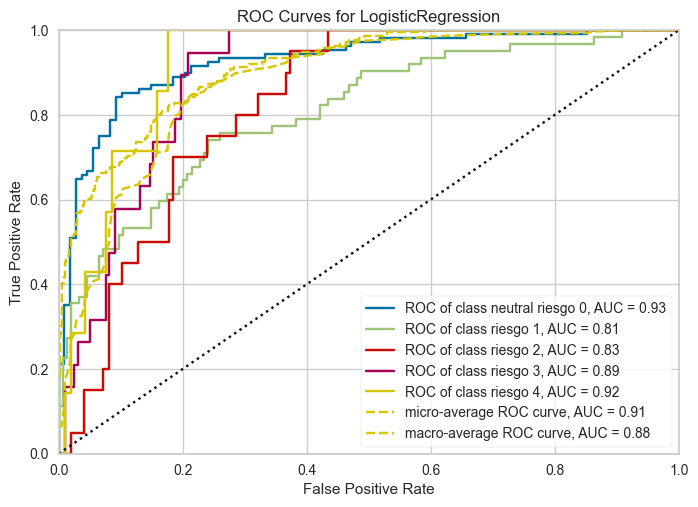

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for LogisticRegression'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=LogisticRegression(random_state=1234))

In [77]:
plot_ROC_curve(LogisticRegression(random_state=1234), X_train=X_train['rem'], y_train=y_train['rem'], X_test=X_test['rem'], y_test=y_test['rem'])

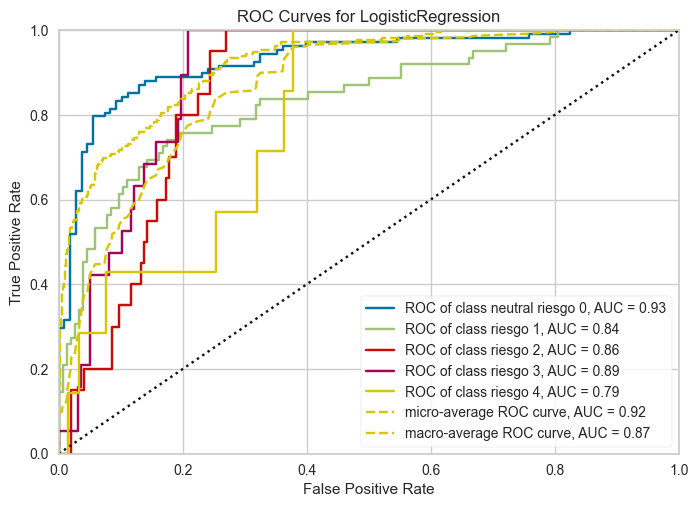

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for LogisticRegression'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=LogisticRegression(random_state=1234))

In [78]:
plot_ROC_curve(LogisticRegression(random_state=1234), X_train=X_train['pca_rem'], y_train=y_train['pca_rem'], X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

Se puede observar que el conjunto de datos al que se le ha realizado el PCA presenta un poco mejor desempeño. Más adelante ahondaremos más en esto.

### 7. Implementación de modelos

#### 7.1. Modelo de Regresión Logística

Trabajamos sobre el conjunto de datos con eliminación de variables altamente correlacionadas entre sí.

In [175]:
from sklearn.linear_model import LogisticRegression

classification_metrics(LogisticRegression(random_state=1234),X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

Training Accuracy = 0.6488095238095238
Test Accuracy = 0.6620370370370371
Training Kappa = 0.41496812780357284
Test Kappa = 0.45344887348353546
Training Precision = [0.77 0.49 0.2  0.48 0.  ]
Test Precision = [0.85 0.49 0.   0.5  0.  ]
Training recall = [0.89 0.61 0.04 0.22 0.  ]
Test recall = [0.85 0.76 0.   0.21 0.  ]


(LogisticRegression(random_state=1234),
 {'Training Accuracy': 0.6488095238095238,
  'Test Accuracy': 0.6620370370370371,
  'Training Kappa': 0.41496812780357284,
  'Test Kappa': 0.45344887348353546,
  'Training Precision': array([0.77, 0.49, 0.2 , 0.48, 0.  ]),
  'Test Precision': array([0.85, 0.49, 0.  , 0.5 , 0.  ]),
  'Training recall': array([0.89, 0.61, 0.04, 0.22, 0.  ]),
  'Test recall': array([0.85, 0.76, 0.  , 0.21, 0.  ])})

In [177]:
# Guardamos el mejor modelo con regresión logística

import pickle
from sklearn.linear_model import LogisticRegressionCV

model,metrics = classification_metrics(LogisticRegressionCV(cv=5,random_state=1234),
                                       X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/logisticRegressionRem.pkl', 'wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/logisticRegressionRemMetrics.pkl', 'wb'))

Training Accuracy = 0.7123015873015873
Test Accuracy = 0.6851851851851852
Training Kappa = 0.5373980857851826
Test Kappa = 0.5108239525744354
Training Precision = [0.84 0.59 0.4  0.56 0.  ]
Test Precision = [0.89 0.56 0.29 0.44 0.  ]
Training recall = [0.91 0.65 0.21 0.52 0.  ]
Test recall = [0.82 0.76 0.2  0.42 0.  ]


Dentro del contexto en el que nos encontramos trabajando, sería bueno entender que tipo de errores desearíamos que nuestro modelo evitara.

Teniendo en cuenta que actuamos como una compañía aseguradora y queremos predecir el riesgo, quizás sería más importante al tomar como positiva la categoría más riesgosa, predecir que no es riesgosa y que sí lo sea (FN), es decir un recall más alto. Por otro lado al tomar como positiva la categoría menos riesgosa y predecir que no es riesgosa y que sí lo sea es un problema (FP), es decir una precision más alta.

In [178]:
# Los hiperparámetros del mejor modelo de regresión logística

model.get_params()

{'Cs': 10,
 'class_weight': None,
 'cv': 5,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1.0,
 'l1_ratios': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': 1234,
 'refit': True,
 'scoring': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0}

Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.84      0.91      0.87       252
           1       0.59      0.65      0.62       147
           2       0.40      0.21      0.27        48
           3       0.56      0.52      0.54        46
           4       0.00      0.00      0.00        11

    accuracy                           0.71       504
   macro avg       0.48      0.46      0.46       504
weighted avg       0.68      0.71      0.69       504



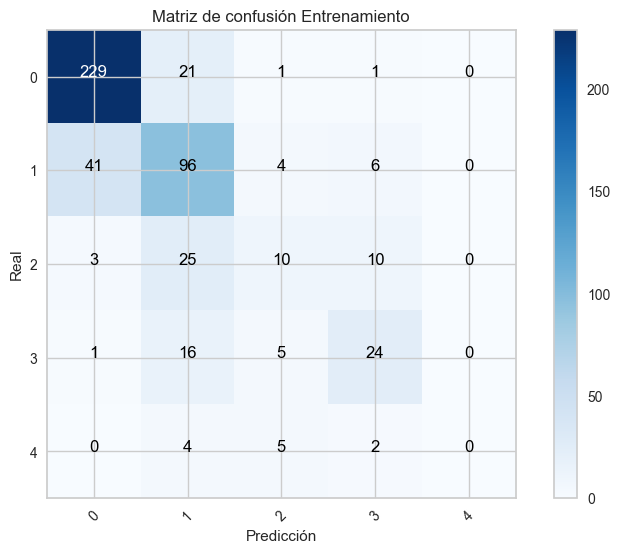

Reporte Prueba
              precision    recall  f1-score   support

           0       0.89      0.82      0.86       108
           1       0.56      0.76      0.64        62
           2       0.29      0.20      0.24        20
           3       0.44      0.42      0.43        19
           4       0.00      0.00      0.00         7

    accuracy                           0.69       216
   macro avg       0.44      0.44      0.43       216
weighted avg       0.67      0.69      0.67       216



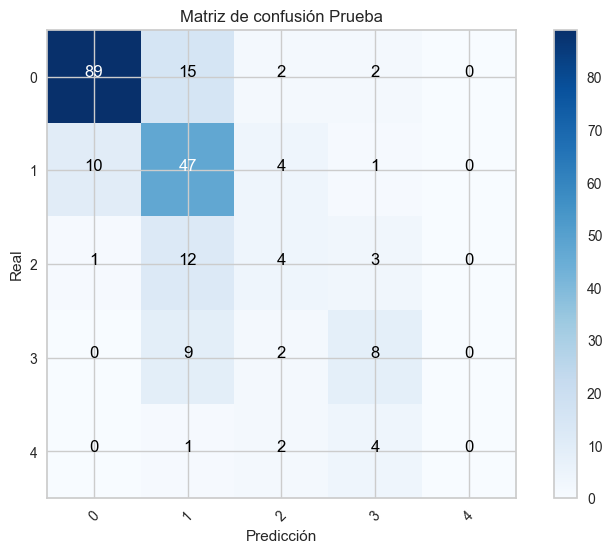

In [179]:
report_and_conf_matrix(LogisticRegressionCV(cv=5,random_state=1234),
                       X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

Obtenemos el reporte y la matriz de confusión para nuestro mejor modelo de regresión logística con todas las variables.

Con base en el reporte de entrenamiento podemos observar dos métricas importantes
- Precision (para ver si tenemos un nivel alto de correctitud para la clase positiva). Una mayor precision disminuye los falsos positivos (en este caso desearíamos mayor precisión sobre las categorías de menos riesgo)
- Recall (para ver qué porcentaje de las muestras puede el modelo identificar que pertenecen a la clase positiva). Un mayor recall indica que los falsos negativos disminuyen (en este caso desearíamos mayor sensibilidad sobre las categorías de mayor riesgo)

La exactitud para la prueba de nuestro modelo es del 69%, mucho mejor que el presentado en el baseline que era del 50%

La precisión para la clase menos riesgosa es de 89% 

La sensibilidad para la clase más riesgosa de 0% 

Ambas parecen adecuadas teniendo en cuenta el contexto del problema.

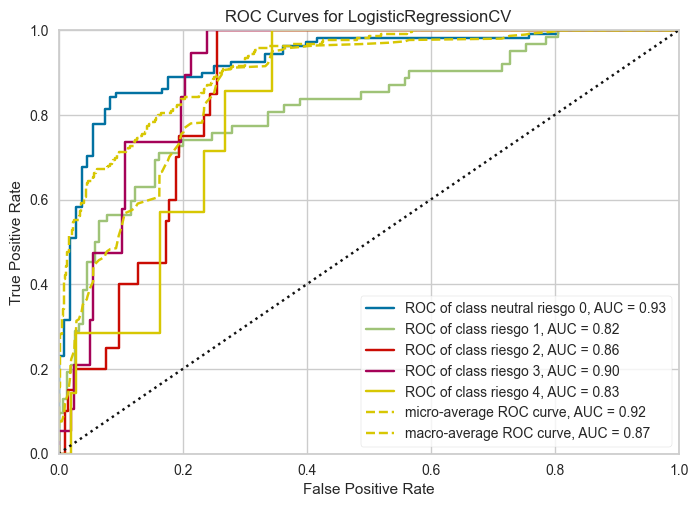

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for LogisticRegressionCV'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=LogisticRegressionCV(cv=5, random_state=1234))

In [180]:
plot_ROC_curve(LogisticRegressionCV(cv=5,random_state=1234), 
               X_train=X_train['rem'], y_train=y_train['rem'], X_test=X_test['rem'], y_test=y_test['rem'])

- La curva micro-average arroja un valor adecuado de 0.92
- La curva macro-average arroja un valor adecuado de 0.87
- Aunque el modelo parece funcionar bien para las clases riesgo 0 y 1, definitivamente no es tan correcto con la clase riesgo 2, 3 y 4.

Aunque previamente, en la etapa de ingeniería de características habíamos creado nuevas variables y eliminado otras, en esta etapa verificaremos la importancia de las variables independientes con respecto a la objetivo utilizando distintos métodos. 

Esto con el fin de hallar el mejor grupo de variables que sirvan como insumo para nuestros modelos.

### Selección de características

En este caso hacemos uso de SelectKBest que nos permite seleccionar las k mejores variables independientes teniendo en cuenta el f_classif. Construimos una función que a partir del conjunto de entrenamiento y el de prueba nos retorna los conjuntos ya transformados

In [79]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
 
def select_features(X_train, y_train, X_test,n):
  fs = SelectKBest(score_func=f_classif, k=n)
  fs.fit(X_train, y_train)
  X_train_fs = fs.transform(X_train)
  X_test_fs = fs.transform(X_test)
  return X_train_fs, X_test_fs, fs

Revizamos la importancia de las variables en el conjunto de datos sin PCA

Feature 0: 10.323352
Feature 1: 10.062809
Feature 2: 27.056273
Feature 3: 29.071626
Feature 4: 6.213494
Feature 5: 26.651882
Feature 6: 32.434443
Feature 7: 12.121497
Feature 8: 12.121497
Feature 9: 1.153837
Feature 10: 25.730688
Feature 11: 7.254237
Feature 12: 61.448412
Feature 13: 0.908788
Feature 14: 0.908788
Feature 15: 3.894364
Feature 16: 0.681920
Feature 17: 4.142420
Feature 18: 37.742669
Feature 19: 37.742669
Feature 20: 4.785785
Feature 21: 0.248506
Feature 22: 3.224848
Feature 23: 0.248506
Feature 24: 2.928683
Feature 25: 18.350140
Feature 26: 0.248506
Feature 27: 5.154461
Feature 28: 12.069505
Feature 29: 5.843701
Feature 30: 29.150737
Feature 31: 0.248506
Feature 32: 2.516746
Feature 33: 25.802853
Feature 34: 0.248506


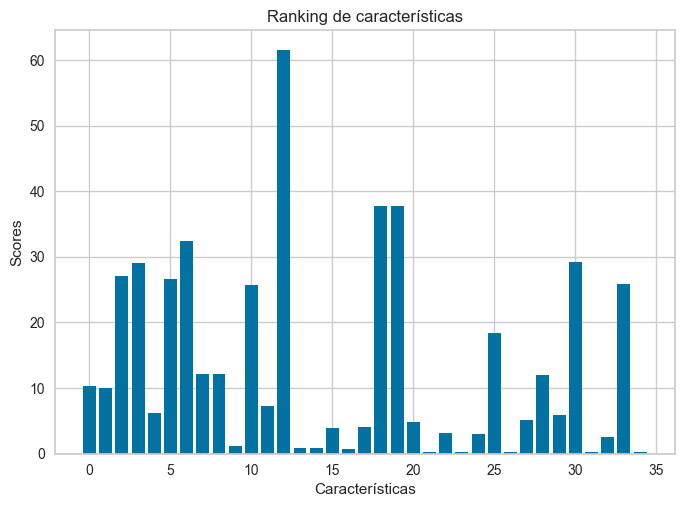

In [80]:
# Haciendo uso de los conjuntos ya transformados podemos ver el score de cada variable
# En este caso utilizamos todas las variables

n = X_train['rem'].shape[1]

X_train['rem_fs'], X_test['rem_fs'], fs = select_features(X_train['rem'], y_train['rem'], X_test['rem'],n)

for i in range(len(fs.scores_)):
    print('Feature %d: %f' % (i, fs.scores_[i]))

fig, ax = plt.subplots()
ax.bar([i for i in range(len(fs.scores_))], fs.scores_)
ax.set(title='Ranking de características',xlabel='Características',ylabel='Scores')
plt.show()

Index(['chest_pain_type_4', 'target', 'serum_cholestoral',
       'maximum_heart_rate_achieved',
       'oldpeak_ST_depression_induced_by_exercise'],
      dtype='object')


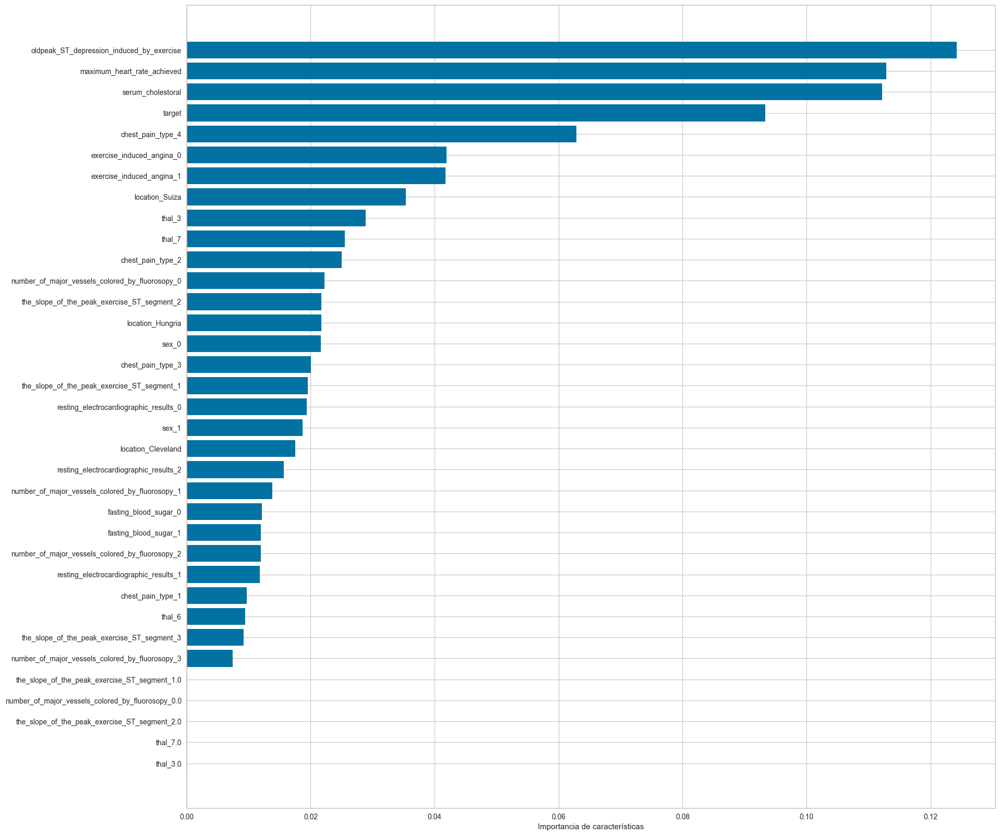

In [81]:
# Haciendo uso de un modelo de Random Forest Classifier hacemos un ranking de características
# Ordenamos y graficamos

from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance

rf = RandomForestClassifier(n_estimators=150,random_state=1234)
rf.fit(X_train['rem'], y_train['rem'])
sort = rf.feature_importances_.argsort()
plt.figure(figsize=(20,20))
plt.barh(df_pipeline_rem.columns[1:][sort], rf.feature_importances_[sort])
plt.xlabel("Importancia de características")
l = len(df_pipeline_rem.columns[1:])
importants = df_pipeline_rem.columns[1:][sort][-5:]
print(importants)


Revisamos el ranking de variables para el conjunto de datos con PCA

Index(['chest_pain_type_4', 'pc4', 'pc3', 'target', 'pc2'], dtype='object')


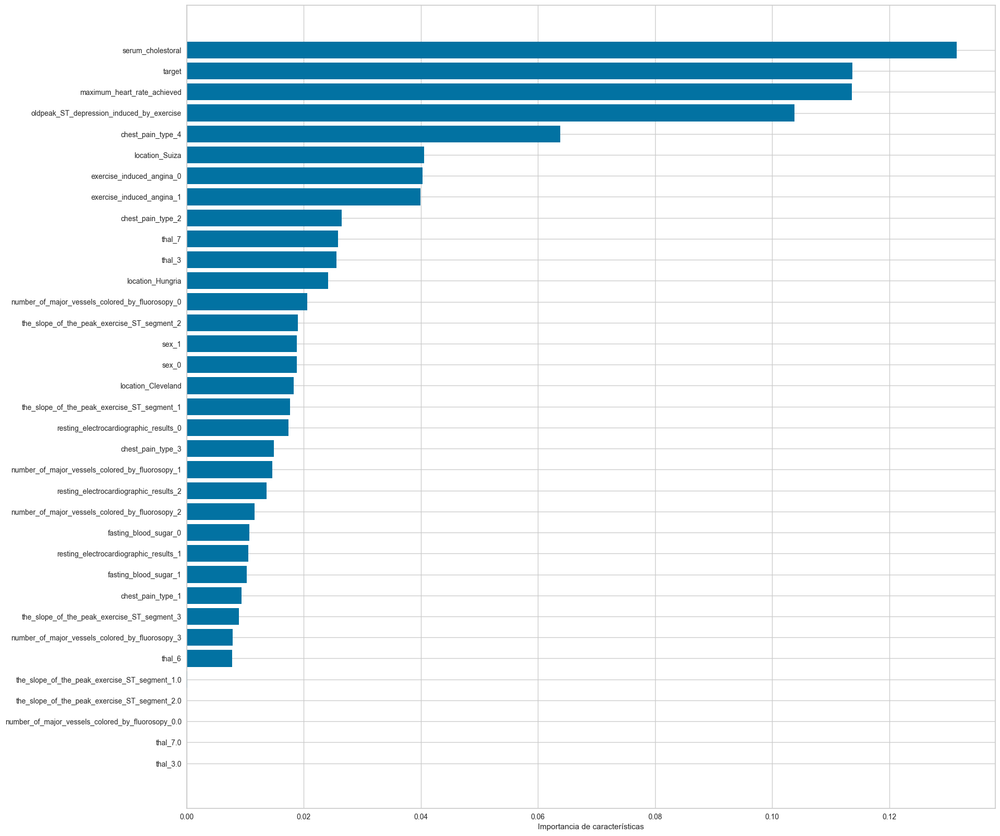

In [82]:
rf = RandomForestClassifier(n_estimators=150,random_state=1234)
rf.fit(X_train['pca_rem'], y_train['pca_rem'])
sort = rf.feature_importances_.argsort()
plt.figure(figsize=(20,20))
plt.barh(df_pipeline_rem.columns[1:][sort], rf.feature_importances_[sort])
plt.xlabel("Importancia de características")
l = len(df_pipeline_pca_rem.columns[1:])
importants = df_pipeline_pca_rem.columns[1:][sort][-5:]
print(importants)

Revisamos la cantidad de variables a seleccionar para el conjunto de datos sin PCA

(0.4829051183491806, 17)


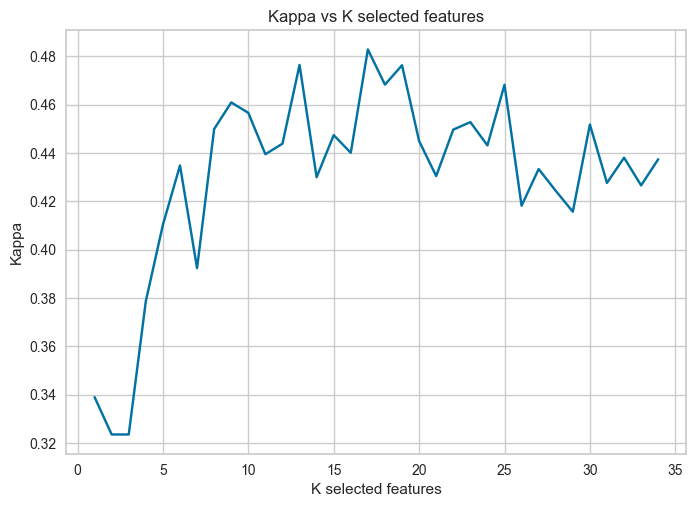

In [83]:
from sklearn.pipeline import make_pipeline

n = X_train['rem'].shape[1]
results = [kappa_metrics(make_pipeline(SelectKBest(score_func=f_classif, k=i),
                                                 StandardScaler(),
                                                 RandomForestClassifier(n_estimators=150,random_state=1234)),
            X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])[1] for i in range(1,n)]
ax = sns.lineplot(x=range(1,n),
             y=results)
ax.set(title="Kappa vs K selected features",ylabel='Kappa',xlabel='K selected features')
kvals = [(col,i) for col,i in zip(results,range(1,n))]

print(sorted(kvals, key=lambda x: x[0],reverse=True)[0])

Cantidad de variables a seleccionar para conjunto de datos sin PCA k = 17

Revisamos la cantidad de variables a seleccionar del conjunto de datos con PCA

(0.46993865030674853, 25)


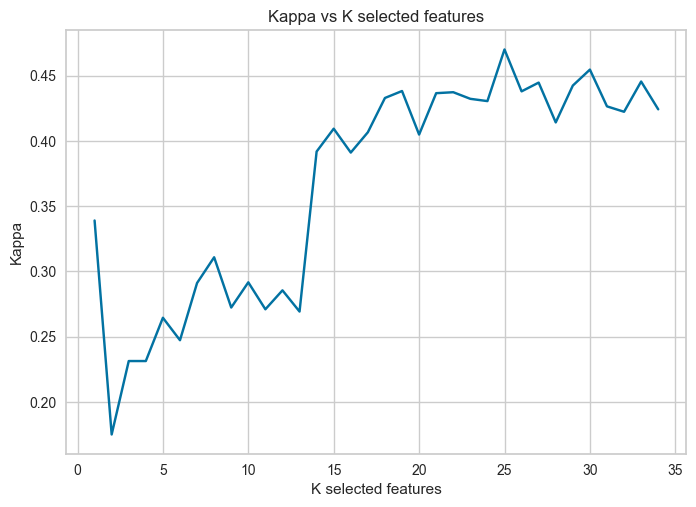

In [84]:
n = X_train['pca_rem'].shape[1]
results = [kappa_metrics(make_pipeline(SelectKBest(score_func=f_classif, k=i),
                                                 StandardScaler(),
                                                 RandomForestClassifier(n_estimators=150,random_state=1234)),
            X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])[1] for i in range(1,n)]
ax = sns.lineplot(x=range(1,n),
             y=results)
ax.set(title="Kappa vs K selected features",ylabel='Kappa',xlabel='K selected features')
kvals = [(col,i) for col,i in zip(results,range(1,n))]

print(sorted(kvals, key=lambda x: x[0],reverse=True)[0])

Cantidad de variables a seleccionar para conjunto de datos con PCA k = 25

In [187]:
# Modelo de regresión logística utilizando datos sin PCA y feature selection de 17 variables

model,metrics = classification_metrics(make_pipeline(SelectKBest(score_func=f_classif, k=17),
                                                 LogisticRegressionCV(cv=5,random_state=1234)),
                                   X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/logisticRegressionRemFS.pkl', 'wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/logisticRegressionRemFSMetrics.pkl', 'wb'))

Training Accuracy = 0.6825396825396826
Test Accuracy = 0.6666666666666666
Training Kappa = 0.4865492980166184
Test Kappa = 0.4781733382545381
Training Precision = [0.82 0.54 0.33 0.49 0.  ]
Test Precision = [0.88 0.51 0.31 0.41 0.  ]
Training recall = [0.91 0.59 0.15 0.46 0.  ]
Test recall = [0.84 0.68 0.2  0.37 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.82      0.91      0.86       252
           1       0.54      0.59      0.56       147
           2       0.33      0.15      0.20        48
           3       0.49      0.46      0.47        46
           4       0.00      0.00      0.00        11

    accuracy                           0.68       504
   macro avg       0.44      0.42      0.42       504
weighted avg       0.64      0.68      0.66       504



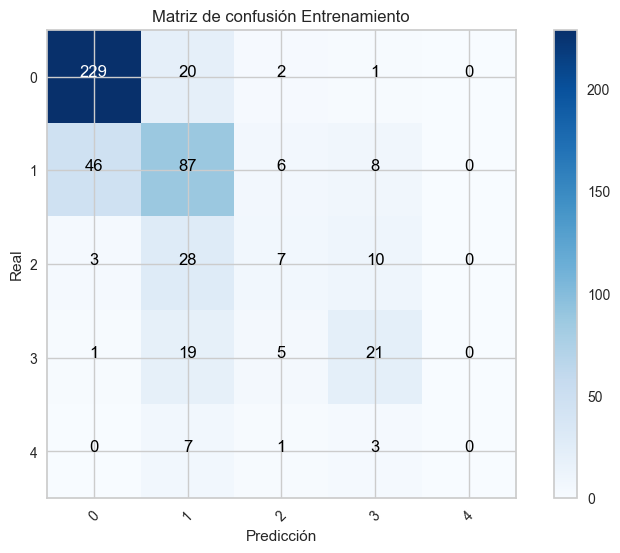

Reporte Prueba
              precision    recall  f1-score   support

           0       0.88      0.84      0.86       108
           1       0.51      0.68      0.58        62
           2       0.31      0.20      0.24        20
           3       0.41      0.37      0.39        19
           4       0.00      0.00      0.00         7

    accuracy                           0.67       216
   macro avg       0.42      0.42      0.41       216
weighted avg       0.65      0.67      0.65       216



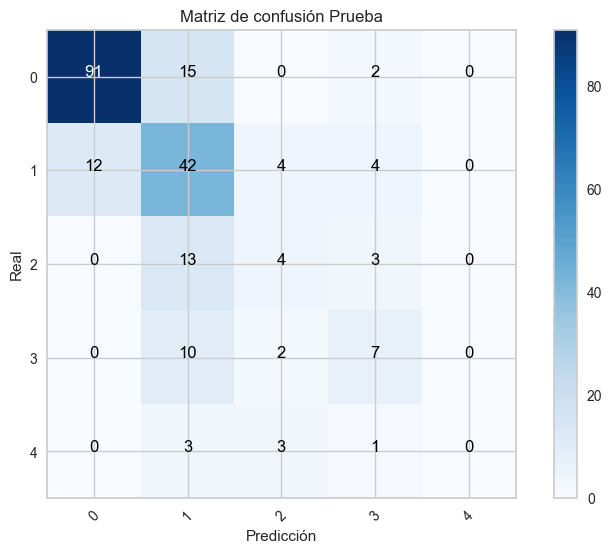

In [193]:
pipeline_lr = make_pipeline(SelectKBest(score_func=f_classif, k=17),
                                                 LogisticRegressionCV(cv=5,random_state=1234))
report_and_conf_matrix(pipeline_lr,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

La exactitud para la prueba de nuestro modelo es del 67%

La precisión para la clase menos riesgosa es de 88% 

La sensibilidad para la clase más riesgosa de 0% 

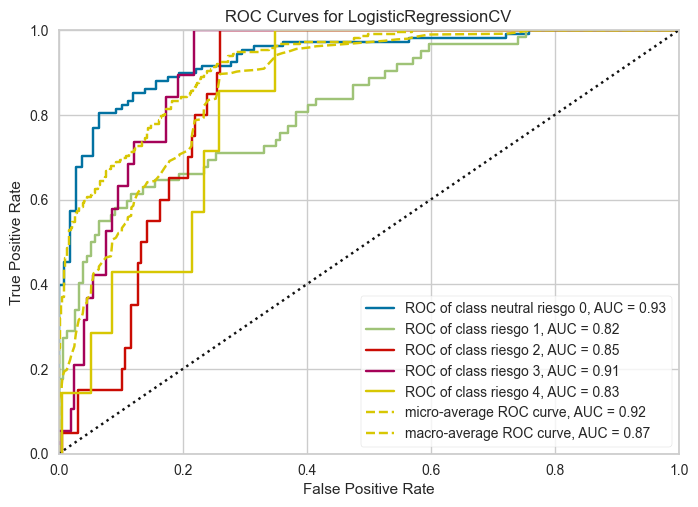

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for LogisticRegressionCV'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=17)),
                                 ('logisticregressioncv',
                                  LogisticRegressionCV(cv=5,
                                                       random_state=1234))]))

In [194]:
pipeline_lr = make_pipeline(SelectKBest(score_func=f_classif, k=17),
                                                 LogisticRegressionCV(cv=5,random_state=1234))
plot_ROC_curve(pipeline_lr, X_train=X_train['rem'], y_train=y_train['rem'], X_test=X_test['rem'], y_test=y_test['rem'])

- La curva micro-average arroja un valor adecuado de 0.92
- La curva macro-average arroja un valor adecuado de 0.87
- Aunque el modelo parece funcionar bien para las clases riesgo 0, 1, definitivamente no es tan correcto con la clase riesgo 2, 3 y 4.

Modelo de regresión logistica sobre conjunto de datos con PCA

In [190]:
model,metrics = classification_metrics(LogisticRegressionCV(cv=5,random_state=1234),
                                       X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/logisticRegressionPCARem.pkl', 'wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/logisticRegressionPCARemMetrics.pkl', 'wb'))

Training Accuracy = 0.6726190476190477
Test Accuracy = 0.6574074074074074
Training Kappa = 0.4459804267736154
Test Kappa = 0.44059076750778703
Training Precision = [0.76 0.53 0.67 0.52 0.  ]
Test Precision = [0.83 0.51 0.   0.18 0.  ]
Training recall = [0.94 0.61 0.04 0.26 0.  ]
Test recall = [0.89 0.71 0.   0.11 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.76      0.94      0.84       252
           1       0.53      0.61      0.56       147
           2       0.67      0.04      0.08        48
           3       0.52      0.26      0.35        46
           4       0.00      0.00      0.00        11

    accuracy                           0.67       504
   macro avg       0.50      0.37      0.37       504
weighted avg       0.65      0.67      0.62       504



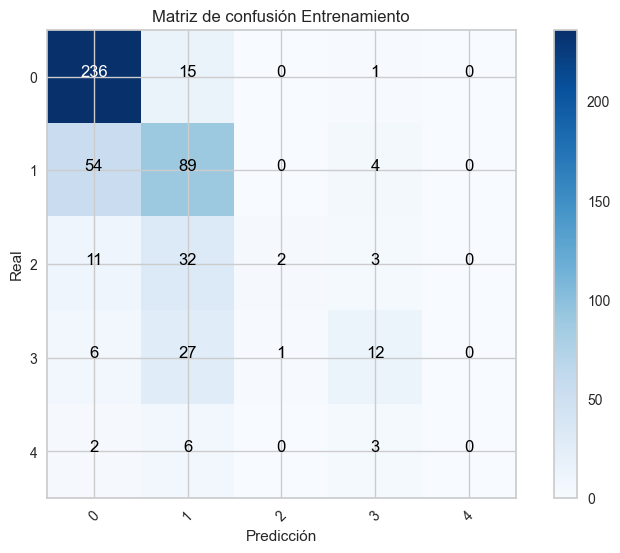

Reporte Prueba
              precision    recall  f1-score   support

           0       0.83      0.89      0.86       108
           1       0.51      0.71      0.59        62
           2       0.00      0.00      0.00        20
           3       0.18      0.11      0.13        19
           4       0.00      0.00      0.00         7

    accuracy                           0.66       216
   macro avg       0.30      0.34      0.32       216
weighted avg       0.58      0.66      0.61       216



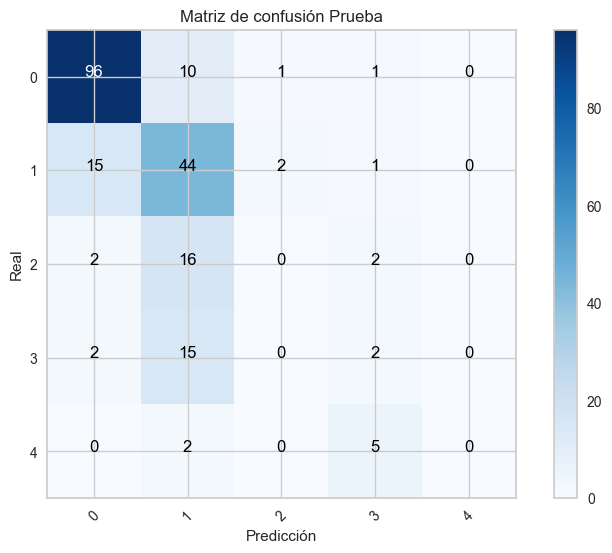

In [191]:
report_and_conf_matrix(LogisticRegressionCV(cv=5,random_state=1234),
                       X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

La exactitud para la prueba de nuestro modelo es del 66%

La precisión para la clase menos riesgosa es de 83% 

La sensibilidad para la clase más riesgosa de 0% 

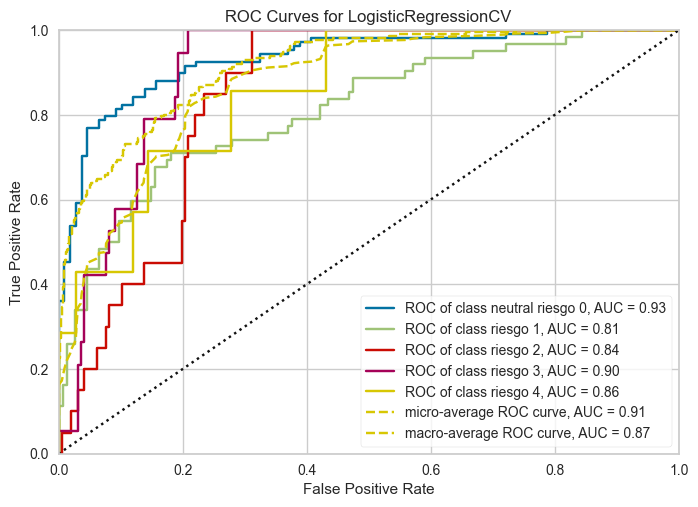

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for LogisticRegressionCV'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=LogisticRegressionCV(cv=5, random_state=1234))

In [192]:
plot_ROC_curve(LogisticRegressionCV(cv=5,random_state=1234), 
               X_train=X_train['pca_rem'], y_train=y_train['pca_rem'], X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

- La curva micro-average arroja un valor muy bueno de 0.91
- La curva macro-average arroja un valor muy bueno de 0.87

Modelo de Regresión logística sobre conjunto de datos con PCA y feature selection

In [195]:
# Modelo de regresión logística utilizando datos con PCA y feature selection de 25 variables

model,metrics = classification_metrics(make_pipeline(SelectKBest(score_func=f_classif, k=25),
                                                 LogisticRegressionCV(cv=5,random_state=1234)),
                                   X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/logisticRegressionPCARemFS.pkl', 'wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/logisticRegressionPCARemFSMetrics.pkl', 'wb'))

Training Accuracy = 0.6686507936507936
Test Accuracy = 0.6481481481481481
Training Kappa = 0.4388500720038403
Test Kappa = 0.4290285555285033
Training Precision = [0.76 0.52 0.5  0.54 0.  ]
Test Precision = [0.83 0.48 0.   0.31 0.  ]
Training recall = [0.94 0.59 0.02 0.3  0.  ]
Test recall = [0.87 0.68 0.   0.21 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.76      0.94      0.84       252
           1       0.52      0.59      0.55       147
           2       0.50      0.02      0.04        48
           3       0.54      0.30      0.39        46
           4       0.00      0.00      0.00        11

    accuracy                           0.67       504
   macro avg       0.46      0.37      0.36       504
weighted avg       0.63      0.67      0.62       504



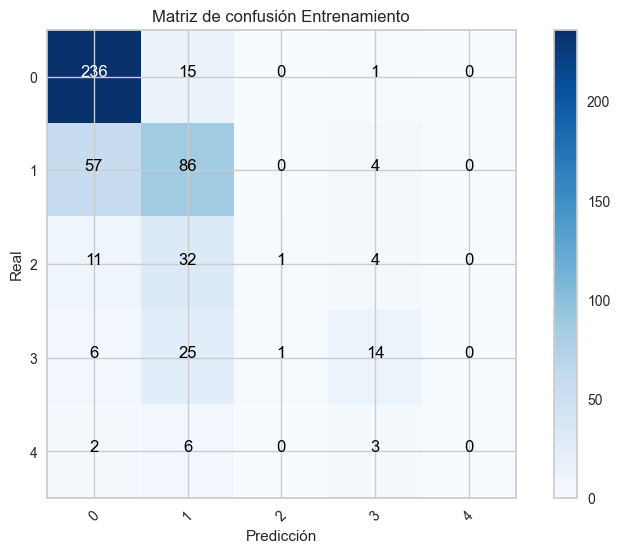

Reporte Prueba
              precision    recall  f1-score   support

           0       0.83      0.87      0.85       108
           1       0.48      0.68      0.56        62
           2       0.00      0.00      0.00        20
           3       0.31      0.21      0.25        19
           4       0.00      0.00      0.00         7

    accuracy                           0.65       216
   macro avg       0.32      0.35      0.33       216
weighted avg       0.58      0.65      0.61       216



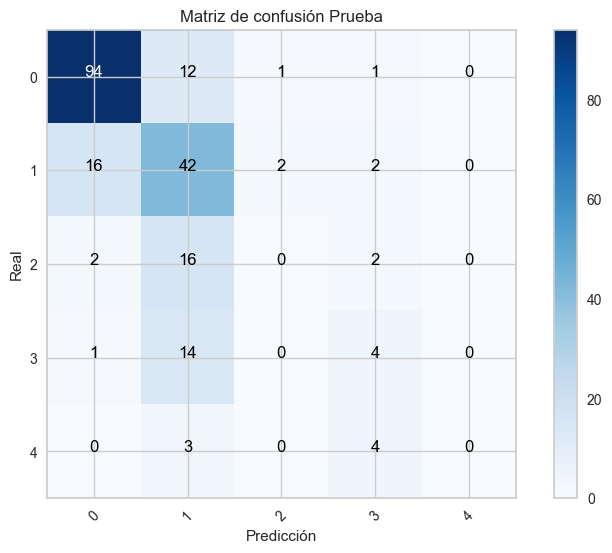

In [196]:
pipeline_lr = make_pipeline(SelectKBest(score_func=f_classif,k=25),
                            LogisticRegressionCV(cv=5,random_state=1234))
report_and_conf_matrix(pipeline_lr,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

La exactitud para la prueba de nuestro modelo es del 65%

La precisión para la clase menos riesgosa es de 83% 

La sensibilidad para la clase más riesgosa de 0%

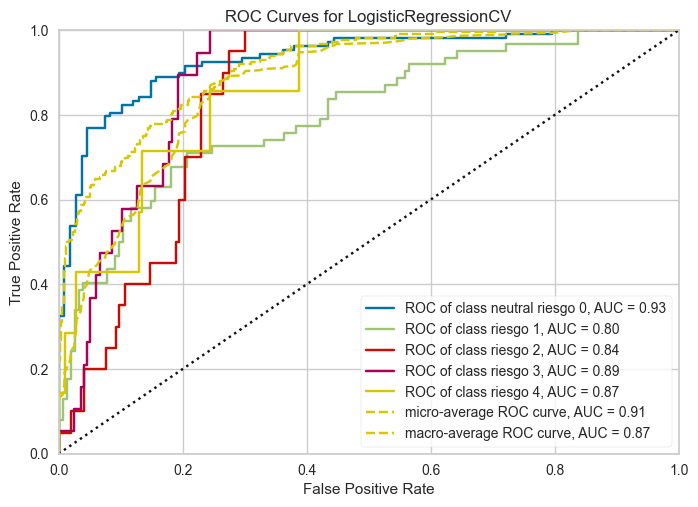

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for LogisticRegressionCV'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=25)),
                                 ('logisticregressioncv',
                                  LogisticRegressionCV(cv=5,
                                                       random_state=1234))]))

In [197]:
pipeline_lr = make_pipeline(SelectKBest(score_func=f_classif,k=25),
                            LogisticRegressionCV(cv=5,random_state=1234))
plot_ROC_curve(pipeline_lr,X_train=X_train['pca_rem'], y_train=y_train['pca_rem'], X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

- La curva micro-average arroja un valor muy bueno de 0.91
- La curva macro-average arroja un valor muy bueno de 0.87

### 7.3. Modelo de K vecinos más cercanos

Para este modelo tan solamente incluimos las variables continuas, pues es un método basado en distancias. No tienen sentido utilizar las variables categóricas dummificadas

In [200]:
# Escalamos y estandarizamos para ver los resultados del modelo

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.pipeline import make_pipeline
from sklearn.neighbors import KNeighborsClassifier

print('Stadardization')
knnReg_st = make_pipeline(StandardScaler(),KNeighborsClassifier())
cols = ['age', 'serum_cholestoral', 'maximum_heart_rate_achieved', 'oldpeak_ST_depression_induced_by_exercise']
classification_metrics(knnReg_st,X_train['rem'][cols],X_test['rem'][cols],y_train['rem'],y_test['rem'])
print()
print('Normalization')
knnReg_norm = make_pipeline(MinMaxScaler(),KNeighborsClassifier())
classification_metrics(knnReg_norm,X_train['rem'][cols],X_test['rem'][cols],y_train['rem'],y_test['rem'])

Stadardization
Training Accuracy = 0.6884920634920635
Test Accuracy = 0.5833333333333334
Training Kappa = 0.4817395860623527
Test Kappa = 0.3106627424559413
Training Precision = [0.75 0.62 0.43 0.71 0.  ]
Test Precision = [0.71 0.45 0.25 0.2  0.  ]
Training recall = [0.93 0.56 0.31 0.33 0.  ]
Test recall = [0.87 0.42 0.25 0.05 0.  ]

Normalization
Training Accuracy = 0.6884920634920635
Test Accuracy = 0.5740740740740741
Training Kappa = 0.4793080076595577
Test Kappa = 0.29091882247992873
Training Precision = [0.74 0.63 0.44 0.7  0.  ]
Test Precision = [0.69 0.43 0.28 0.2  0.  ]
Training recall = [0.93 0.57 0.29 0.3  0.  ]
Test recall = [0.86 0.4  0.25 0.05 0.  ]


(Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                 ('kneighborsclassifier', KNeighborsClassifier())]),
 {'Training Accuracy': 0.6884920634920635,
  'Test Accuracy': 0.5740740740740741,
  'Training Kappa': 0.4793080076595577,
  'Test Kappa': 0.29091882247992873,
  'Training Precision': array([0.74, 0.63, 0.44, 0.7 , 0.  ]),
  'Test Precision': array([0.69, 0.43, 0.28, 0.2 , 0.  ]),
  'Training recall': array([0.93, 0.57, 0.29, 0.3 , 0.  ]),
  'Test recall': array([0.86, 0.4 , 0.25, 0.05, 0.  ])})

In [201]:
# Podemos encontrar el mejor k para nuestro modelo
# Utilizamos un pipeline para incluir la normalización y el clasificador knn 

cols = ['age', 'serum_cholestoral', 'maximum_heart_rate_achieved', 'oldpeak_ST_depression_induced_by_exercise']
for k in range(1,21,2):
    print('Results for k =',k)
    knnReg_st = make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=k))
    classification_metrics(knnReg_st,X_train['rem'][cols],X_test['rem'][cols],y_train['rem'],y_test['rem'])
    print()

Results for k = 1
Training Accuracy = 0.998015873015873
Test Accuracy = 0.48148148148148145
Training Kappa = 0.9969354809288411
Test Kappa = 0.19994708644751635
Training Precision = [1.   1.   1.   0.98 1.  ]
Test Precision = [0.66 0.34 0.32 0.13 0.14]
Training recall = [1.   0.99 1.   1.   1.  ]
Test recall = [0.68 0.32 0.4  0.11 0.14]

Results for k = 3
Training Accuracy = 0.7142857142857143
Test Accuracy = 0.5509259259259259
Training Kappa = 0.5160922529154082
Test Kappa = 0.23769328724758965
Training Precision = [0.73 0.66 0.76 0.81 0.  ]
Test Precision = [0.66 0.42 0.07 0.2  0.  ]
Training recall = [0.95 0.58 0.4  0.37 0.  ]
Test recall = [0.88 0.35 0.05 0.05 0.  ]

Results for k = 5
Training Accuracy = 0.6884920634920635
Test Accuracy = 0.5740740740740741
Training Kappa = 0.4793080076595577
Test Kappa = 0.29091882247992873
Training Precision = [0.74 0.63 0.44 0.7  0.  ]
Test Precision = [0.69 0.43 0.28 0.2  0.  ]
Training recall = [0.93 0.57 0.29 0.3  0.  ]
Test recall = [0.86 0.

(0.3681245259850482, 15)


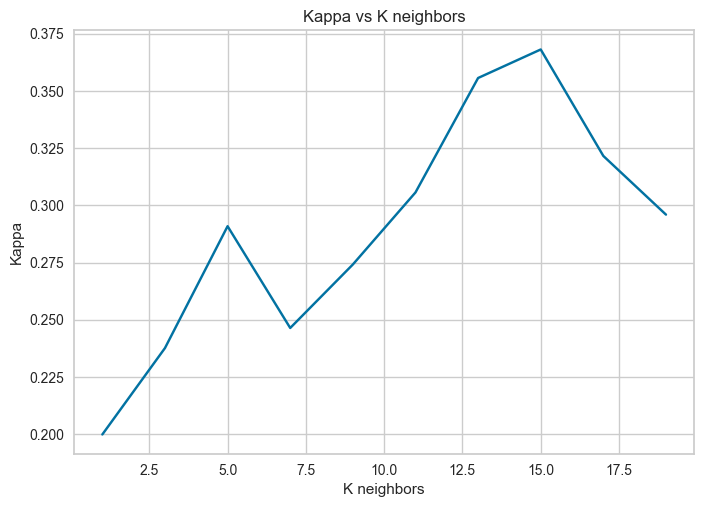

In [202]:
# Visualizamos el kappa
# Observamos la mejor respuesta con k=1

cols = ['age', 'serum_cholestoral', 'maximum_heart_rate_achieved', 'oldpeak_ST_depression_induced_by_exercise']
knnReg_st = make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=k))
results = [kappa_metrics(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=i)),
            X_train['rem'][cols],X_test['rem'][cols],y_train['rem'],y_test['rem'])[1] for i in range(1,21,2)]
ax = sns.lineplot(x=range(1,21,2),
             y=results)
ax.set(title="Kappa vs K neighbors",ylabel='Kappa',xlabel='K neighbors')
kvals = [(col,i) for col,i in zip(results,range(1,21,2))]

print(sorted(kvals, key=lambda x: x[0],reverse=True)[0])

In [203]:
# Guardamos el mejor modelo utilizando k=15 sin PCA

cols = ['age', 'serum_cholestoral', 'maximum_heart_rate_achieved', 'oldpeak_ST_depression_induced_by_exercise']
model,metrics = classification_metrics(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=15)),
                                   X_train['rem'][cols],X_test['rem'][cols],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/KnnClassifierRem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/KnnClassifierRemMetrics.pkl','wb'))

Training Accuracy = 0.6408730158730159
Test Accuracy = 0.625
Training Kappa = 0.3843246563046251
Test Kappa = 0.3681245259850482
Training Precision = [0.71 0.52 0.37 0.7  0.  ]
Test Precision = [0.73 0.47 0.4  0.2  0.  ]
Training recall = [0.92 0.52 0.15 0.15 0.  ]
Test recall = [0.92 0.5  0.2  0.05 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.71      0.92      0.80       252
           1       0.52      0.52      0.52       147
           2       0.37      0.15      0.21        48
           3       0.70      0.15      0.25        46
           4       0.00      0.00      0.00        11

    accuracy                           0.64       504
   macro avg       0.46      0.35      0.36       504
weighted avg       0.60      0.64      0.59       504



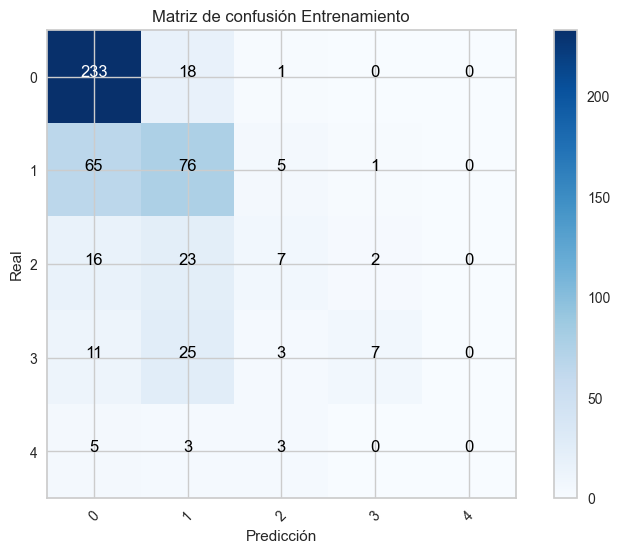

Reporte Prueba
              precision    recall  f1-score   support

           0       0.73      0.92      0.81       108
           1       0.47      0.50      0.48        62
           2       0.40      0.20      0.27        20
           3       0.20      0.05      0.08        19
           4       0.00      0.00      0.00         7

    accuracy                           0.62       216
   macro avg       0.36      0.33      0.33       216
weighted avg       0.56      0.62      0.58       216



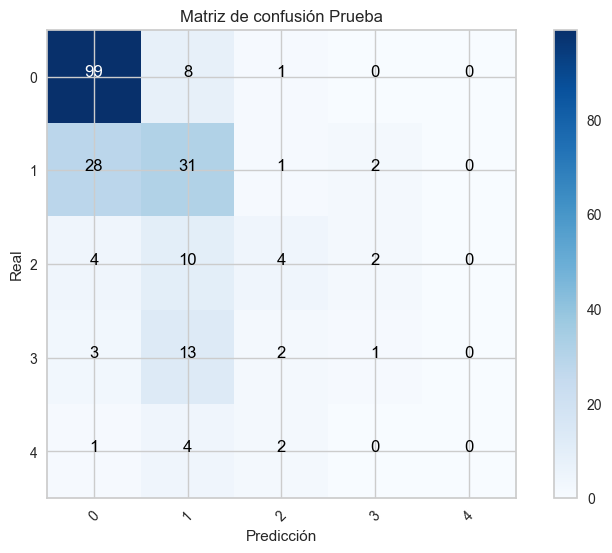

In [204]:
report_and_conf_matrix(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=15)),
                       X_train['rem'][cols],X_test['rem'][cols],y_train['rem'],y_test['rem'])

La exactitud para la prueba de nuestro modelo es del 62%

La precisión para la clase menos riesgosa es de 73% 

La sensibilidad para la clase más riesgosa de 0%

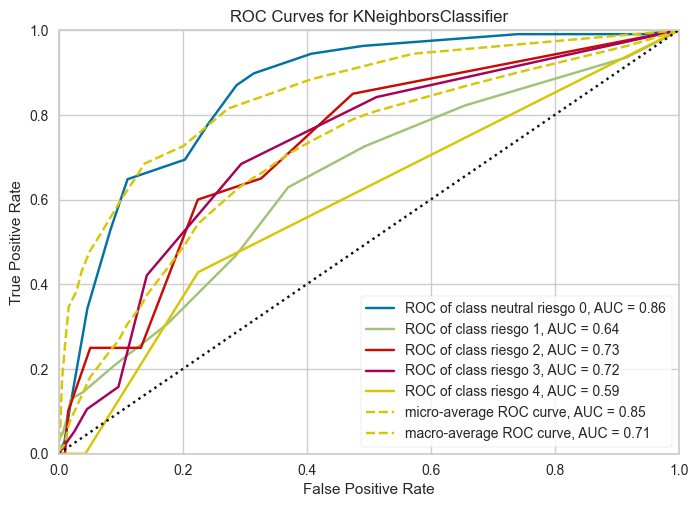

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for KNeighborsClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                                 ('kneighborsclassifier',
                                  KNeighborsClassifier(n_neighbors=15))]))

In [205]:
plot_ROC_curve(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=15)),
                X_train=X_train['rem'][cols], y_train=y_train['rem'],X_test=X_test['rem'][cols], y_test=y_test['rem'])

Obtenemos peores resultados que con la regresión logística, las AUC micro y macro son de 0.85 y 0.71 respectivamente. Aunque aceptables, peores que los obtenidos previamente

Ahora trabajamos con el dataset con PCA

In [206]:
# Podemos encontrar el mejor k para nuestro modelo
# Utilizamos un pipeline para incluir la normalización y el clasificador knn 

cols = ['pc1','pc2','pc3','pc4']
for k in range(1,21,2):
    print('Results for k =',k)
    knnReg_st = make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=k))
    classification_metrics(knnReg_st,X_train['pca_rem'][cols],X_test['pca_rem'][cols],y_train['pca_rem'],y_test['pca_rem'])
    print()

Results for k = 1
Training Accuracy = 0.998015873015873
Test Accuracy = 0.46296296296296297
Training Kappa = 0.9969354809288411
Test Kappa = 0.17505679386297035
Training Precision = [1.   1.   1.   0.98 1.  ]
Test Precision = [0.65 0.32 0.28 0.12 0.14]
Training recall = [1.   0.99 1.   1.   1.  ]
Test recall = [0.66 0.31 0.35 0.11 0.14]

Results for k = 3
Training Accuracy = 0.7361111111111112
Test Accuracy = 0.5555555555555556
Training Kappa = 0.5550304028039617
Test Kappa = 0.24448006995554916
Training Precision = [0.75 0.68 0.72 0.9  1.  ]
Test Precision = [0.65 0.44 0.14 0.25 0.  ]
Training recall = [0.96 0.63 0.38 0.39 0.09]
Test recall = [0.86 0.39 0.1  0.05 0.  ]

Results for k = 5
Training Accuracy = 0.6805555555555556
Test Accuracy = 0.5972222222222222
Training Kappa = 0.4682046072680801
Test Kappa = 0.3356665606108812
Training Precision = [0.74 0.61 0.44 0.65 0.  ]
Test Precision = [0.71 0.48 0.3  0.29 0.  ]
Training recall = [0.92 0.56 0.29 0.33 0.  ]
Test recall = [0.87 0.4

(0.3505289088537894, 15)


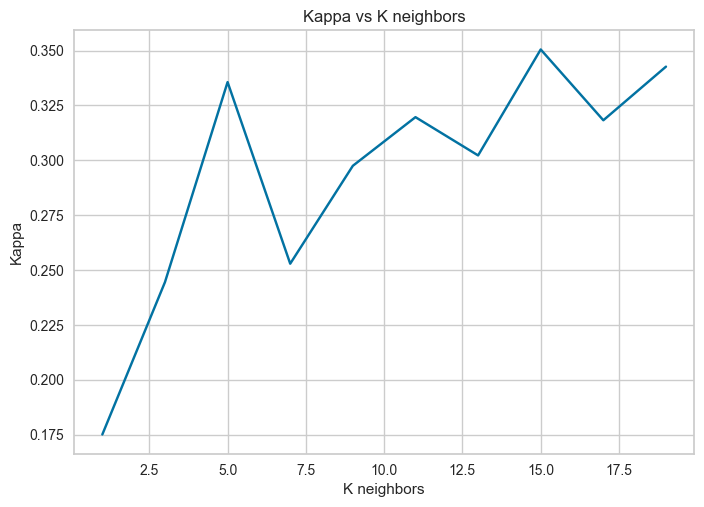

In [207]:
# Visualizamos el kappa
# Observamos la mejor respuesta con k=1

cols = ['pc1','pc2','pc3','pc4']
knnReg_st = make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=k))
results = [kappa_metrics(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=i)),
            X_train['pca_rem'][cols],X_test['pca_rem'][cols],y_train['pca_rem'],y_test['pca_rem'])[1] for i in range(1,21,2)]
ax = sns.lineplot(x=range(1,21,2),
             y=results)
ax.set(title="Kappa vs K neighbors",ylabel='Kappa',xlabel='K neighbors')
kvals = [(col,i) for col,i in zip(results,range(1,21,2))]

print(sorted(kvals, key=lambda x: x[0],reverse=True)[0])

In [208]:
# Guardamos el mejor modelo utilizando k=15 con PCA

cols = ['pc1','pc2','pc3','pc4']
model,metrics = classification_metrics(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=15)),
                                   X_train['pca_rem'][cols],X_test['pca_rem'][cols],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/KnnClassifierPCARem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/KnnClassifierPCARemMetrics.pkl','wb'))

Training Accuracy = 0.6428571428571429
Test Accuracy = 0.6157407407407407
Training Kappa = 0.3856488880461576
Test Kappa = 0.3505289088537894
Training Precision = [0.7  0.53 0.4  0.8  0.  ]
Test Precision = [0.72 0.46 0.44 0.25 0.  ]
Training recall = [0.92 0.54 0.12 0.17 0.  ]
Test recall = [0.9  0.5  0.2  0.05 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.70      0.92      0.79       252
           1       0.53      0.54      0.54       147
           2       0.40      0.12      0.19        48
           3       0.80      0.17      0.29        46
           4       0.00      0.00      0.00        11

    accuracy                           0.64       504
   macro avg       0.49      0.35      0.36       504
weighted avg       0.62      0.64      0.60       504



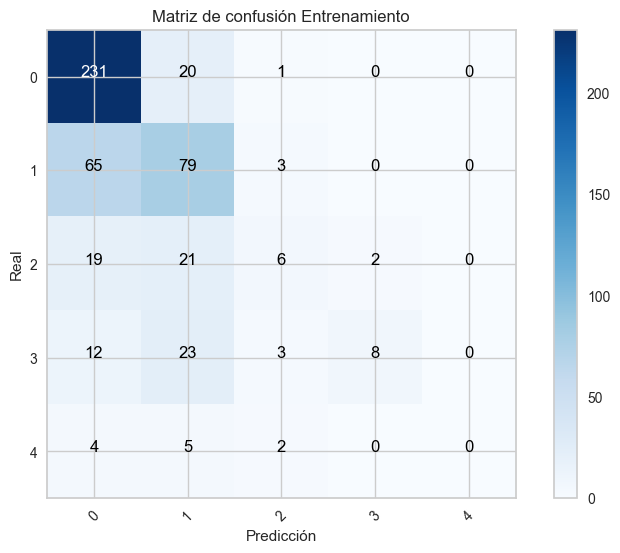

Reporte Prueba
              precision    recall  f1-score   support

           0       0.72      0.90      0.80       108
           1       0.46      0.50      0.48        62
           2       0.44      0.20      0.28        20
           3       0.25      0.05      0.09        19
           4       0.00      0.00      0.00         7

    accuracy                           0.62       216
   macro avg       0.37      0.33      0.33       216
weighted avg       0.55      0.62      0.57       216



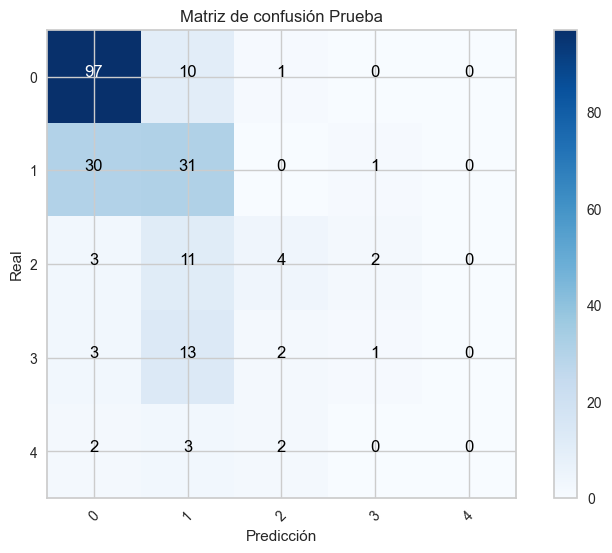

In [209]:
report_and_conf_matrix(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=15)),
                       X_train['pca_rem'][cols],X_test['pca_rem'][cols],y_train['pca_rem'],y_test['pca_rem'])

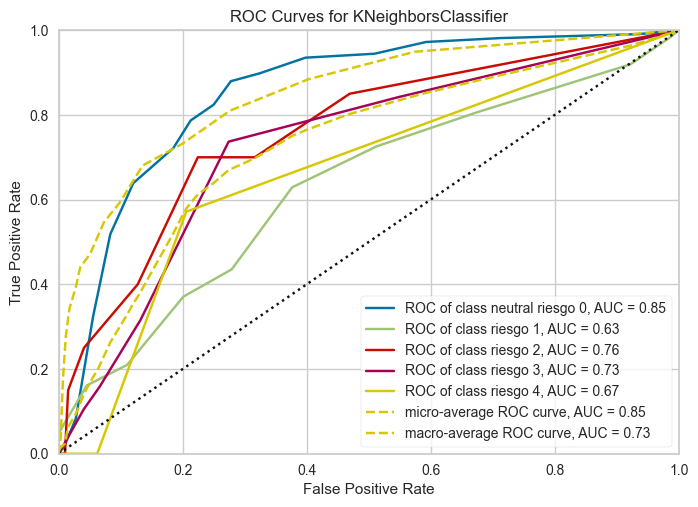

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for KNeighborsClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                                 ('kneighborsclassifier',
                                  KNeighborsClassifier(n_neighbors=15))]))

In [210]:
plot_ROC_curve(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=15)),
                X_train=X_train['pca_rem'][cols], y_train=y_train['pca_rem'],X_test=X_test['pca_rem'][cols], y_test=y_test['pca_rem'])

### 7.4. Modelo Naïve Bayes

Utilizamos primero el conjunto de datos sin PCA

In [211]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV

classification_metrics(GaussianNB(),X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

Training Accuracy = 0.2361111111111111
Test Accuracy = 0.24074074074074073
Training Kappa = 0.08071897592359234
Test Kappa = 0.08039770514784139
Training Precision = [1.   0.34 0.09 0.29 0.06]
Test Precision = [0.71 0.37 0.09 0.25 0.06]
Training recall = [0.08 0.5  0.1  0.22 1.  ]
Test recall = [0.05 0.58 0.1  0.26 0.57]


(GaussianNB(),
 {'Training Accuracy': 0.2361111111111111,
  'Test Accuracy': 0.24074074074074073,
  'Training Kappa': 0.08071897592359234,
  'Test Kappa': 0.08039770514784139,
  'Training Precision': array([1.  , 0.34, 0.09, 0.29, 0.06]),
  'Test Precision': array([0.71, 0.37, 0.09, 0.25, 0.06]),
  'Training recall': array([0.08, 0.5 , 0.1 , 0.22, 1.  ]),
  'Test recall': array([0.05, 0.58, 0.1 , 0.26, 0.57])})

In [212]:
nb_classifier = GaussianNB()

params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}
gs_NB = GridSearchCV(estimator=nb_classifier, 
                 param_grid=params_NB, 
                 cv=5, 
                 verbose=1, 
                 scoring='accuracy') 
gs_NB.fit(X_train['rem'], y_train['rem'])

Fitting 5 folds for each of 100 candidates, totalling 500 fits


GridSearchCV(cv=5, estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.00e+00, 8.11e-01, 6.58e-01, 5.34e-01, 4.33e-01, 3.51e-01,
       2.85e-01, 2.31e-01, 1.87e-01, 1.52e-01, 1.23e-01, 1.00e-01,
       8.11e-02, 6.58e-02, 5.34e-02, 4.33e-02, 3.51e-02, 2.85e-02,
       2.31e-02, 1.87e-02, 1.52e-02, 1.23e-02, 1.00e-02, 8.11e-03,
       6.58e-03, 5.34e-03, 4.33e-03, 3.51e-03, 2.85e-03, 2.31e-03,
       1.87...
       3.51e-06, 2.85e-06, 2.31e-06, 1.87e-06, 1.52e-06, 1.23e-06,
       1.00e-06, 8.11e-07, 6.58e-07, 5.34e-07, 4.33e-07, 3.51e-07,
       2.85e-07, 2.31e-07, 1.87e-07, 1.52e-07, 1.23e-07, 1.00e-07,
       8.11e-08, 6.58e-08, 5.34e-08, 4.33e-08, 3.51e-08, 2.85e-08,
       2.31e-08, 1.87e-08, 1.52e-08, 1.23e-08, 1.00e-08, 8.11e-09,
       6.58e-09, 5.34e-09, 4.33e-09, 3.51e-09, 2.85e-09, 2.31e-09,
       1.87e-09, 1.52e-09, 1.23e-09, 1.00e-09])},
             scoring='accuracy', verbose=1)

In [213]:
# Mejores hiperparámetros

gs_NB.best_params_

{'var_smoothing': 8.111308307896872e-05}

In [214]:
gs_NB.best_score_

0.6547722772277227

In [215]:
# Guardamos el mejor modelo utilizando el dataset sin PCA

model,metrics = classification_metrics(GaussianNB(var_smoothing=8.111308307896872e-05),
                                   X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/NBClassifierRem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/NBClassifierRemMetrics.pkl','wb'))

Training Accuracy = 0.6726190476190477
Test Accuracy = 0.6388888888888888
Training Kappa = 0.4631479054634191
Test Kappa = 0.4182119548326946
Training Precision = [0.78 0.54 0.44 0.56 0.2 ]
Test Precision = [0.83 0.47 0.25 0.26 0.  ]
Training recall = [0.89 0.62 0.08 0.41 0.09]
Test recall = [0.88 0.6  0.05 0.26 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.78      0.89      0.83       252
           1       0.54      0.62      0.57       147
           2       0.44      0.08      0.14        48
           3       0.56      0.41      0.47        46
           4       0.20      0.09      0.12        11

    accuracy                           0.67       504
   macro avg       0.50      0.42      0.43       504
weighted avg       0.65      0.67      0.64       504



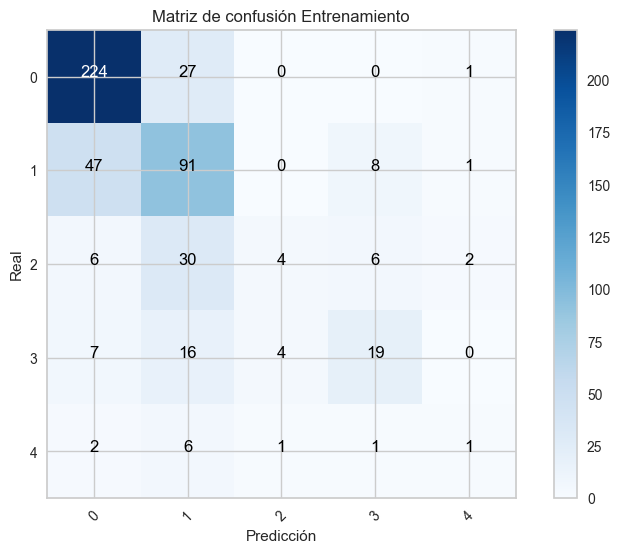

Reporte Prueba
              precision    recall  f1-score   support

           0       0.83      0.88      0.85       108
           1       0.47      0.60      0.53        62
           2       0.25      0.05      0.08        20
           3       0.26      0.26      0.26        19
           4       0.00      0.00      0.00         7

    accuracy                           0.64       216
   macro avg       0.36      0.36      0.35       216
weighted avg       0.60      0.64      0.61       216



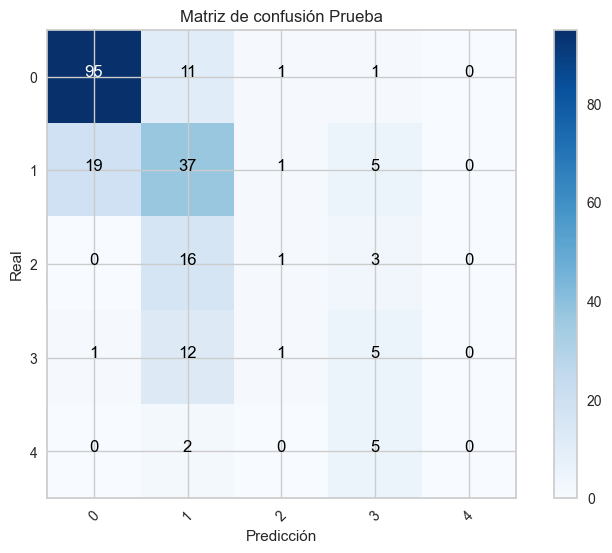

In [216]:
report_and_conf_matrix(GaussianNB(var_smoothing=8.111308307896872e-05),
                       X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

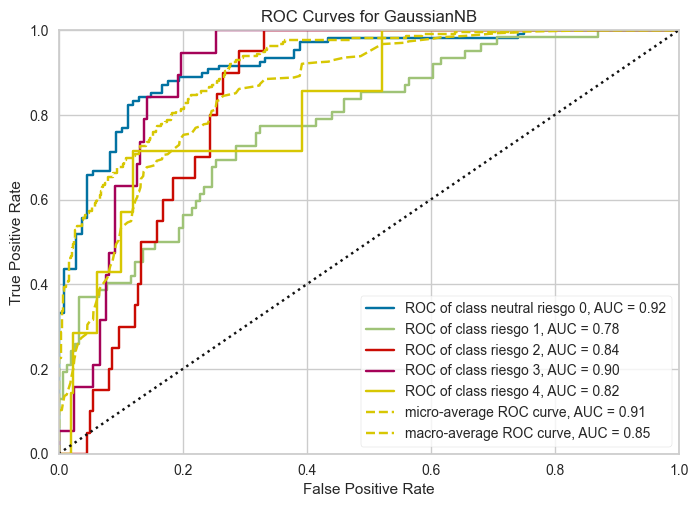

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for GaussianNB'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=GaussianNB(var_smoothing=8.111308307896872e-05))

In [217]:
plot_ROC_curve(GaussianNB(var_smoothing=8.111308307896872e-05),
                X_train=X_train['rem'], y_train=y_train['rem'],X_test=X_test['rem'], y_test=y_test['rem'])

Trabajamos con el conjunto de datos sin PCA pero con feature selection

In [218]:
nb_classifier = GaussianNB()

X_t = SelectKBest(score_func=f_classif,k=17).fit_transform(X_train['rem'], y_train['rem'])

params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}
gs_NB = GridSearchCV(estimator=nb_classifier, 
                 param_grid=params_NB, 
                 cv=5, 
                 verbose=1, 
                 scoring='accuracy') 
gs_NB.fit(X_t, y_train['rem'])

Fitting 5 folds for each of 100 candidates, totalling 500 fits


GridSearchCV(cv=5, estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.00e+00, 8.11e-01, 6.58e-01, 5.34e-01, 4.33e-01, 3.51e-01,
       2.85e-01, 2.31e-01, 1.87e-01, 1.52e-01, 1.23e-01, 1.00e-01,
       8.11e-02, 6.58e-02, 5.34e-02, 4.33e-02, 3.51e-02, 2.85e-02,
       2.31e-02, 1.87e-02, 1.52e-02, 1.23e-02, 1.00e-02, 8.11e-03,
       6.58e-03, 5.34e-03, 4.33e-03, 3.51e-03, 2.85e-03, 2.31e-03,
       1.87...
       3.51e-06, 2.85e-06, 2.31e-06, 1.87e-06, 1.52e-06, 1.23e-06,
       1.00e-06, 8.11e-07, 6.58e-07, 5.34e-07, 4.33e-07, 3.51e-07,
       2.85e-07, 2.31e-07, 1.87e-07, 1.52e-07, 1.23e-07, 1.00e-07,
       8.11e-08, 6.58e-08, 5.34e-08, 4.33e-08, 3.51e-08, 2.85e-08,
       2.31e-08, 1.87e-08, 1.52e-08, 1.23e-08, 1.00e-08, 8.11e-09,
       6.58e-09, 5.34e-09, 4.33e-09, 3.51e-09, 2.85e-09, 2.31e-09,
       1.87e-09, 1.52e-09, 1.23e-09, 1.00e-09])},
             scoring='accuracy', verbose=1)

In [219]:
gs_NB.best_params_

{'var_smoothing': 6.579332246575683e-05}

In [220]:
gs_NB.best_score_

0.6547722772277228

In [221]:
# Guardamos el mejor modelo sin PCA utilizando feature selection

pipeline_nb = make_pipeline(SelectKBest(score_func=f_classif,k=17),
                            GaussianNB(var_smoothing=6.579332246575683e-05))

model,metrics = classification_metrics(pipeline_nb,
                                   X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/NBClassifierRemFS.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/NBClassifierRemFSMetrics.pkl','wb'))

Training Accuracy = 0.6726190476190477
Test Accuracy = 0.6342592592592593
Training Kappa = 0.4685752628047416
Test Kappa = 0.4147345314858004
Training Precision = [0.79 0.56 0.33 0.48 0.5 ]
Test Precision = [0.81 0.49 0.23 0.28 0.  ]
Training recall = [0.9  0.56 0.12 0.5  0.09]
Test recall = [0.89 0.53 0.15 0.26 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.79      0.90      0.84       252
           1       0.56      0.56      0.56       147
           2       0.33      0.12      0.18        48
           3       0.48      0.50      0.49        46
           4       0.50      0.09      0.15        11

    accuracy                           0.67       504
   macro avg       0.53      0.43      0.44       504
weighted avg       0.64      0.67      0.65       504



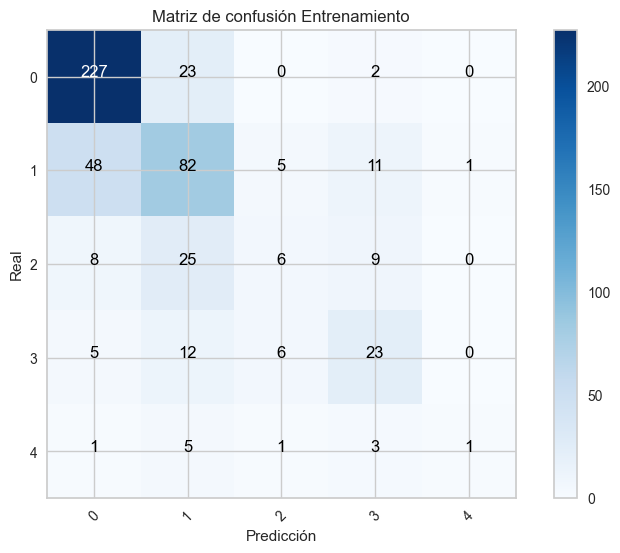

Reporte Prueba
              precision    recall  f1-score   support

           0       0.81      0.89      0.85       108
           1       0.49      0.53      0.51        62
           2       0.23      0.15      0.18        20
           3       0.28      0.26      0.27        19
           4       0.00      0.00      0.00         7

    accuracy                           0.63       216
   macro avg       0.36      0.37      0.36       216
weighted avg       0.59      0.63      0.61       216



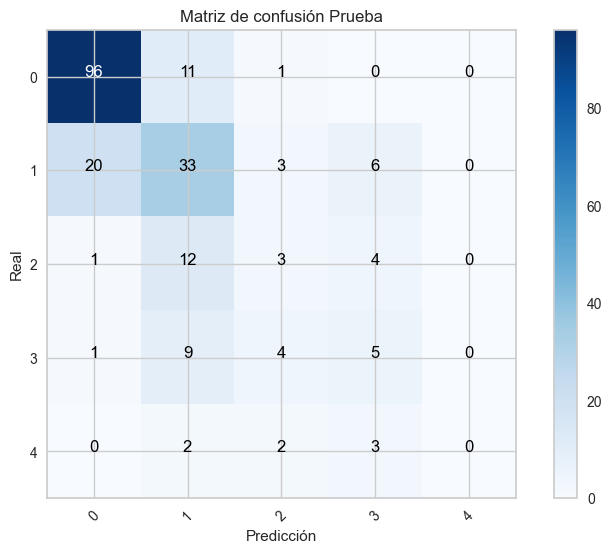

In [222]:
pipeline_nb = make_pipeline(SelectKBest(score_func=f_classif,k=17),
                            GaussianNB(var_smoothing=6.579332246575683e-05))
report_and_conf_matrix(pipeline_nb,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

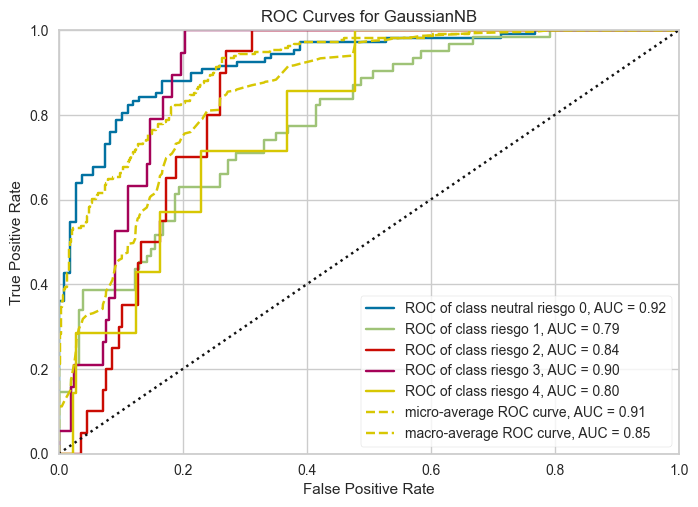

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for GaussianNB'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=17)),
                                 ('gaussiannb',
                                  GaussianNB(var_smoothing=6.579332246575683e-05))]))

In [223]:
pipeline_nb = make_pipeline(SelectKBest(score_func=f_classif,k=17),
                            GaussianNB(var_smoothing=6.579332246575683e-05))
plot_ROC_curve(pipeline_nb,X_train=X_train['rem'], y_train=y_train['rem'],X_test=X_test['rem'], y_test=y_test['rem'])

Utilizamos el conjunto de datos con PCA

In [224]:
nb_classifier = GaussianNB()

params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}
gs_NB = GridSearchCV(estimator=nb_classifier, 
                 param_grid=params_NB, 
                 cv=5, 
                 verbose=1, 
                 scoring='accuracy') 
gs_NB.fit(X_train['pca_rem'], y_train['pca_rem'])

Fitting 5 folds for each of 100 candidates, totalling 500 fits


GridSearchCV(cv=5, estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.00e+00, 8.11e-01, 6.58e-01, 5.34e-01, 4.33e-01, 3.51e-01,
       2.85e-01, 2.31e-01, 1.87e-01, 1.52e-01, 1.23e-01, 1.00e-01,
       8.11e-02, 6.58e-02, 5.34e-02, 4.33e-02, 3.51e-02, 2.85e-02,
       2.31e-02, 1.87e-02, 1.52e-02, 1.23e-02, 1.00e-02, 8.11e-03,
       6.58e-03, 5.34e-03, 4.33e-03, 3.51e-03, 2.85e-03, 2.31e-03,
       1.87...
       3.51e-06, 2.85e-06, 2.31e-06, 1.87e-06, 1.52e-06, 1.23e-06,
       1.00e-06, 8.11e-07, 6.58e-07, 5.34e-07, 4.33e-07, 3.51e-07,
       2.85e-07, 2.31e-07, 1.87e-07, 1.52e-07, 1.23e-07, 1.00e-07,
       8.11e-08, 6.58e-08, 5.34e-08, 4.33e-08, 3.51e-08, 2.85e-08,
       2.31e-08, 1.87e-08, 1.52e-08, 1.23e-08, 1.00e-08, 8.11e-09,
       6.58e-09, 5.34e-09, 4.33e-09, 3.51e-09, 2.85e-09, 2.31e-09,
       1.87e-09, 1.52e-09, 1.23e-09, 1.00e-09])},
             scoring='accuracy', verbose=1)

In [225]:
gs_NB.best_params_

{'var_smoothing': 0.2848035868435802}

In [226]:
gs_NB.best_score_

0.6448910891089109

In [227]:
# Guardamos el mejor modelo utilizando el dataset con PCA

model,metrics = classification_metrics(GaussianNB(var_smoothing=0.2848035868435802),
                                   X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/NBClassifierPCARem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/NBClassifierPCARemMetrics.pkl','wb'))

Training Accuracy = 0.6785714285714286
Test Accuracy = 0.6620370370370371
Training Kappa = 0.4692564207570351
Test Kappa = 0.4499790707408958
Training Precision = [0.77 0.55 0.38 0.62 0.36]
Test Precision = [0.82 0.53 0.17 0.33 0.  ]
Training recall = [0.92 0.58 0.1  0.35 0.36]
Test recall = [0.9  0.66 0.05 0.21 0.  ]


Utilizamos el conjunto de datos con PCA y con feature selection

In [228]:
nb_classifier = GaussianNB()

X_t = SelectKBest(score_func=f_classif,k=25).fit_transform(X_train['pca_rem'], y_train['pca_rem'])

params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}
gs_NB = GridSearchCV(estimator=nb_classifier, 
                 param_grid=params_NB, 
                 cv=5, 
                 verbose=1, 
                 scoring='accuracy') 
gs_NB.fit(X_t, y_train['pca_rem'])

Fitting 5 folds for each of 100 candidates, totalling 500 fits


GridSearchCV(cv=5, estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.00e+00, 8.11e-01, 6.58e-01, 5.34e-01, 4.33e-01, 3.51e-01,
       2.85e-01, 2.31e-01, 1.87e-01, 1.52e-01, 1.23e-01, 1.00e-01,
       8.11e-02, 6.58e-02, 5.34e-02, 4.33e-02, 3.51e-02, 2.85e-02,
       2.31e-02, 1.87e-02, 1.52e-02, 1.23e-02, 1.00e-02, 8.11e-03,
       6.58e-03, 5.34e-03, 4.33e-03, 3.51e-03, 2.85e-03, 2.31e-03,
       1.87...
       3.51e-06, 2.85e-06, 2.31e-06, 1.87e-06, 1.52e-06, 1.23e-06,
       1.00e-06, 8.11e-07, 6.58e-07, 5.34e-07, 4.33e-07, 3.51e-07,
       2.85e-07, 2.31e-07, 1.87e-07, 1.52e-07, 1.23e-07, 1.00e-07,
       8.11e-08, 6.58e-08, 5.34e-08, 4.33e-08, 3.51e-08, 2.85e-08,
       2.31e-08, 1.87e-08, 1.52e-08, 1.23e-08, 1.00e-08, 8.11e-09,
       6.58e-09, 5.34e-09, 4.33e-09, 3.51e-09, 2.85e-09, 2.31e-09,
       1.87e-09, 1.52e-09, 1.23e-09, 1.00e-09])},
             scoring='accuracy', verbose=1)

In [229]:
gs_NB.best_params_

{'var_smoothing': 0.15199110829529336}

In [230]:
gs_NB.best_score_

0.6568316831683167

In [231]:
# Guardamos el mejor modelo con PCA utilizando feature selection

pipeline_nb = make_pipeline(SelectKBest(score_func=f_classif,k=25),
                            GaussianNB(var_smoothing=0.15199110829529336))

model,metrics = classification_metrics(pipeline_nb,
                                   X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/NBClassifierPCARemFS.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/NBClassifierPCARemFSMetrics.pkl','wb'))

Training Accuracy = 0.6964285714285714
Test Accuracy = 0.6851851851851852
Training Kappa = 0.5146220180021401
Test Kappa = 0.5114747555378168
Training Precision = [0.8  0.64 0.35 0.55 0.38]
Test Precision = [0.89 0.58 0.25 0.4  0.  ]
Training recall = [0.9  0.58 0.25 0.46 0.45]
Test recall = [0.85 0.73 0.25 0.32 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.80      0.90      0.85       252
           1       0.64      0.58      0.61       147
           2       0.35      0.25      0.29        48
           3       0.55      0.46      0.50        46
           4       0.38      0.45      0.42        11

    accuracy                           0.70       504
   macro avg       0.55      0.53      0.53       504
weighted avg       0.68      0.70      0.68       504



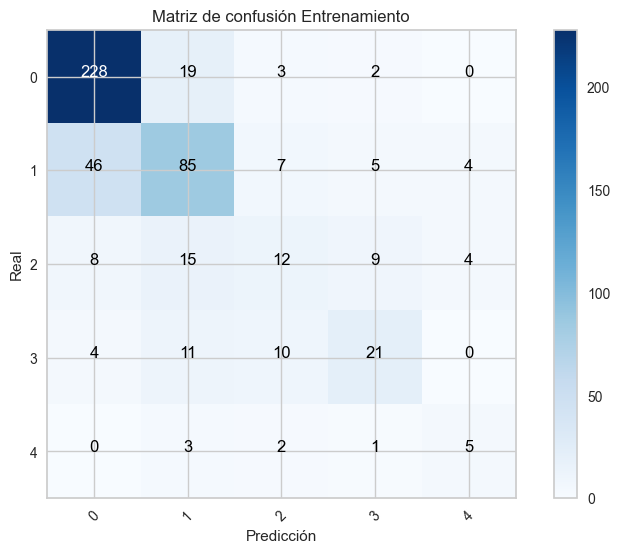

Reporte Prueba
              precision    recall  f1-score   support

           0       0.89      0.85      0.87       108
           1       0.58      0.73      0.65        62
           2       0.25      0.25      0.25        20
           3       0.40      0.32      0.35        19
           4       0.00      0.00      0.00         7

    accuracy                           0.69       216
   macro avg       0.43      0.43      0.42       216
weighted avg       0.67      0.69      0.68       216



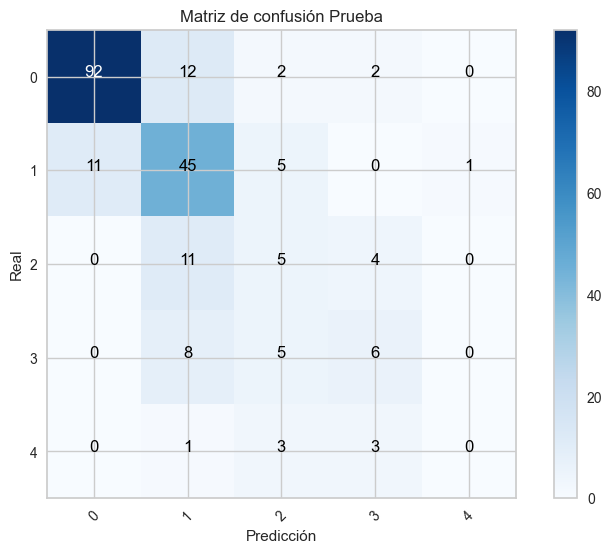

In [232]:
pipeline_nb = make_pipeline(SelectKBest(score_func=f_classif,k=25),
                            GaussianNB(var_smoothing=0.15199110829529336))
report_and_conf_matrix(pipeline_nb,
                X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

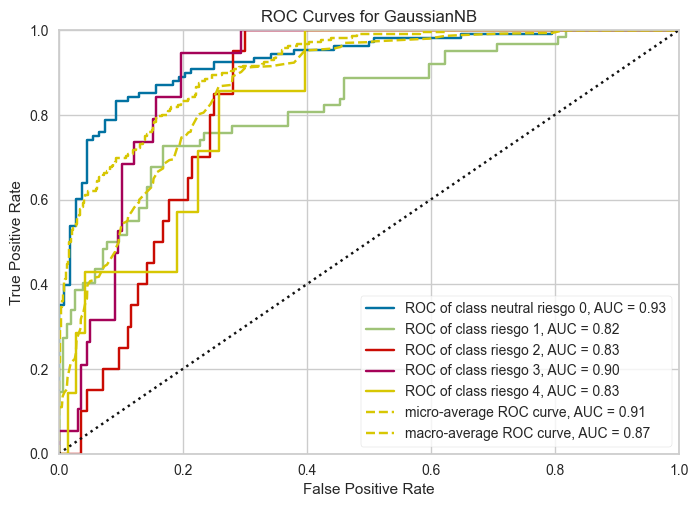

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for GaussianNB'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=25)),
                                 ('gaussiannb',
                                  GaussianNB(var_smoothing=0.15199110829529336))]))

In [233]:
pipeline_nb = make_pipeline(SelectKBest(score_func=f_classif,k=25),
                            GaussianNB(var_smoothing=0.15199110829529336))
plot_ROC_curve(pipeline_nb,X_train=X_train['pca_rem'], y_train=y_train['pca_rem'], X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

### 7.5. Modelo de Árbol de Clasificación

Conjunto de datos sin PCA

Training Accuracy = 1.0
Test Accuracy = 0.5509259259259259
Training Kappa = 1.0
Test Kappa = 0.3094720189835871
Training Precision = [1. 1. 1. 1. 1.]
Test Precision = [0.75 0.48 0.16 0.14 0.25]
Training recall = [1. 1. 1. 1. 1.]
Test recall = [0.76 0.47 0.2  0.11 0.29]
DecisionTreeClassifier(random_state=1234)


[Text(0.4732142857142857, 0.9, 'x[12] <= 0.5\ngini = 0.647\nsamples = 504\nvalue = [252, 147, 48, 46, 11]'),
 Text(0.23214285714285715, 0.7, 'x[6] <= 0.5\ngini = 0.367\nsamples = 257\nvalue = [200, 41, 7, 7, 2]'),
 Text(0.14285714285714285, 0.5, 'x[33] <= 0.5\ngini = 0.307\nsamples = 239\nvalue = [196.0, 34.0, 4.0, 3.0, 2.0]'),
 Text(0.07142857142857142, 0.3, 'x[3] <= 1.7\ngini = 0.231\nsamples = 206\nvalue = [179.0, 24.0, 2.0, 1.0, 0.0]'),
 Text(0.03571428571428571, 0.1, '\n  (...)  \n'),
 Text(0.10714285714285714, 0.1, '\n  (...)  \n'),
 Text(0.21428571428571427, 0.3, 'x[3] <= 1.95\ngini = 0.632\nsamples = 33\nvalue = [17, 10, 2, 2, 2]'),
 Text(0.17857142857142858, 0.1, '\n  (...)  \n'),
 Text(0.25, 0.1, '\n  (...)  \n'),
 Text(0.32142857142857145, 0.5, 'x[2] <= 96.0\ngini = 0.722\nsamples = 18\nvalue = [4, 7, 3, 4, 0]'),
 Text(0.2857142857142857, 0.3, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 0, 3, 0]'),
 Text(0.35714285714285715, 0.3, 'x[2] <= 132.5\ngini = 0.667\nsamples = 15\nvalu

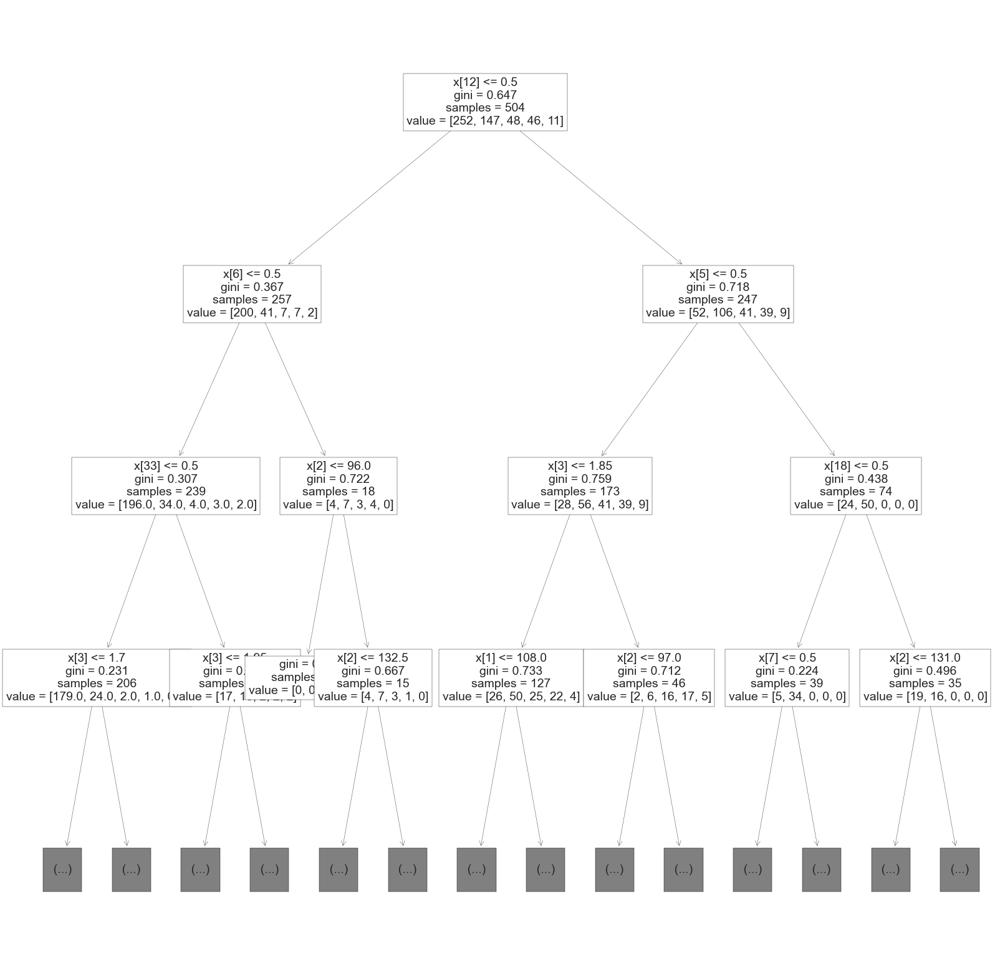

In [234]:
# Utilizamos un árbol de clasificación
# Verificamos sus métricas

from sklearn.tree import DecisionTreeClassifier, plot_tree

classification_metrics(DecisionTreeClassifier(random_state=1234),X_train['rem'],X_test['rem'],y_train['pca_rem'],y_test['pca_rem'])

tree_reg = DecisionTreeClassifier(random_state=1234).fit(X_train['rem'],y_train['rem'])
print(tree_reg)

# Diagramamos los primeros tres niveles del árbol resultante

plt.figure(figsize=(20,20))
plot_tree(tree_reg,filled=False,fontsize=14,max_depth=3)

In [235]:
# Vamos a realizar un ajuste de hiperparámetros para encontrar el mejor modelo de árbol de clasificación
# Establecemos la grilla de parámetros que verificar
# Haciendo uso de estos parámetros y una validación cruzada de 3 doblajes buscamos el mejor modelo
# Tiempo aprox = 2s 

parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11],
           "min_samples_leaf":[1,2,3,4,],
           "max_leaf_nodes":[None,10,20,30] }

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer

kappa_scorer = make_scorer(cohen_kappa_score)
tuning_model=GridSearchCV(DecisionTreeClassifier(random_state=1234),
                          param_grid=parameters,scoring=kappa_scorer,
                          cv=3,verbose=3)

tuning_model.fit(X_train['rem'],y_train['rem'])

Fitting 3 folds for each of 192 candidates, totalling 576 fits
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.366 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.324 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.353 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.366 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.324 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.353 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.366 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.324 total time=   0.0s
[CV 3/3] END max_de

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=1234),
             param_grid={'max_depth': [1, 3, 5, 7, 9, 11],
                         'max_leaf_nodes': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 3, 4],
                         'splitter': ['best', 'random']},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [236]:
# Los híperparámetros del mejor modelo

tuning_model.best_params_

{'max_depth': 9,
 'max_leaf_nodes': 30,
 'min_samples_leaf': 1,
 'splitter': 'random'}

In [237]:
# El mejor modelo de árbol de clasificación sin PCA


tree_clsfr = DecisionTreeClassifier(random_state=1234,max_depth=9,
                                         max_leaf_nodes=30,
                                         min_samples_leaf=1,
                                         splitter='random')

model,metrics = classification_metrics(tree_clsfr,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/DecissionTreeClassifierRem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/DecisionTreeClassifierRemMetrics.pkl','wb'))

Training Accuracy = 0.7301587301587301
Test Accuracy = 0.625
Training Kappa = 0.5575008715187666
Test Kappa = 0.39650236280224893
Training Precision = [0.83 0.6  0.63 0.58 0.  ]
Test Precision = [0.79 0.51 0.5  0.14 0.  ]
Training recall = [0.95 0.67 0.25 0.41 0.  ]
Test recall = [0.86 0.58 0.15 0.16 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.83      0.95      0.89       252
           1       0.60      0.67      0.63       147
           2       0.63      0.25      0.36        48
           3       0.58      0.41      0.48        46
           4       0.00      0.00      0.00        11

    accuracy                           0.73       504
   macro avg       0.53      0.46      0.47       504
weighted avg       0.70      0.73      0.70       504



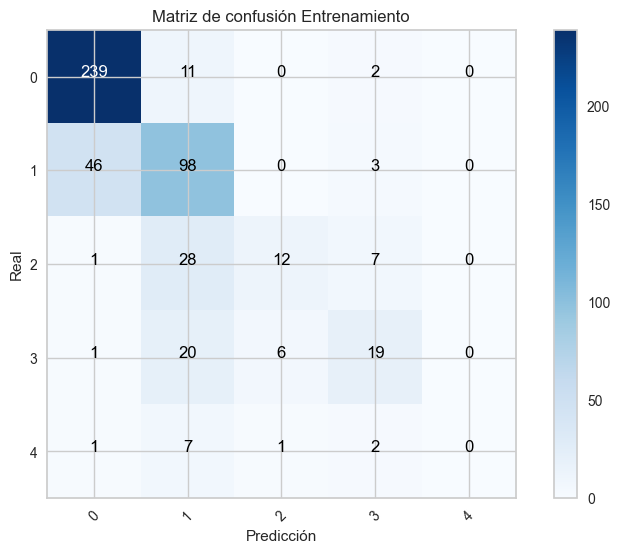

Reporte Prueba
              precision    recall  f1-score   support

           0       0.79      0.86      0.82       108
           1       0.51      0.58      0.54        62
           2       0.50      0.15      0.23        20
           3       0.14      0.16      0.15        19
           4       0.00      0.00      0.00         7

    accuracy                           0.62       216
   macro avg       0.39      0.35      0.35       216
weighted avg       0.60      0.62      0.60       216



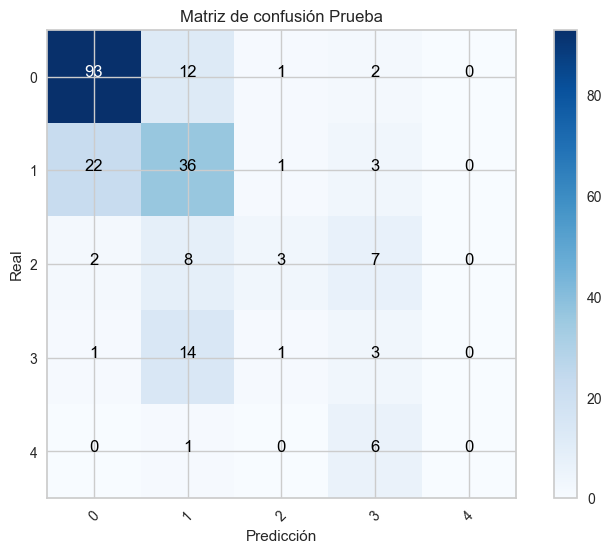

In [238]:
report_and_conf_matrix(DecisionTreeClassifier(random_state=1234,max_depth=9,
                                         max_leaf_nodes=30,
                                         min_samples_leaf=1,
                                         splitter='random'),
                       X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

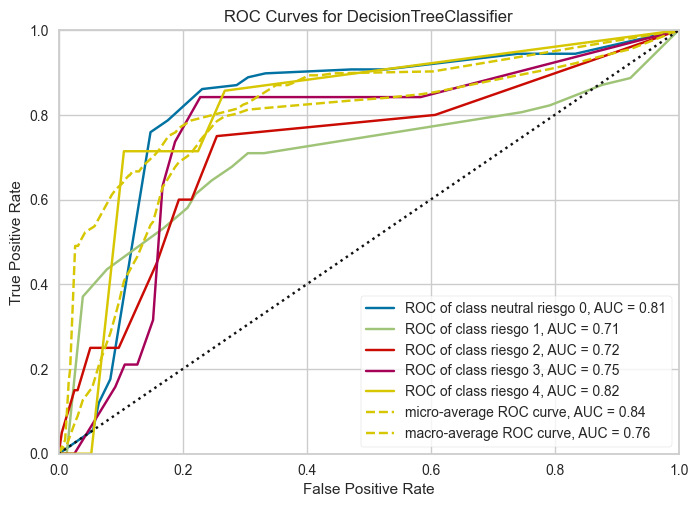

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for DecisionTreeClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=DecisionTreeClassifier(max_depth=9, max_leaf_nodes=30,
                                        random_state=1234, splitter='random'))

In [239]:
plot_ROC_curve(DecisionTreeClassifier(random_state=1234,max_depth=9,
                                         max_leaf_nodes=30,
                                         min_samples_leaf=1,
                                         splitter='random'),
                X_train=X_train['rem'], y_train=y_train['rem'],X_test=X_test['rem'], y_test=y_test['rem'])

Conjunto de datos sin PCA y con feature selection

In [240]:
# Tiempo aproximado: 2s

parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11],
           "min_samples_leaf":[1,2,3,4,],
           "max_leaf_nodes":[None,10,20,30] }

X_t = SelectKBest(score_func=f_classif,k=17).fit_transform(X_train['rem'],y_train['rem'])

tuning_model=GridSearchCV(DecisionTreeClassifier(random_state=1234),param_grid=parameters,scoring=kappa_scorer,
                          cv=3,verbose=3)

tuning_model.fit(X_t,y_train['rem'])

Fitting 3 folds for each of 192 candidates, totalling 576 fits
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.366 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.324 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.353 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.366 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.324 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.353 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.366 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.324 total time=   0.0s
[CV 3/3] END max_de

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=1234),
             param_grid={'max_depth': [1, 3, 5, 7, 9, 11],
                         'max_leaf_nodes': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 3, 4],
                         'splitter': ['best', 'random']},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [241]:
tuning_model.best_params_

{'max_depth': 9,
 'max_leaf_nodes': 30,
 'min_samples_leaf': 3,
 'splitter': 'random'}

In [242]:
# El mejor modelo de árbol de regresión sin PCA
# Con feature selection

pipeline_dt = make_pipeline(SelectKBest(score_func=f_classif,k=17),
                            DecisionTreeClassifier(random_state=1234,max_depth=9,
                                         max_leaf_nodes=30,
                                         min_samples_leaf=3,
                                         splitter='random'))

model,metrics = classification_metrics(pipeline_dt,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/DecissionTreeClassifierRemFS.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/DecisionTreeClassifierRemFSMetrics.pkl','wb'))

Training Accuracy = 0.7182539682539683
Test Accuracy = 0.6388888888888888
Training Kappa = 0.5448920543066993
Test Kappa = 0.4240984447103059
Training Precision = [0.83 0.61 0.61 0.44 0.  ]
Test Precision = [0.78 0.51 0.33 0.43 0.  ]
Training recall = [0.93 0.65 0.23 0.48 0.  ]
Test recall = [0.83 0.58 0.15 0.47 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.83      0.93      0.88       252
           1       0.61      0.65      0.63       147
           2       0.61      0.23      0.33        48
           3       0.44      0.48      0.46        46
           4       0.00      0.00      0.00        11

    accuracy                           0.72       504
   macro avg       0.50      0.46      0.46       504
weighted avg       0.69      0.72      0.70       504



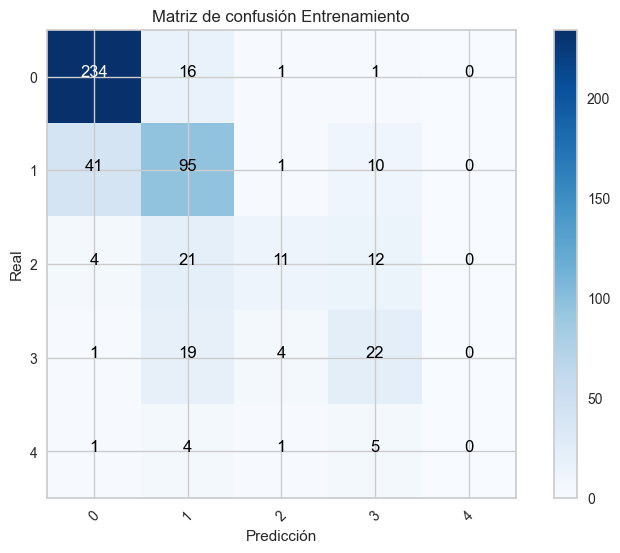

Reporte Prueba
              precision    recall  f1-score   support

           0       0.78      0.83      0.81       108
           1       0.51      0.58      0.54        62
           2       0.33      0.15      0.21        20
           3       0.43      0.47      0.45        19
           4       0.00      0.00      0.00         7

    accuracy                           0.64       216
   macro avg       0.41      0.41      0.40       216
weighted avg       0.61      0.64      0.62       216



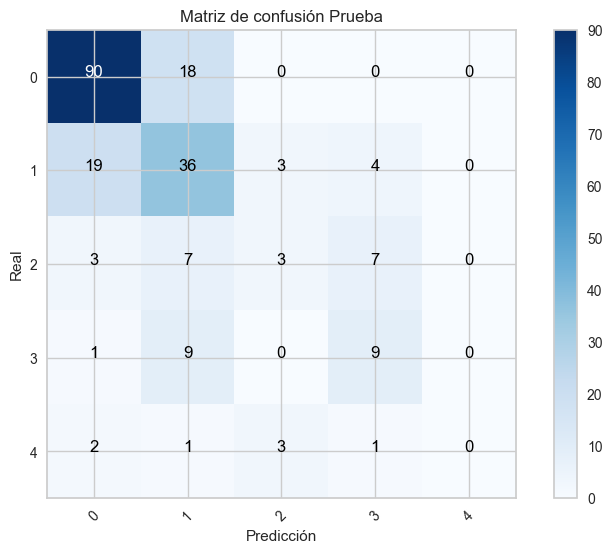

In [243]:
pipeline_dt = make_pipeline(SelectKBest(score_func=f_classif,k=17),
                            DecisionTreeClassifier(random_state=1234,max_depth=9,
                                         max_leaf_nodes=30,
                                         min_samples_leaf=3,
                                         splitter='random'))
report_and_conf_matrix(pipeline_dt,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

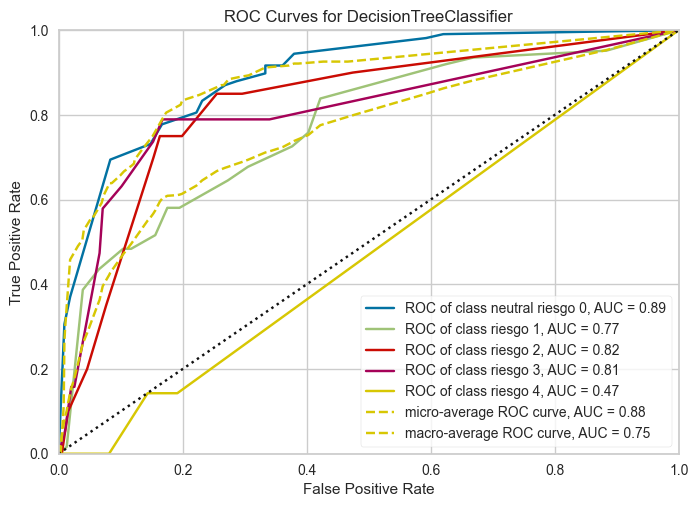

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for DecisionTreeClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=17)),
                                 ('decisiontreeclassifier',
                                  DecisionTreeClassifier(max_depth=9,
                                                         max_leaf_nodes=30,
                                                         min_samples_leaf=3,
                                                         random_state=1234,
                                                         splitter='random'))]))

In [244]:
pipeline_dt = make_pipeline(SelectKBest(score_func=f_classif,k=17),
                            DecisionTreeClassifier(random_state=1234,max_depth=9,
                                         max_leaf_nodes=30,
                                         min_samples_leaf=3,
                                         splitter='random'))
plot_ROC_curve(pipeline_dt,X_train=X_train['rem'], y_train=y_train['rem'], X_test=X_test['rem'], y_test=y_test['rem'])

Modelo con conjunto de datos con PCA

In [245]:
# Tiempo aproximado: 2s

parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11],
           "min_samples_leaf":[1,2,3,4,],
           "max_leaf_nodes":[None,10,20,30] }

tuning_model=GridSearchCV(DecisionTreeClassifier(random_state=1234),
                          param_grid=parameters,scoring=kappa_scorer,
                          cv=3,verbose=3)

tuning_model.fit(X_train['pca_rem'],y_train['pca_rem'])

Fitting 3 folds for each of 192 candidates, totalling 576 fits
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.366 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.324 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.353 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.366 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.324 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.353 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.366 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.324 total time=   0.0s
[CV 3/3] END max_de

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=1234),
             param_grid={'max_depth': [1, 3, 5, 7, 9, 11],
                         'max_leaf_nodes': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 3, 4],
                         'splitter': ['best', 'random']},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [246]:
tuning_model.best_params_

{'max_depth': 11,
 'max_leaf_nodes': None,
 'min_samples_leaf': 4,
 'splitter': 'random'}

In [247]:
# El mejor modelo de árbol de clasificación con PCA


tree_clsfr = DecisionTreeClassifier(random_state=1234,max_depth=11,
                                         max_leaf_nodes=None,
                                         min_samples_leaf=4,
                                         splitter='random')

model,metrics = classification_metrics(tree_clsfr,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/DecissionTreeClassifierPCARem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/DecisionTreeClassifierPCARemMetrics.pkl','wb'))

Training Accuracy = 0.7698412698412699
Test Accuracy = 0.6203703703703703
Training Kappa = 0.6295315282204663
Test Kappa = 0.40475870412689885
Training Precision = [0.85 0.73 0.54 0.59 0.  ]
Test Precision = [0.78 0.57 0.19 0.36 0.  ]
Training recall = [0.95 0.73 0.46 0.43 0.  ]
Test recall = [0.82 0.56 0.25 0.26 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.85      0.95      0.90       252
           1       0.73      0.73      0.73       147
           2       0.54      0.46      0.49        48
           3       0.59      0.43      0.50        46
           4       0.00      0.00      0.00        11

    accuracy                           0.77       504
   macro avg       0.54      0.51      0.52       504
weighted avg       0.74      0.77      0.75       504



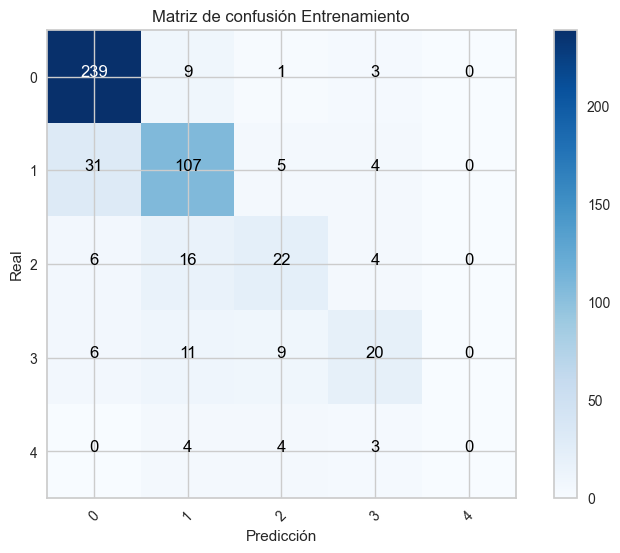

Reporte Prueba
              precision    recall  f1-score   support

           0       0.78      0.82      0.80       108
           1       0.57      0.56      0.57        62
           2       0.19      0.25      0.21        20
           3       0.36      0.26      0.30        19
           4       0.00      0.00      0.00         7

    accuracy                           0.62       216
   macro avg       0.38      0.38      0.38       216
weighted avg       0.60      0.62      0.61       216



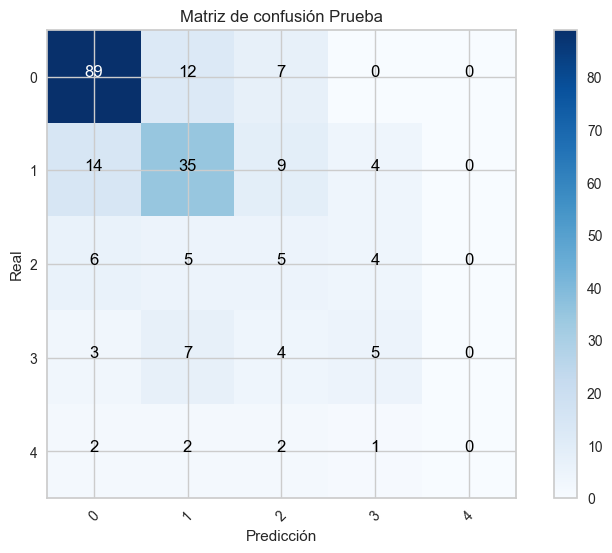

In [248]:
report_and_conf_matrix(DecisionTreeClassifier(random_state=1234,max_depth=11,
                                         max_leaf_nodes=None,
                                         min_samples_leaf=4,
                                         splitter='random'),
                       X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

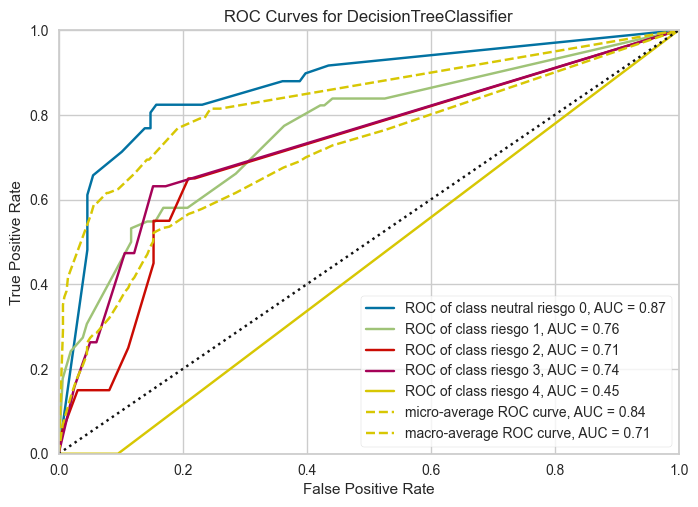

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for DecisionTreeClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=DecisionTreeClassifier(max_depth=11, min_samples_leaf=4,
                                        random_state=1234, splitter='random'))

In [249]:
plot_ROC_curve(DecisionTreeClassifier(random_state=1234,max_depth=11,
                                         max_leaf_nodes=None,
                                         min_samples_leaf=4,
                                         splitter='random'),
                X_train=X_train['pca_rem'], y_train=y_train['pca_rem'],X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

Modelo con conjunto de datos con PCA y feature selection

In [250]:
# Tiempo aproximado: 2s

parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11],
           "min_samples_leaf":[1,2,3,4,],
           "max_leaf_nodes":[None,10,20,30] }

X_t = SelectKBest(score_func=f_classif,k=25).fit_transform(X_train['pca_rem'],y_train['pca_rem'])

tuning_model=GridSearchCV(DecisionTreeClassifier(random_state=1234),param_grid=parameters,scoring=kappa_scorer,
                          cv=3,verbose=3)

tuning_model.fit(X_t,y_train['pca_rem'])

Fitting 3 folds for each of 192 candidates, totalling 576 fits
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.366 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.324 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.353 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.366 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.324 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.353 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.366 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.324 total time=   0.0s
[CV 3/3] END max_de

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=1234),
             param_grid={'max_depth': [1, 3, 5, 7, 9, 11],
                         'max_leaf_nodes': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 3, 4],
                         'splitter': ['best', 'random']},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [251]:
tuning_model.best_params_

{'max_depth': 7,
 'max_leaf_nodes': None,
 'min_samples_leaf': 2,
 'splitter': 'random'}

In [252]:
# El mejor modelo de árbol de regresión con PCA
# Con feature selection

pipeline_dt = make_pipeline(SelectKBest(score_func=f_classif,k=25),
                            DecisionTreeClassifier(random_state=1234,max_depth=7,
                                         max_leaf_nodes=None,
                                         min_samples_leaf=2,
                                         splitter='random'))

model,metrics = classification_metrics(pipeline_dt,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/DecissionTreeClassifierPCARemFS.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/DecisionTreeClassifierPCARemFSMetrics.pkl','wb'))

Training Accuracy = 0.7559523809523809
Test Accuracy = 0.6342592592592593
Training Kappa = 0.6024905258703055
Test Kappa = 0.41144414168937327
Training Precision = [0.83 0.68 0.53 0.68 0.  ]
Test Precision = [0.8  0.53 0.14 0.16 0.  ]
Training recall = [0.97 0.65 0.4  0.5  0.  ]
Test recall = [0.87 0.63 0.05 0.16 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.83      0.97      0.89       252
           1       0.68      0.65      0.66       147
           2       0.53      0.40      0.45        48
           3       0.68      0.50      0.57        46
           4       0.00      0.00      0.00        11

    accuracy                           0.76       504
   macro avg       0.54      0.50      0.52       504
weighted avg       0.72      0.76      0.74       504



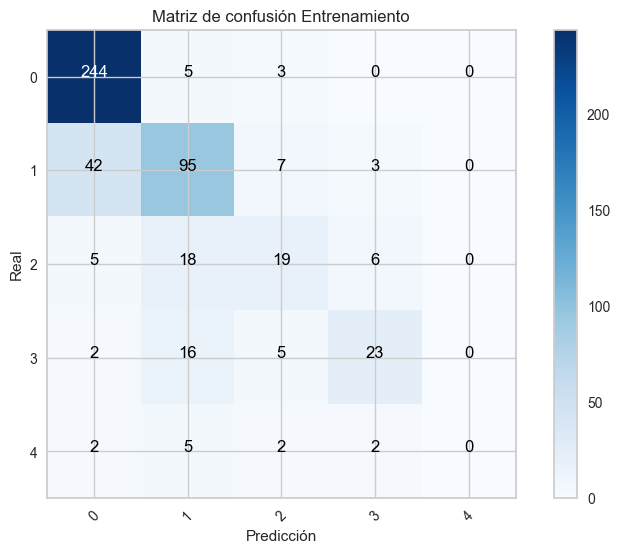

Reporte Prueba
              precision    recall  f1-score   support

           0       0.80      0.87      0.84       108
           1       0.53      0.63      0.58        62
           2       0.14      0.05      0.07        20
           3       0.16      0.16      0.16        19
           4       0.00      0.00      0.00         7

    accuracy                           0.63       216
   macro avg       0.33      0.34      0.33       216
weighted avg       0.58      0.63      0.60       216



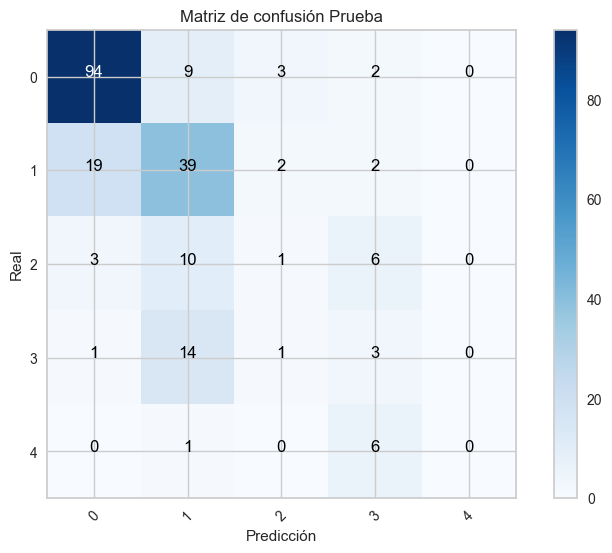

In [253]:
pipeline_dt = make_pipeline(SelectKBest(score_func=f_classif,k=25),
                            DecisionTreeClassifier(random_state=1234,max_depth=7,
                                         max_leaf_nodes=None,
                                         min_samples_leaf=2,
                                         splitter='random'))
report_and_conf_matrix(pipeline_dt,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

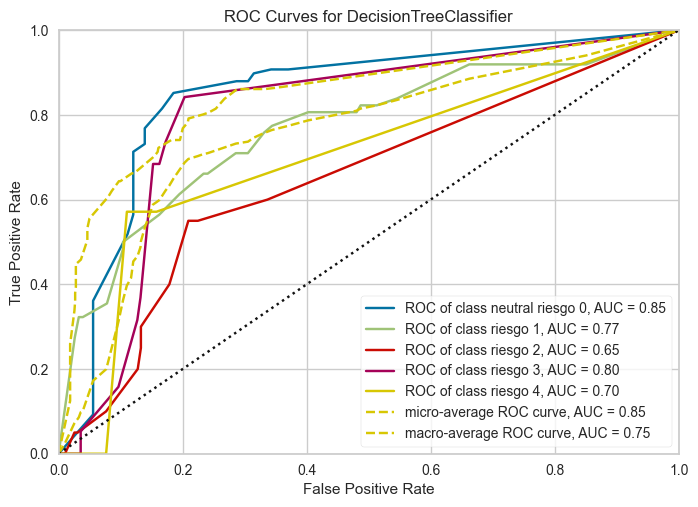

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for DecisionTreeClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=25)),
                                 ('decisiontreeclassifier',
                                  DecisionTreeClassifier(max_depth=7,
                                                         min_samples_leaf=2,
                                                         random_state=1234,
                                                         splitter='random'))]))

In [254]:
pipeline_dt = make_pipeline(SelectKBest(score_func=f_classif,k=25),
                            DecisionTreeClassifier(random_state=1234,max_depth=7,
                                         max_leaf_nodes=None,
                                         min_samples_leaf=2,
                                         splitter='random'))
plot_ROC_curve(pipeline_dt,X_train=X_train['pca_rem'], y_train=y_train['pca_rem'], X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

### 7.6. Modelo de Random Forest

Conjunto de datos sin PCA

In [255]:

from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state=1234)

classification_metrics(rf,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

rf.fit(X_train['rem'],y_train['rem'])
print(rf.get_params())

Training Accuracy = 1.0
Test Accuracy = 0.6203703703703703
Training Kappa = 1.0
Test Kappa = 0.3973255299601892
Training Precision = [1. 1. 1. 1. 1.]
Test Precision = [0.8  0.53 0.19 0.15 0.  ]
Training recall = [1. 1. 1. 1. 1.]
Test recall = [0.82 0.65 0.15 0.11 0.  ]
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 1234, 'verbose': 0, 'warm_start': False}


In [256]:
# Tiempo aproximado: 44s

params = {'max_depth': [None, 10, 20],
          'min_samples_leaf': [1, 2, 3],
          'min_samples_split': [2, 5],
          'n_estimators': [100, 200, 400]}

tuning_model=GridSearchCV(RandomForestClassifier(random_state=1234),param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)

tuning_model.fit(X_train['rem'],y_train['rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.364 total time=   0.0s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.322 total time=   0.0s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.466 total time=   0.0s
[CV 4/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.444 total time=   0.0s
[CV 5/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.482 total time=   0.0s
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.389 total time=   0.0s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.348 total time=   0.0s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.4

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=1234),
             param_grid={'max_depth': [None, 10, 20],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 5],
                         'n_estimators': [100, 200, 400]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [257]:
tuning_model.best_params_

{'max_depth': 10,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 100}

In [258]:
# El mejor modelo de Random Forest
# Sin PCA


rf_clsfr = RandomForestClassifier(random_state=1234,max_depth=10,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         n_estimators=100)

model,metrics = classification_metrics(rf_clsfr,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/RandomForestClassifierRem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/RandomForestClassifierRemMetrics.pkl','wb'))

Training Accuracy = 0.9722222222222222
Test Accuracy = 0.6435185185185185
Training Kappa = 0.9567403192976432
Test Kappa = 0.42620575450217346
Training Precision = [0.95 0.99 1.   1.   1.  ]
Test Precision = [0.81 0.54 0.18 0.19 0.  ]
Training recall = [1.   0.92 0.98 1.   1.  ]
Test recall = [0.89 0.61 0.1  0.16 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.95      1.00      0.97       252
           1       0.99      0.92      0.95       147
           2       1.00      0.98      0.99        48
           3       1.00      1.00      1.00        46
           4       1.00      1.00      1.00        11

    accuracy                           0.97       504
   macro avg       0.99      0.98      0.98       504
weighted avg       0.97      0.97      0.97       504



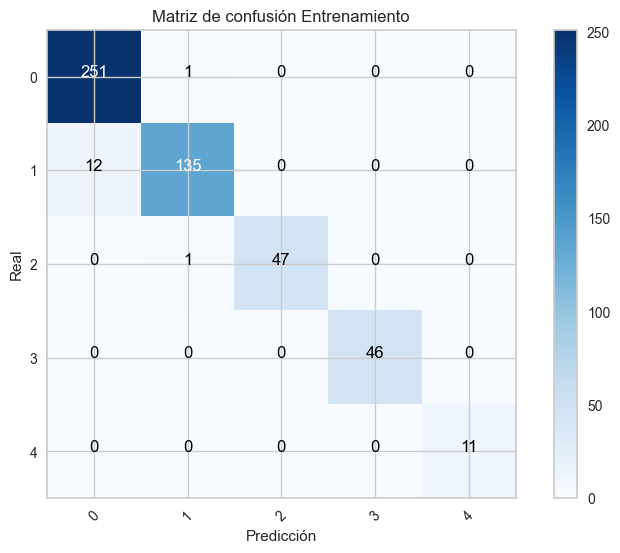

Reporte Prueba
              precision    recall  f1-score   support

           0       0.81      0.89      0.85       108
           1       0.54      0.61      0.57        62
           2       0.18      0.10      0.13        20
           3       0.19      0.16      0.17        19
           4       0.00      0.00      0.00         7

    accuracy                           0.64       216
   macro avg       0.34      0.35      0.34       216
weighted avg       0.59      0.64      0.62       216



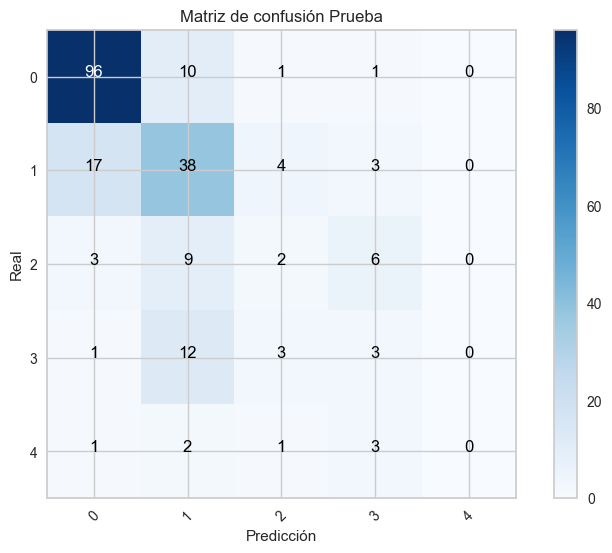

In [259]:
report_and_conf_matrix(RandomForestClassifier(random_state=1234,max_depth=10,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         n_estimators=100),
                       X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

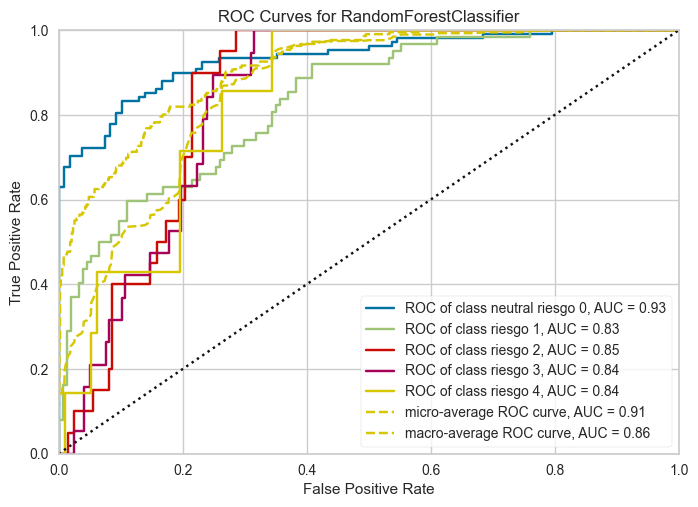

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=RandomForestClassifier(max_depth=10, random_state=1234))

In [260]:
plot_ROC_curve(RandomForestClassifier(random_state=1234,max_depth=10,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         n_estimators=100),
                X_train=X_train['rem'], y_train=y_train['rem'],X_test=X_test['rem'], y_test=y_test['rem'])

Modelo sin PCA pero con feature selection

In [261]:
# Tiempo aproximado: 47s

params = {'max_depth': [None, 10, 20],
          'min_samples_leaf': [1, 2, 3],
          'min_samples_split': [2, 5],
          'n_estimators': [100, 200, 400]}

X_t = SelectKBest(score_func=f_classif,k=17).fit_transform(X_train['rem'],y_train['rem'])

tuning_model=GridSearchCV(RandomForestClassifier(random_state=1234),param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)

tuning_model.fit(X_t,y_train['rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.344 total time=   0.0s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.364 total time=   0.0s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.418 total time=   0.0s
[CV 4/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.377 total time=   0.0s
[CV 5/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.395 total time=   0.0s
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.330 total time=   0.0s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.364 total time=   0.0s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.4

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=1234),
             param_grid={'max_depth': [None, 10, 20],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 5],
                         'n_estimators': [100, 200, 400]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [262]:
tuning_model.best_params_

{'max_depth': 10,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 200}

In [263]:
# El mejor modelo de random forest sin PCA
# Con feature selection

rf_clsfr = RandomForestClassifier(random_state=1234,max_depth=10,
                                         min_samples_leaf=2,
                                         min_samples_split=2,
                                         n_estimators=200)

X_t = SelectKBest(score_func=f_classif,k=17).fit_transform(X_train['rem'],y_train['rem'])

model,metrics = classification_metrics(rf_clsfr,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/RandomForestClassifierRemFS.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/RandomForestClassifierRemFSMetrics.pkl','wb'))

Training Accuracy = 0.875
Test Accuracy = 0.6388888888888888
Training Kappa = 0.8006992348588036
Test Kappa = 0.42368475063282485
Training Precision = [0.88 0.83 0.95 0.93 1.  ]
Test Precision = [0.84 0.49 0.27 0.2  0.  ]
Training recall = [0.97 0.8  0.79 0.85 0.18]
Test recall = [0.83 0.69 0.15 0.11 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.90      0.98      0.94       252
           1       0.88      0.84      0.86       147
           2       0.91      0.85      0.88        48
           3       0.95      0.83      0.88        46
           4       1.00      0.55      0.71        11

    accuracy                           0.90       504
   macro avg       0.93      0.81      0.85       504
weighted avg       0.90      0.90      0.90       504



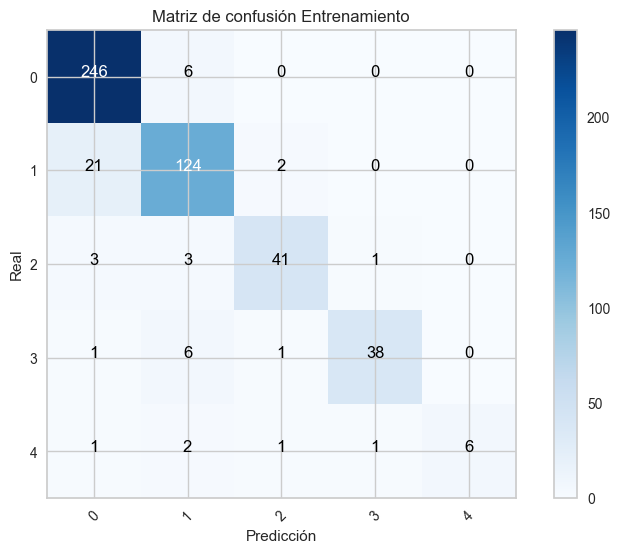

Reporte Prueba
              precision    recall  f1-score   support

           0       0.84      0.83      0.84       108
           1       0.50      0.66      0.57        62
           2       0.35      0.30      0.32        20
           3       0.50      0.26      0.34        19
           4       0.00      0.00      0.00         7

    accuracy                           0.66       216
   macro avg       0.44      0.41      0.42       216
weighted avg       0.64      0.66      0.64       216



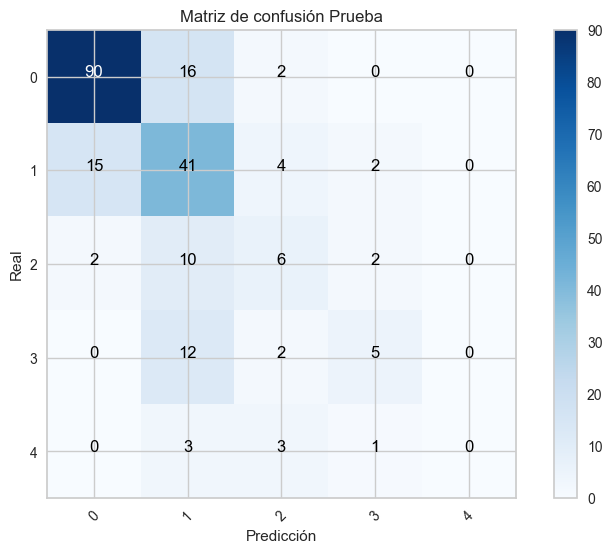

In [264]:
pipeline_rf = make_pipeline(SelectKBest(score_func=f_classif,k=17),
                          RandomForestClassifier(random_state=1234,max_depth=10,
                                         min_samples_leaf=2,
                                         min_samples_split=2,
                                         n_estimators=200))
report_and_conf_matrix(pipeline_rf,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

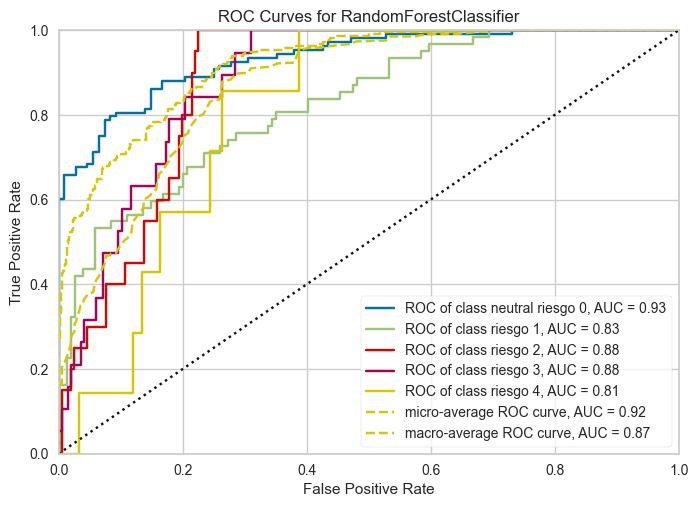

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=17)),
                                 ('randomforestclassifier',
                                  RandomForestClassifier(max_depth=10,
                                                         min_samples_leaf=2,
                                                         n_estimators=200,
                                                         random_state=1234))]))

In [265]:
pipeline_rf = make_pipeline(SelectKBest(score_func=f_classif,k=17),
                          RandomForestClassifier(random_state=1234,max_depth=10,
                                         min_samples_leaf=2,
                                         min_samples_split=2,
                                         n_estimators=200))
plot_ROC_curve(pipeline_rf,X_train=X_train['rem'], y_train=y_train['rem'], X_test=X_test['rem'], y_test=y_test['rem'])

Modelo con conjunto de datos con PCA

In [266]:
# Tiempo aproximado: 50s

params = {'max_depth': [None, 10, 20],
          'min_samples_leaf': [1, 2, 3],
          'min_samples_split': [2, 5],
          'n_estimators': [100, 200, 400]}

tuning_model=GridSearchCV(RandomForestClassifier(random_state=1234),param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)

tuning_model.fit(X_train['pca_rem'],y_train['pca_rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.336 total time=   0.0s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.354 total time=   0.0s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.398 total time=   0.0s
[CV 4/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.393 total time=   0.0s
[CV 5/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.399 total time=   0.0s
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.359 total time=   0.1s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.355 total time=   0.0s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.4

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=1234),
             param_grid={'max_depth': [None, 10, 20],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 5],
                         'n_estimators': [100, 200, 400]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [267]:
tuning_model.best_params_

{'max_depth': 10,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 200}

In [268]:
# El mejor modelo de Random Forest
# Con PCA


rf_clsfr = RandomForestClassifier(random_state=1234,max_depth=10,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         n_estimators=200)

model,metrics = classification_metrics(rf_clsfr,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/RandomForestClassifierPCARem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/RandomForestClassifierPCARemMetrics.pkl','wb'))

Training Accuracy = 0.9761904761904762
Test Accuracy = 0.6388888888888888
Training Kappa = 0.9629665915548153
Test Kappa = 0.4169838743165617
Training Precision = [0.96 0.99 1.   1.   1.  ]
Test Precision = [0.81 0.51 0.23 0.25 0.  ]
Training recall = [1.   0.93 1.   1.   1.  ]
Test recall = [0.88 0.6  0.15 0.16 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.96      1.00      0.98       252
           1       0.99      0.93      0.96       147
           2       1.00      1.00      1.00        48
           3       1.00      1.00      1.00        46
           4       1.00      1.00      1.00        11

    accuracy                           0.98       504
   macro avg       0.99      0.98      0.99       504
weighted avg       0.98      0.98      0.98       504



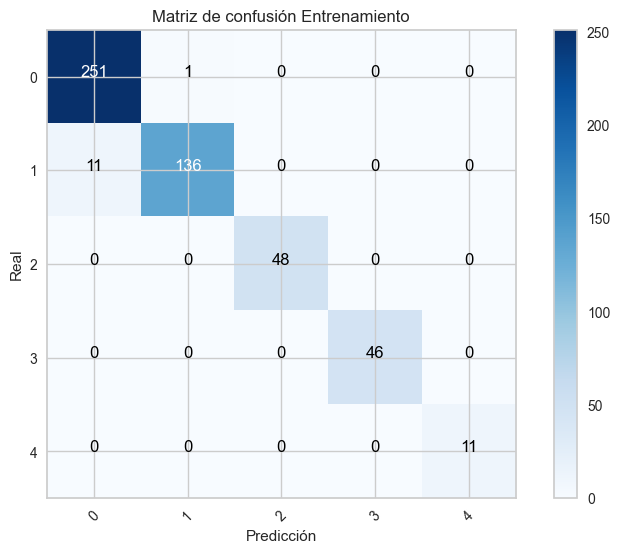

Reporte Prueba
              precision    recall  f1-score   support

           0       0.81      0.88      0.84       108
           1       0.51      0.60      0.55        62
           2       0.23      0.15      0.18        20
           3       0.25      0.16      0.19        19
           4       0.00      0.00      0.00         7

    accuracy                           0.64       216
   macro avg       0.36      0.36      0.35       216
weighted avg       0.59      0.64      0.61       216



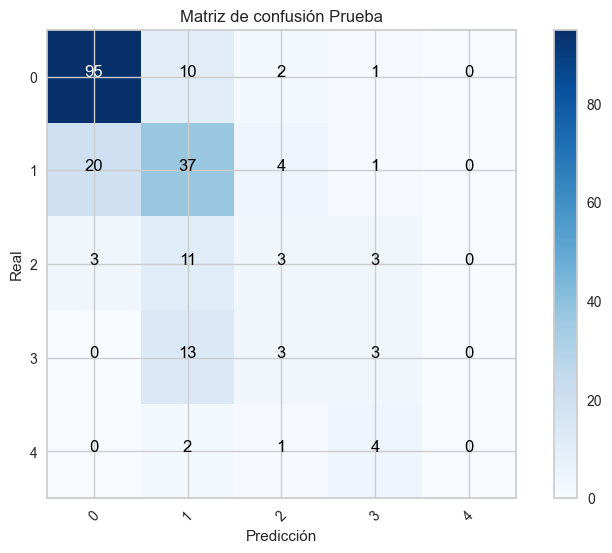

In [269]:
report_and_conf_matrix(RandomForestClassifier(random_state=1234,max_depth=10,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         n_estimators=200),
                       X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

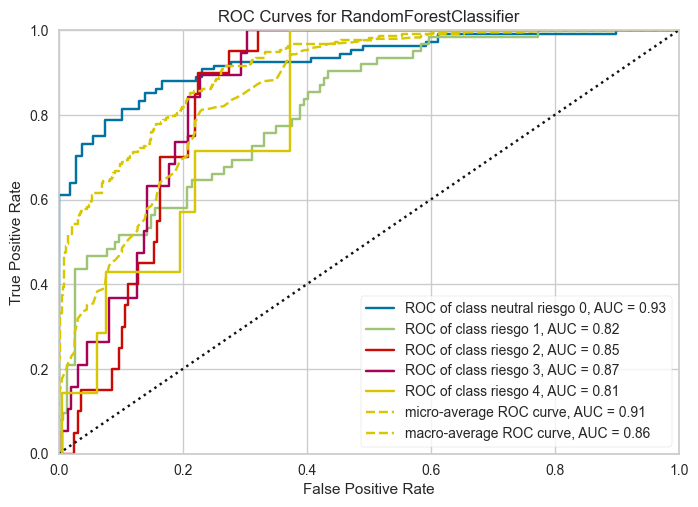

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=RandomForestClassifier(max_depth=10, n_estimators=200,
                                        random_state=1234))

In [270]:
plot_ROC_curve(RandomForestClassifier(random_state=1234,max_depth=10,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         n_estimators=200),
                X_train=X_train['pca_rem'], y_train=y_train['pca_rem'],X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

Modelo con PCA y feature selection

In [271]:
# Tiempo aproximado: 53s

params = {'max_depth': [None, 10, 20],
          'min_samples_leaf': [1, 2, 3],
          'min_samples_split': [2, 5],
          'n_estimators': [100, 200, 400]}

X_t = SelectKBest(score_func=f_classif,k=25).fit_transform(X_train['pca_rem'],y_train['pca_rem'])

tuning_model=GridSearchCV(RandomForestClassifier(random_state=1234),param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)

tuning_model.fit(X_t,y_train['pca_rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.411 total time=   0.0s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.320 total time=   0.0s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.440 total time=   0.0s
[CV 4/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.433 total time=   0.0s
[CV 5/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.435 total time=   0.0s
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.410 total time=   0.0s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.372 total time=   0.0s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.4

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=1234),
             param_grid={'max_depth': [None, 10, 20],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 5],
                         'n_estimators': [100, 200, 400]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [272]:
tuning_model.best_params_

{'max_depth': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 200}

In [273]:
# El mejor modelo de random forest con PCA
# Con feature selection

rf_clsfr = RandomForestClassifier(random_state=1234,max_depth=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         n_estimators=200)

X_t = SelectKBest(score_func=f_classif,k=25).fit_transform(X_train['pca_rem'],y_train['pca_rem'])

model,metrics = classification_metrics(rf_clsfr,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/RandomForestClassifierPCARemFS.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/RandomForestClassifierPCARemFSMetrics.pkl','wb'))

Training Accuracy = 1.0
Test Accuracy = 0.6342592592592593
Training Kappa = 1.0
Test Kappa = 0.41318477251624885
Training Precision = [1. 1. 1. 1. 1.]
Test Precision = [0.8  0.51 0.3  0.24 0.  ]
Training recall = [1. 1. 1. 1. 1.]
Test recall = [0.86 0.6  0.15 0.21 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       252
           1       1.00      1.00      1.00       147
           2       1.00      1.00      1.00        48
           3       1.00      1.00      1.00        46
           4       1.00      1.00      1.00        11

    accuracy                           1.00       504
   macro avg       1.00      1.00      1.00       504
weighted avg       1.00      1.00      1.00       504



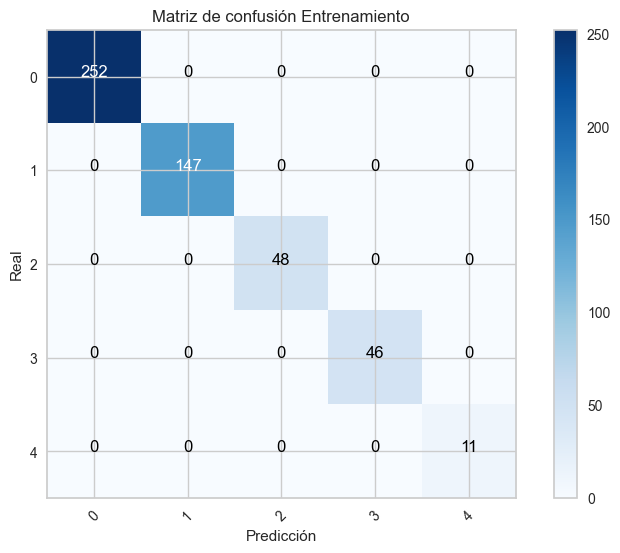

Reporte Prueba
              precision    recall  f1-score   support

           0       0.84      0.88      0.86       108
           1       0.55      0.66      0.60        62
           2       0.23      0.15      0.18        20
           3       0.25      0.21      0.23        19
           4       0.00      0.00      0.00         7

    accuracy                           0.66       216
   macro avg       0.38      0.38      0.37       216
weighted avg       0.62      0.66      0.64       216



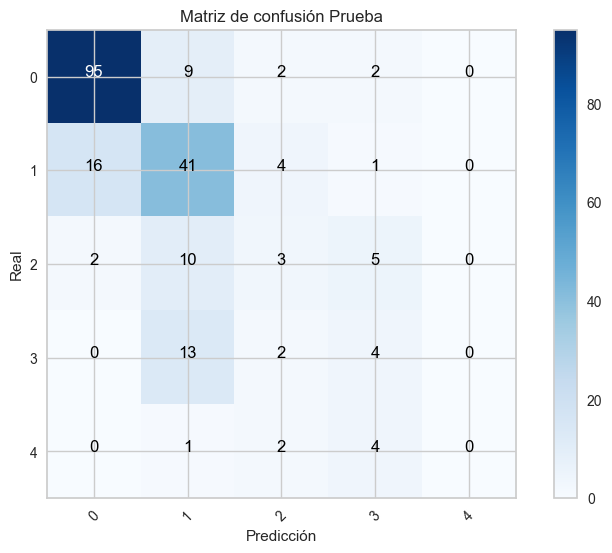

In [274]:
pipeline_rf = make_pipeline(SelectKBest(score_func=f_classif,k=25),
                          RandomForestClassifier(random_state=1234,max_depth=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         n_estimators=200))
report_and_conf_matrix(pipeline_rf,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

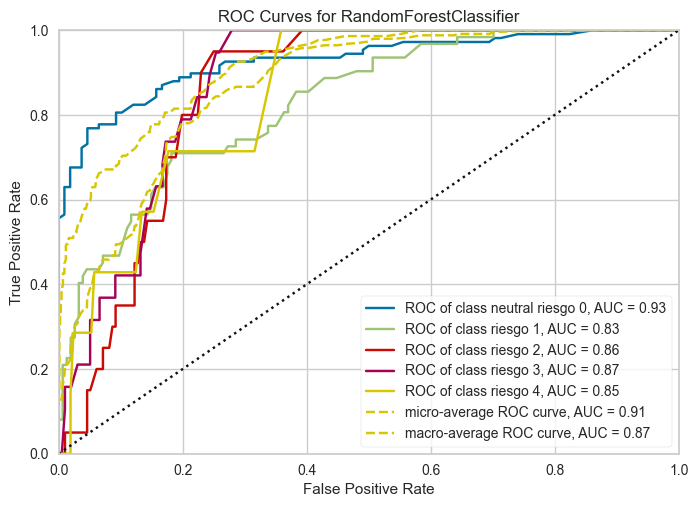

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=25)),
                                 ('randomforestclassifier',
                                  RandomForestClassifier(n_estimators=200,
                                                         random_state=1234))]))

In [275]:
# el K inicialmente estaba en 31 en la primera linea pero asumo que debería ser 27 que es el num de features para este modelo.
pipeline_rf = make_pipeline(SelectKBest(score_func=f_classif,k=25),
                          RandomForestClassifier(random_state=1234,max_depth=None,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         n_estimators=200))
plot_ROC_curve(pipeline_rf,X_train=X_train['pca_rem'], y_train=y_train['pca_rem'], X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

### 7.7. Modelo de Gradient Boosting

Modelo con datos sin PCA

In [58]:

from sklearn.ensemble import GradientBoostingClassifier

gb = GradientBoostingClassifier(random_state=1234)

classification_metrics(gb,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

gb.fit(X_train['rem'],y_train['rem'])
print(gb.get_params())

Training Accuracy = 0.9603174603174603
Test Accuracy = 0.6342592592592593
Training Kappa = 0.9382103056383096
Test Kappa = 0.44050624610642974
Training Precision = [0.96124031 0.93197279 1.         1.         1.        ]
Test Precision = [0.88       0.53424658 0.30769231 0.125      0.        ]
Training recall = [0.98412698 0.93197279 0.91666667 0.95652174 1.        ]
Test recall = [0.81481481 0.62903226 0.4        0.10526316 0.        ]
{'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': 1234, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}


In [61]:
#Tiempo aproximado: 7.45m
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, cohen_kappa_score

kappa_scorer = make_scorer(cohen_kappa_score)



params = {'learning_rate': [0.01,0.03],
                  'subsample'    : [0.5, 0.2],
                  'n_estimators' : [500,1000],
                  'max_depth'    : [4,6,8]    
            }

tuning_model=GridSearchCV(GradientBoostingClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_train['rem'],y_train['rem'])

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.381 total time=   1.8s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.356 total time=   1.6s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.491 total time=   1.7s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.409 total time=   1.6s
[CV 5/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.482 total time=   1.6s
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.426 total time=   1.2s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.342 total time=   1.2s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.515 total time=   1.3s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_es

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=1234),
             param_grid={'learning_rate': [0.01, 0.03], 'max_depth': [4, 6, 8],
                         'n_estimators': [500, 1000], 'subsample': [0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [62]:
tuning_model.best_params_

{'learning_rate': 0.01, 'max_depth': 8, 'n_estimators': 500, 'subsample': 0.2}

In [64]:
# El mejor modelo de Gradient Boosting
# Sin PCA
import pickle 

gb_clsfr = GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=8, n_estimators=500,subsample=0.2)

model,metrics = classification_metrics(gb_clsfr,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/GradientBoostingClassifierRem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/GradientBoostingClassifierRemMetrics.pkl','wb'))

Training Accuracy = 0.9563492063492064
Test Accuracy = 0.6296296296296297
Training Kappa = 0.9318525438521014
Test Kappa = 0.4086444680195749
Training Precision = [0.95437262 0.95035461 0.97826087 0.95348837 1.        ]
Test Precision = [0.81981982 0.5        0.33333333 0.07692308 0.        ]
Training recall = [0.99603175 0.91156463 0.9375     0.89130435 1.        ]
Test recall = [0.84259259 0.64516129 0.2        0.05263158 0.        ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.95      1.00      0.97       252
           1       0.95      0.91      0.93       147
           2       0.98      0.94      0.96        48
           3       0.95      0.89      0.92        46
           4       1.00      1.00      1.00        11

    accuracy                           0.96       504
   macro avg       0.97      0.95      0.96       504
weighted avg       0.96      0.96      0.96       504



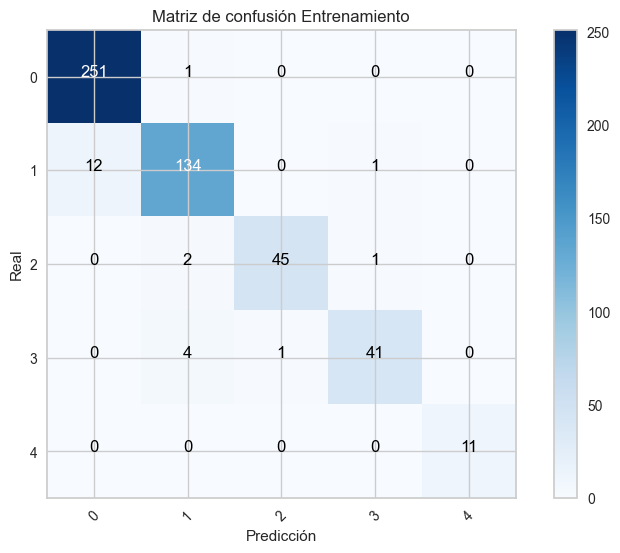

Reporte Prueba
              precision    recall  f1-score   support

           0       0.82      0.84      0.83       108
           1       0.50      0.65      0.56        62
           2       0.33      0.20      0.25        20
           3       0.08      0.05      0.06        19
           4       0.00      0.00      0.00         7

    accuracy                           0.63       216
   macro avg       0.35      0.35      0.34       216
weighted avg       0.59      0.63      0.61       216



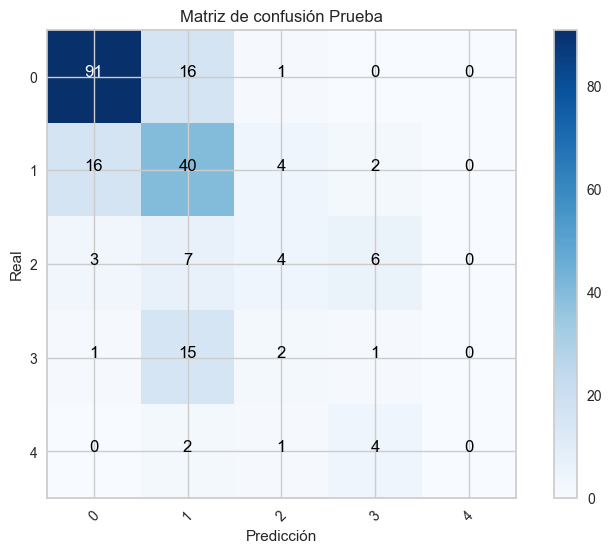

In [65]:
report_and_conf_matrix(GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=8, n_estimators=500,subsample=0.2),
                       X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

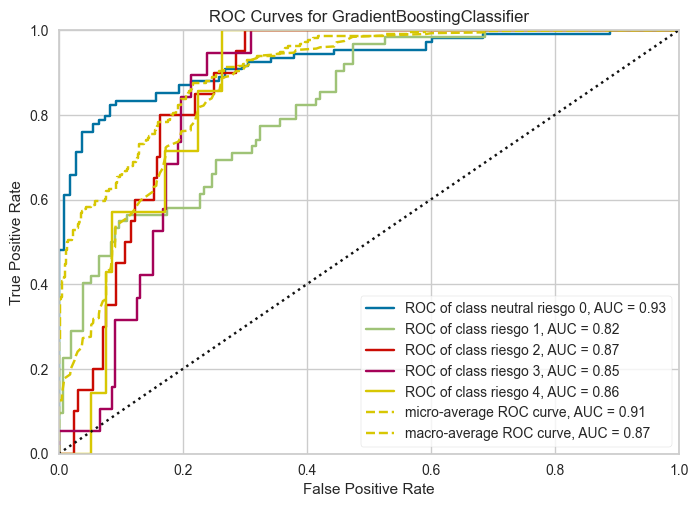

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for GradientBoostingClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=GradientBoostingClassifier(learning_rate=0.01, max_depth=8,
                                            n_estimators=500, random_state=1234,
                                            subsample=0.2))

In [66]:
plot_ROC_curve(GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=8, n_estimators=500,subsample=0.2),
                X_train=X_train['rem'], y_train=y_train['rem'],X_test=X_test['rem'], y_test=y_test['rem'])

Conjunto de datos sin PCA y con feature selection

In [85]:
#Tiempo aproximado: 8.3m

params = {'learning_rate': [0.01,0.03],
                  'subsample'    : [0.5, 0.2],
                  'n_estimators' : [500,1000],
                  'max_depth'    : [4,6,8]    
            }

X_t = SelectKBest(score_func=f_classif,k=17).fit_transform(X_train['rem'],y_train['rem'])

tuning_model=GridSearchCV(GradientBoostingClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_t,y_train['rem'])

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.425 total time=   1.5s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.356 total time=   1.5s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.455 total time=   1.5s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.457 total time=   1.5s
[CV 5/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.498 total time=   1.5s
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.362 total time=   1.2s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.344 total time=   1.2s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.494 total time=   1.1s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_es

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=1234),
             param_grid={'learning_rate': [0.01, 0.03], 'max_depth': [4, 6, 8],
                         'n_estimators': [500, 1000], 'subsample': [0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [86]:
tuning_model.best_params_

{'learning_rate': 0.01, 'max_depth': 6, 'n_estimators': 1000, 'subsample': 0.2}

In [87]:
# El mejor modelo de Gradient Boosting sin PCA
# Con feature selection


pipeline_gb = make_pipeline(SelectKBest(score_func=f_classif,k=17),
                           GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=6, n_estimators=1000,subsample=0.2))

model,metrics = classification_metrics(pipeline_gb,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/GradientBoostingClassifierRemFS.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/GradientBoostingClassifierRemFSMetrics.pkl','wb'))

Training Accuracy = 0.996031746031746
Test Accuracy = 0.6296296296296297
Training Kappa = 0.9938594995004751
Test Kappa = 0.4120449132357945
Training Precision = [1.   0.99 1.   1.   1.  ]
Test Precision = [0.82 0.49 0.28 0.3  0.  ]
Training recall = [1.   0.99 1.   0.98 1.  ]
Test recall = [0.83 0.61 0.25 0.16 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       252
           1       0.99      0.99      0.99       147
           2       1.00      1.00      1.00        48
           3       1.00      0.98      0.99        46
           4       1.00      1.00      1.00        11

    accuracy                           1.00       504
   macro avg       1.00      0.99      1.00       504
weighted avg       1.00      1.00      1.00       504



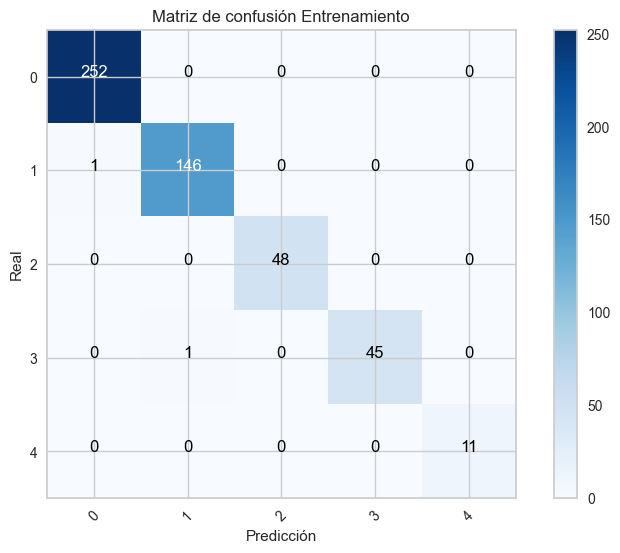

Reporte Prueba
              precision    recall  f1-score   support

           0       0.82      0.83      0.83       108
           1       0.49      0.61      0.54        62
           2       0.28      0.25      0.26        20
           3       0.30      0.16      0.21        19
           4       0.00      0.00      0.00         7

    accuracy                           0.63       216
   macro avg       0.38      0.37      0.37       216
weighted avg       0.60      0.63      0.61       216



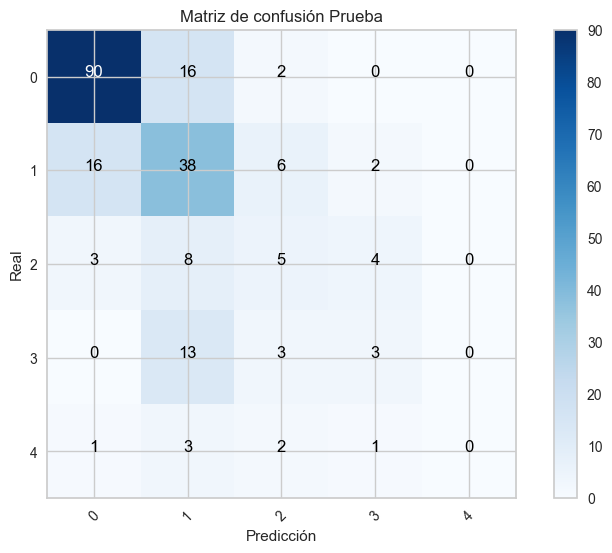

In [88]:
pipeline_gb = make_pipeline(SelectKBest(score_func=f_classif,k=17),
                           GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=6, n_estimators=1000,subsample=0.2))
report_and_conf_matrix(pipeline_gb,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

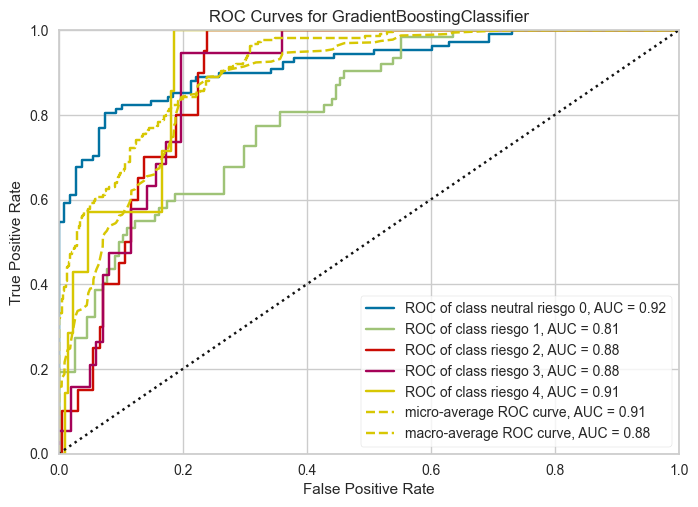

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for GradientBoostingClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=17)),
                                 ('gradientboostingclassifier',
                                  GradientBoostingClassifier(learning_rate=0.01,
                                                             max_depth=6,
                                                             n_estimators=1000,
                                                             random_state=1234,
                                                             subsample=0.2))]))

In [89]:
pipeline_gb = make_pipeline(SelectKBest(score_func=f_classif,k=17),
                           GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=6, n_estimators=1000,subsample=0.2))
plot_ROC_curve(pipeline_gb,X_train=X_train['rem'], y_train=y_train['rem'], X_test=X_test['rem'], y_test=y_test['rem'])

Modelo con PCA

In [90]:
#Tiempo aproximado: 9m

params = {'learning_rate': [0.01,0.03],
                  'subsample'    : [0.5, 0.2],
                  'n_estimators' : [500,1000],
                  'max_depth'    : [4,6,8]    
            }

tuning_model=GridSearchCV(GradientBoostingClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_train['pca_rem'],y_train['pca_rem'])

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.424 total time=   1.8s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.304 total time=   1.8s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.444 total time=   1.8s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.456 total time=   1.8s
[CV 5/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.508 total time=   1.8s
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.379 total time=   1.3s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.331 total time=   1.3s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.387 total time=   1.3s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_es

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=1234),
             param_grid={'learning_rate': [0.01, 0.03], 'max_depth': [4, 6, 8],
                         'n_estimators': [500, 1000], 'subsample': [0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [91]:
tuning_model.best_params_

{'learning_rate': 0.03, 'max_depth': 8, 'n_estimators': 500, 'subsample': 0.5}

In [92]:
# El mejor modelo de Gradient Boosting
# Con PCA
 

gb_clsfr = GradientBoostingClassifier(random_state=1234,learning_rate=0.03, 
                                      max_depth=8, n_estimators=500,subsample=0.5)

model,metrics = classification_metrics(gb_clsfr,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/GradientBoostingClassifierPCARem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/GradientBoostingClassifierPCARemMetrics.pkl','wb'))

Training Accuracy = 1.0
Test Accuracy = 0.6620370370370371
Training Kappa = 1.0
Test Kappa = 0.457697069748246
Training Precision = [1. 1. 1. 1. 1.]
Test Precision = [0.82 0.53 0.38 0.3  0.  ]
Training recall = [1. 1. 1. 1. 1.]
Test recall = [0.87 0.65 0.3  0.16 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       252
           1       1.00      1.00      1.00       147
           2       1.00      1.00      1.00        48
           3       1.00      1.00      1.00        46
           4       1.00      1.00      1.00        11

    accuracy                           1.00       504
   macro avg       1.00      1.00      1.00       504
weighted avg       1.00      1.00      1.00       504



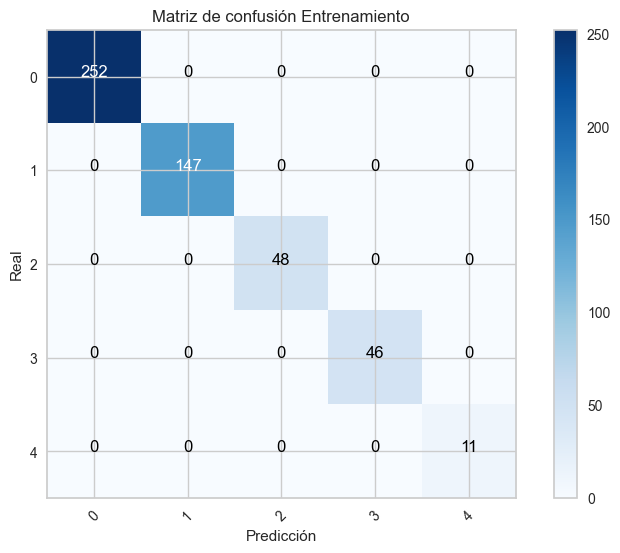

Reporte Prueba
              precision    recall  f1-score   support

           0       0.82      0.87      0.84       108
           1       0.53      0.65      0.58        62
           2       0.38      0.30      0.33        20
           3       0.30      0.16      0.21        19
           4       0.00      0.00      0.00         7

    accuracy                           0.66       216
   macro avg       0.41      0.39      0.39       216
weighted avg       0.62      0.66      0.64       216



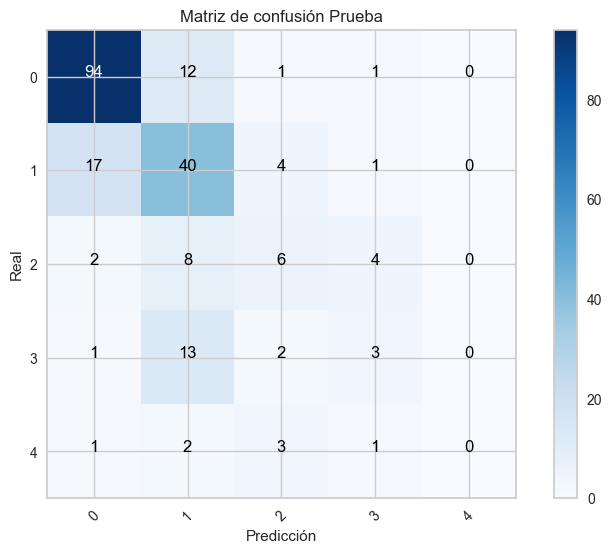

In [93]:
report_and_conf_matrix(GradientBoostingClassifier(random_state=1234,learning_rate=0.03, 
                                      max_depth=8, n_estimators=500,subsample=0.5),
                       X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

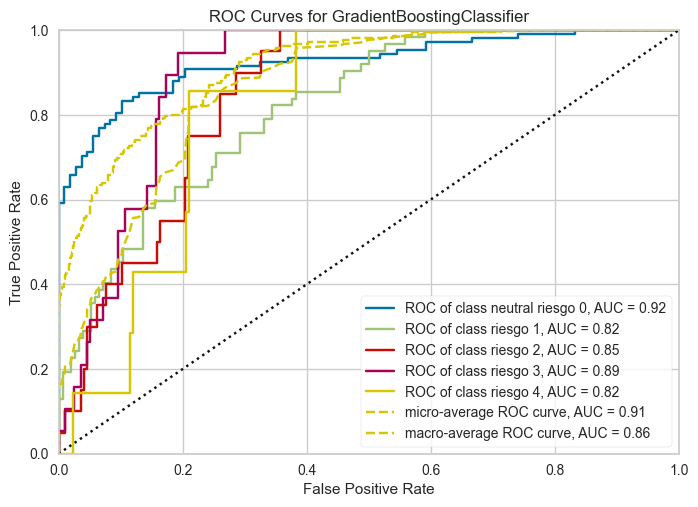

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for GradientBoostingClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=GradientBoostingClassifier(learning_rate=0.03, max_depth=8,
                                            n_estimators=500, random_state=1234,
                                            subsample=0.5))

In [94]:
plot_ROC_curve(GradientBoostingClassifier(random_state=1234,learning_rate=0.03, 
                                      max_depth=8, n_estimators=500,subsample=0.5),
                X_train=X_train['pca_rem'], y_train=y_train['pca_rem'],X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

Modelo con PCA y feature selection

In [95]:
#Tiempo aproximado: 8.3m

params = {'learning_rate': [0.01,0.03],
                  'subsample'    : [0.5, 0.2],
                  'n_estimators' : [500,1000],
                  'max_depth'    : [4,6,8]    
            }

X_t = SelectKBest(score_func=f_classif,k=25).fit_transform(X_train['pca_rem'],y_train['pca_rem'])

tuning_model=GridSearchCV(GradientBoostingClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_t,y_train['pca_rem'])

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.400 total time=   1.6s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.356 total time=   1.7s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.366 total time=   1.6s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.455 total time=   1.7s
[CV 5/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.508 total time=   1.7s
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.373 total time=   1.2s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.376 total time=   1.2s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.347 total time=   1.2s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_es

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=1234),
             param_grid={'learning_rate': [0.01, 0.03], 'max_depth': [4, 6, 8],
                         'n_estimators': [500, 1000], 'subsample': [0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [96]:
tuning_model.best_params_

{'learning_rate': 0.03, 'max_depth': 8, 'n_estimators': 1000, 'subsample': 0.2}

In [97]:
# El mejor modelo de Gradient Boosting
# Con PCA y feature selection
 
X_t = SelectKBest(score_func=f_classif,k=25).fit_transform(X_train['pca_rem'],y_train['pca_rem'])

gb_clsfr = GradientBoostingClassifier(random_state=1234,learning_rate=0.03, 
                                      max_depth=8, n_estimators=1000,subsample=0.2)

model,metrics = classification_metrics(gb_clsfr,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/GradientBoostingClassifierPCARemFS.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/GradientBoostingClassifierPCARemFSMetrics.pkl','wb'))

Training Accuracy = 1.0
Test Accuracy = 0.6388888888888888
Training Kappa = 1.0
Test Kappa = 0.42065265981224853
Training Precision = [1. 1. 1. 1. 1.]
Test Precision = [0.83 0.48 0.21 0.27 0.  ]
Training recall = [1. 1. 1. 1. 1.]
Test recall = [0.88 0.6  0.15 0.16 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       252
           1       1.00      1.00      1.00       147
           2       1.00      1.00      1.00        48
           3       1.00      1.00      1.00        46
           4       1.00      1.00      1.00        11

    accuracy                           1.00       504
   macro avg       1.00      1.00      1.00       504
weighted avg       1.00      1.00      1.00       504



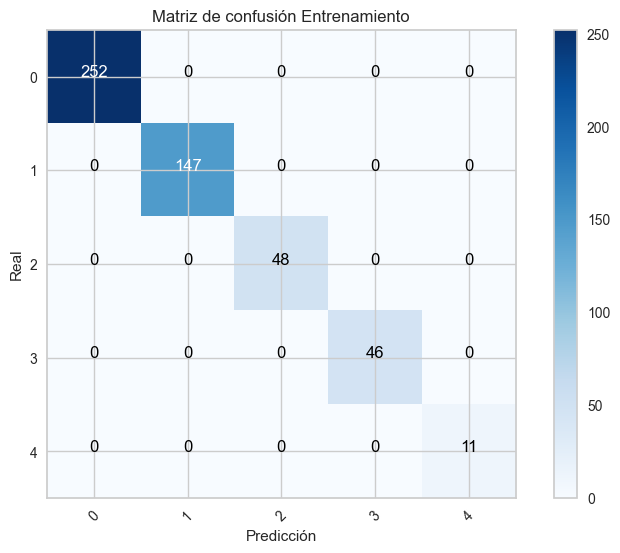

Reporte Prueba
              precision    recall  f1-score   support

           0       0.84      0.85      0.84       108
           1       0.48      0.65      0.55        62
           2       0.21      0.15      0.18        20
           3       0.38      0.16      0.22        19
           4       0.00      0.00      0.00         7

    accuracy                           0.64       216
   macro avg       0.38      0.36      0.36       216
weighted avg       0.61      0.64      0.62       216



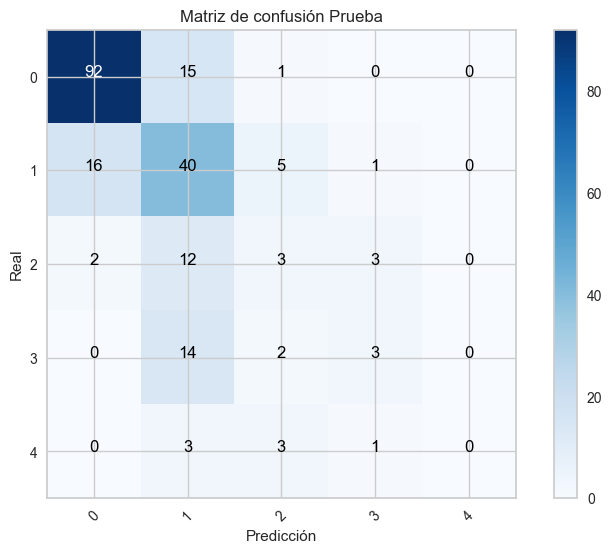

In [98]:
pipeline_gb = make_pipeline(SelectKBest(score_func=f_classif,k=25),
                           GradientBoostingClassifier(random_state=1234,learning_rate=0.03, 
                                      max_depth=8, n_estimators=1000,subsample=0.2))
report_and_conf_matrix(pipeline_gb,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

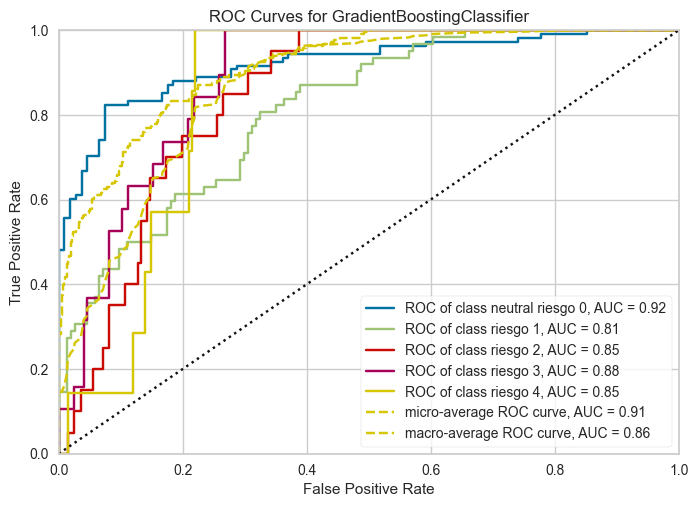

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for GradientBoostingClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1', '2': 'riesgo 2',
                '3': 'riesgo 3', '4': 'riesgo 4'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=25)),
                                 ('gradientboostingclassifier',
                                  GradientBoostingClassifier(learning_rate=0.03,
                                                             max_depth=8,
                                                             n_estimators=1000,
                                                             random_state=1234,
                                                             subsample=0.2))]))

In [99]:
pipeline_gb = make_pipeline(SelectKBest(score_func=f_classif,k=25),
                           GradientBoostingClassifier(random_state=1234,learning_rate=0.03, 
                                      max_depth=8, n_estimators=1000,subsample=0.2))
plot_ROC_curve(pipeline_gb,X_train=X_train['pca_rem'], y_train=y_train['pca_rem'],X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

### 7.8. Modelo de XGBoost

In [100]:
y_train['rem']['target'].unique()

array(['1', '0', '3', '2', '4'], dtype=object)

Conjunto de datos sin PCA

In [101]:
# Tiempo aproximado: 3.4m

import xgboost as xgb

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_train['rem'] = le.fit_transform(y_train['rem'])
y_test['rem'] = le.transform(y_test['rem'])

params = {'learning_rate': [0.03,0.3],
                  'subsample'    : [1, 0.5, 0.2],
                  'n_estimators' : [100,500,1000],
                  'max_depth'    : [None,5,7]    
            }

tuning_model=GridSearchCV(xgb.XGBClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_train['rem'],y_train['rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.417 total time=   0.2s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.388 total time=   0.1s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.553 total time=   0.1s
[CV 4/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.443 total time=   0.1s
[CV 5/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.417 total time=   0.1s
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.413 total time=   0.1s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.337 total time=   0.1s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.496 total time=   0.1s
[CV 4/5] END learning_rate=0.03, max

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=1234, ...),
             param_grid={'learning_rate': [0.03, 0.3],
                         'max_depth': [None, 5, 7],
                         'n_estimators': [100, 500, 1000],
                         'subsample': [1, 0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [102]:
tuning_model.best_params_

{'learning_rate': 0.03, 'max_depth': 5, 'n_estimators': 500, 'subsample': 0.2}

In [103]:
xgb_clsfr = xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=5,
                               n_estimators=500,
                               subsample=0.2)

model,metrics = classification_metrics(xgb_clsfr,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/XGBoostClassifierRem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/XGBoostClassifierRemMetrics.pkl','wb'))

Training Accuracy = 0.9087301587301587
Test Accuracy = 0.6759259259259259
Training Kappa = 0.8563052398011677
Test Kappa = 0.5026152176058423
Training Precision = [0.93 0.88 0.89 0.88 1.  ]
Test Precision = [0.88 0.6  0.32 0.29 0.  ]
Training recall = [0.98 0.88 0.85 0.78 0.36]
Test recall = [0.82 0.71 0.4  0.26 0.  ]


In [107]:
def plot_ROC_curve_xgb(model, X_train, y_train, X_test, y_test):
    visualizer = ROCAUC(model, encoder={0: 'neutral riesgo 0',
                                        1: 'riesgo 1', 
                                        2: 'riesgo 2', 
                                        3: 'riesgo 3',
                                        4: 'riesgo 4'})                                    
    visualizer.fit(X_train, y_train)
    visualizer.score(X_test, y_test)
    visualizer.show()
    
    return visualizer

In [108]:
tuning_model.best_params_

{'learning_rate': 0.03, 'max_depth': 5, 'n_estimators': 500, 'subsample': 0.2}

Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.93      0.98      0.96       252
           1       0.88      0.88      0.88       147
           2       0.89      0.85      0.87        48
           3       0.88      0.78      0.83        46
           4       1.00      0.36      0.53        11

    accuracy                           0.91       504
   macro avg       0.92      0.77      0.81       504
weighted avg       0.91      0.91      0.91       504



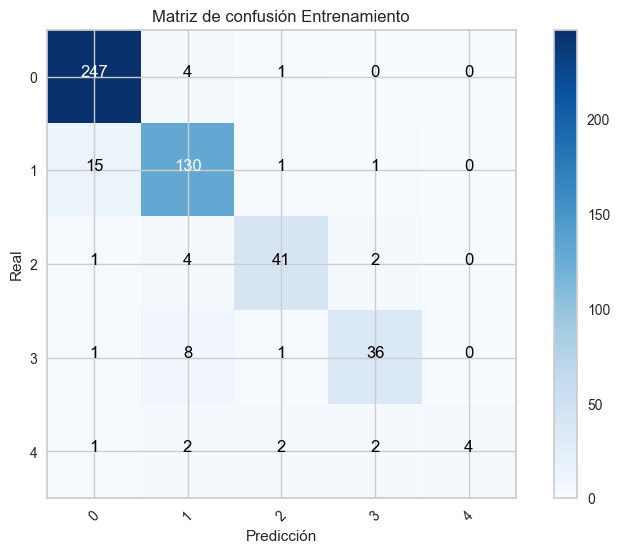

Reporte Prueba
              precision    recall  f1-score   support

           0       0.88      0.82      0.85       108
           1       0.60      0.71      0.65        62
           2       0.32      0.40      0.36        20
           3       0.29      0.26      0.28        19
           4       0.00      0.00      0.00         7

    accuracy                           0.68       216
   macro avg       0.42      0.44      0.43       216
weighted avg       0.67      0.68      0.67       216



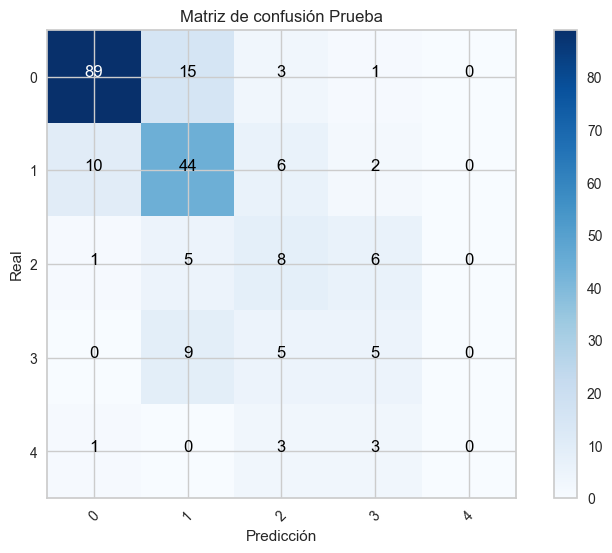

In [109]:
report_and_conf_matrix(xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=5,
                               n_estimators=500,
                               subsample=0.2),
                       X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

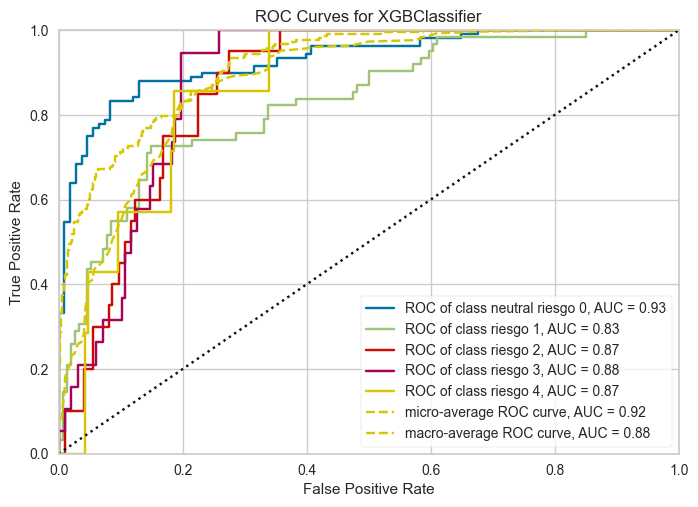

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for XGBClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={0: 'neutral riesgo 0', 1: 'riesgo 1', 2: 'riesgo 2',
                3: 'riesgo 3', 4: 'riesgo 4'},
       estimator=XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopp...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.03,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=5, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=500, n_jobs=None,
                               num_parallel_tree=None,
                               objective='multi:softprob', ...))

In [111]:
plot_ROC_curve_xgb(xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=5,
                               n_estimators=500,
                               subsample=0.2),
                X_train=X_train['rem'], y_train=y_train['rem'],X_test=X_test['rem'], y_test=y_test['rem'])

Conjunto de datos sin PCA y feature selection

In [112]:
# Tiempo aproximado: 3.3m

le = LabelEncoder()
y_train['rem'] = le.fit_transform(y_train['rem'])
y_test['rem'] = le.transform(y_test['rem'])

params = {'learning_rate': [0.03,0.3],
                  'subsample'    : [1, 0.5, 0.2],
                  'n_estimators' : [100,500,1000],
                  'max_depth'    : [None,5,7]    
            }

X_t = SelectKBest(score_func=f_classif,k=17).fit_transform(X_train['rem'],y_train['rem'])

tuning_model=GridSearchCV(xgb.XGBClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_t,y_train['rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.397 total time=   0.2s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.417 total time=   0.1s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.466 total time=   0.1s
[CV 4/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.444 total time=   0.1s
[CV 5/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.350 total time=   0.1s
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.407 total time=   0.1s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.360 total time=   0.1s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.520 total time=   0.1s
[CV 4/5] END learning_rate=0.03, max

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=1234, ...),
             param_grid={'learning_rate': [0.03, 0.3],
                         'max_depth': [None, 5, 7],
                         'n_estimators': [100, 500, 1000],
                         'subsample': [1, 0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [113]:
tuning_model.best_params_

{'learning_rate': 0.03,
 'max_depth': None,
 'n_estimators': 500,
 'subsample': 0.2}

In [114]:

pipeline_xgb = make_pipeline(SelectKBest(score_func=f_classif,k=17),
                             xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=None,
                               n_estimators=500,
                               subsample=0.2))

model,metrics = classification_metrics(pipeline_xgb,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/XGBoostClassifierRemFS.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/XGBoostClassifierRemFSMetrics.pkl','wb'))

Training Accuracy = 0.8968253968253969
Test Accuracy = 0.6759259259259259
Training Kappa = 0.8371961560203505
Test Kappa = 0.4992050874403815
Training Precision = [0.93 0.84 0.88 0.9  1.  ]
Test Precision = [0.88 0.56 0.4  0.31 0.  ]
Training recall = [0.98 0.87 0.79 0.76 0.45]
Test recall = [0.81 0.73 0.4  0.26 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.93      0.98      0.95       252
           1       0.84      0.87      0.86       147
           2       0.88      0.79      0.84        48
           3       0.90      0.76      0.82        46
           4       1.00      0.45      0.62        11

    accuracy                           0.90       504
   macro avg       0.91      0.77      0.82       504
weighted avg       0.90      0.90      0.89       504



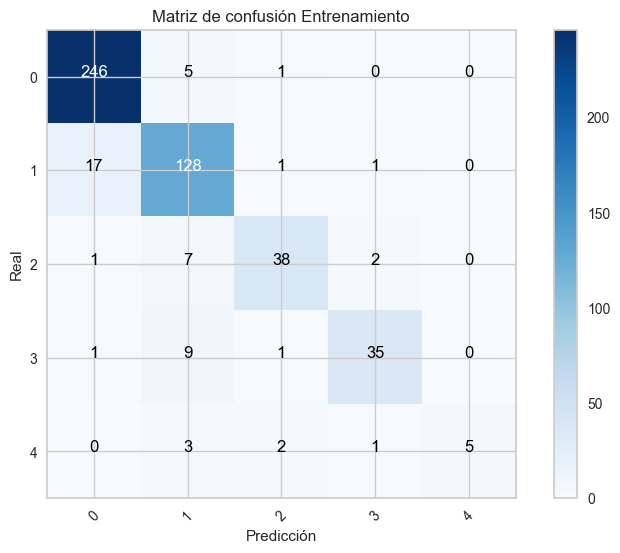

Reporte Prueba
              precision    recall  f1-score   support

           0       0.88      0.81      0.85       108
           1       0.56      0.73      0.63        62
           2       0.40      0.40      0.40        20
           3       0.31      0.26      0.29        19
           4       0.00      0.00      0.00         7

    accuracy                           0.68       216
   macro avg       0.43      0.44      0.43       216
weighted avg       0.67      0.68      0.67       216



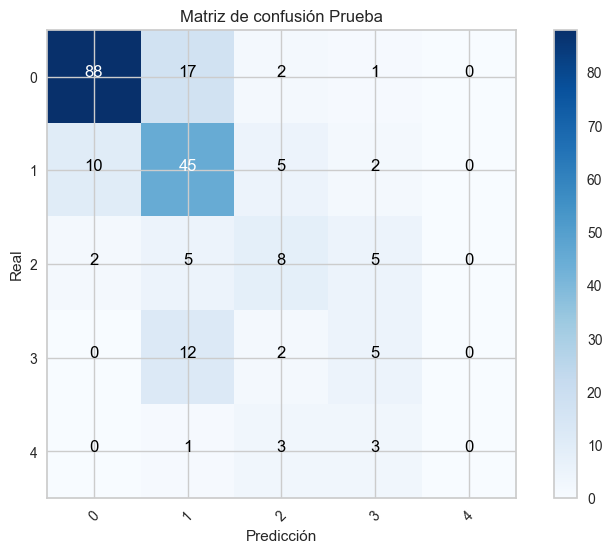

In [115]:
pipeline_xgb = make_pipeline(SelectKBest(score_func=f_classif,k=17),
                             xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=None,
                               n_estimators=500,
                               subsample=0.2))

report_and_conf_matrix(pipeline_xgb,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

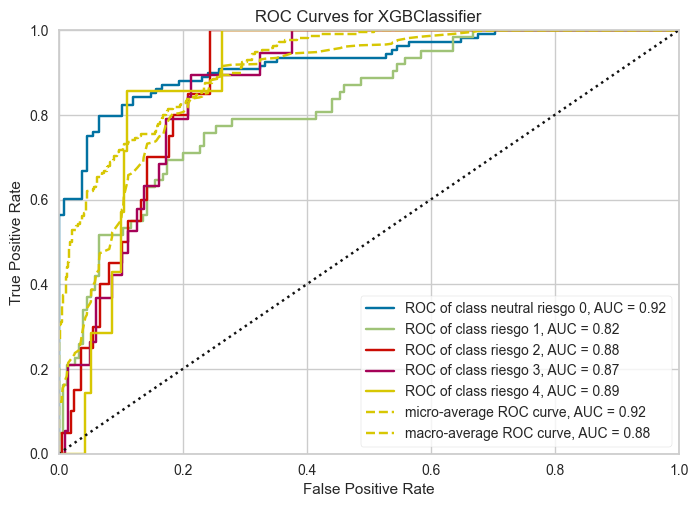

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for XGBClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={0: 'neutral riesgo 0', 1: 'riesgo 1', 2: 'riesgo 2',
                3: 'riesgo 3', 4: 'riesgo 4'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=17)),
                                 ('xgbclassifier',
                                  XGBClassifier(base_score=None, booster=None,
                                                callbacks=None,
                                                colsample_bylevel=None,...
                                                grow_policy=None,
                                                importance_type=None,
                                                interaction_constraints=None,
                                                learning_rate=0.03,
                                                max_bin=None,
                                                max_cat_threshold=None,
                                                max_cat_to_onehot=None,
                                                max_delta_step=None,
                                                max_depth=None, max_leaves=None,
                                                min_child_weight=None,
                                                missing=nan,
                                                monotone_constraints=None,
                                                multi_strategy=None,
                                                n_estimators=500, n_jobs=None,
                                                num_parallel_tree=None,
                                                objective='multi:softprob', ...))]))

In [116]:
pipeline_xgb = make_pipeline(SelectKBest(score_func=f_classif,k=17),
                             xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=None,
                               n_estimators=500,
                               subsample=0.2))

plot_ROC_curve_xgb(pipeline_xgb,X_train=X_train['rem'], y_train=y_train['rem'],X_test=X_test['rem'], y_test=y_test['rem'])

Conjunto de datos con PCA

In [117]:
# Tiempo aproximado: 4.28m

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_train['pca_rem'] = le.fit_transform(y_train['pca_rem'])
y_test['pca_rem'] = le.transform(y_test['pca_rem'])

params = {'learning_rate': [0.03,0.3],
                  'subsample'    : [1, 0.5, 0.2],
                  'n_estimators' : [100,500,1000],
                  'max_depth'    : [None,5,7]    
            }

tuning_model=GridSearchCV(xgb.XGBClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_train['pca_rem'],y_train['pca_rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.457 total time=   0.2s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.409 total time=   0.2s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.401 total time=   0.2s
[CV 4/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.435 total time=   0.2s
[CV 5/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.397 total time=   0.1s
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.435 total time=   0.1s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.321 total time=   0.1s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.365 total time=   0.1s
[CV 4/5] END learning_rate=0.03, max

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=1234, ...),
             param_grid={'learning_rate': [0.03, 0.3],
                         'max_depth': [None, 5, 7],
                         'n_estimators': [100, 500, 1000],
                         'subsample': [1, 0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [118]:
tuning_model.best_params_

{'learning_rate': 0.03, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1}

In [119]:
xgb_clsfr = xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=5,
                               n_estimators=100,
                               subsample=1)

model,metrics = classification_metrics(xgb_clsfr,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/XGBoostClassifierPCARem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/XGBoostClassifierPCARemMetrics.pkl','wb'))

Training Accuracy = 0.9186507936507936
Test Accuracy = 0.6481481481481481
Training Kappa = 0.8713629402756509
Test Kappa = 0.44491783323189293
Training Precision = [0.91 0.92 0.91 1.   1.  ]
Test Precision = [0.85 0.5  0.33 0.3  0.  ]
Training recall = [0.99 0.85 0.83 0.89 0.73]
Test recall = [0.83 0.66 0.3  0.16 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.91      0.99      0.94       252
           1       0.92      0.85      0.88       147
           2       0.91      0.83      0.87        48
           3       1.00      0.89      0.94        46
           4       1.00      0.73      0.84        11

    accuracy                           0.92       504
   macro avg       0.95      0.86      0.90       504
weighted avg       0.92      0.92      0.92       504



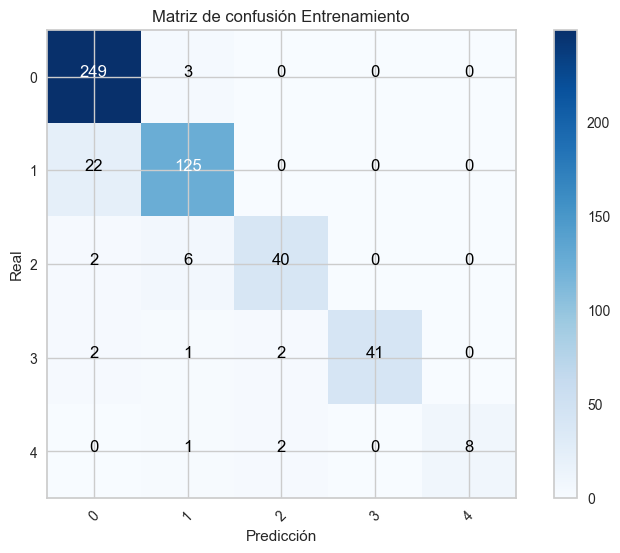

Reporte Prueba
              precision    recall  f1-score   support

           0       0.85      0.83      0.84       108
           1       0.50      0.66      0.57        62
           2       0.33      0.30      0.32        20
           3       0.30      0.16      0.21        19
           4       0.00      0.00      0.00         7

    accuracy                           0.65       216
   macro avg       0.40      0.39      0.39       216
weighted avg       0.63      0.65      0.63       216



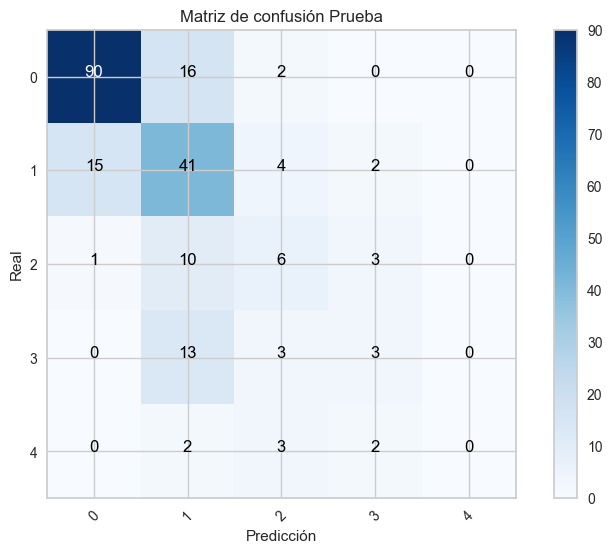

In [120]:
report_and_conf_matrix(xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=5,
                               n_estimators=100,
                               subsample=1),
                       X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

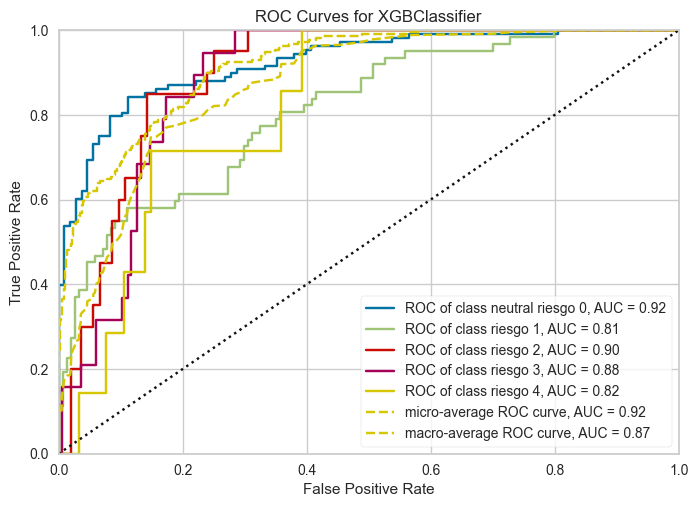

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for XGBClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={0: 'neutral riesgo 0', 1: 'riesgo 1', 2: 'riesgo 2',
                3: 'riesgo 3', 4: 'riesgo 4'},
       estimator=XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopp...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.03,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=5, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=100, n_jobs=None,
                               num_parallel_tree=None,
                               objective='multi:softprob', ...))

In [121]:
plot_ROC_curve_xgb(xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=5,
                               n_estimators=100,
                               subsample=1),
                X_train=X_train['pca_rem'], y_train=y_train['pca_rem'],X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

Conjunto de datos con PCA y feature selection

In [122]:
# Tiempo aproximado: 3.42m

params = {'learning_rate': [0.03,0.3],
                  'subsample'    : [1, 0.5, 0.2],
                  'n_estimators' : [100,500,1000],
                  'max_depth'    : [None,5,7]    
            }

X_t = SelectKBest(score_func=f_classif,k=25).fit_transform(X_train['pca_rem'],y_train['pca_rem'])

tuning_model=GridSearchCV(xgb.XGBClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_t,y_train['pca_rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.420 total time=   0.2s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.337 total time=   0.1s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.349 total time=   0.1s
[CV 4/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.521 total time=   0.1s
[CV 5/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.381 total time=   0.1s
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.443 total time=   0.1s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.358 total time=   0.1s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.341 total time=   0.1s
[CV 4/5] END learning_rate=0.03, max

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=1234, ...),
             param_grid={'learning_rate': [0.03, 0.3],
                         'max_depth': [None, 5, 7],
                         'n_estimators': [100, 500, 1000],
                         'subsample': [1, 0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [123]:
tuning_model.best_params_

{'learning_rate': 0.03, 'max_depth': 7, 'n_estimators': 500, 'subsample': 0.2}

In [124]:
pipeline_xgb = make_pipeline(SelectKBest(score_func=f_classif,k=25),
                             xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=7,
                               n_estimators=500,
                               subsample=0.2))

model,metrics = classification_metrics(pipeline_xgb,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/XGBoostClassifierPCARemFS.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/XGBoostClassifierPCARemFSMetrics.pkl','wb'))

Training Accuracy = 0.9166666666666666
Test Accuracy = 0.6574074074074074
Training Kappa = 0.869485600133178
Test Kappa = 0.4656503861197473
Training Precision = [0.95 0.9  0.84 0.86 1.  ]
Test Precision = [0.86 0.54 0.35 0.23 0.  ]
Training recall = [0.98 0.9  0.88 0.83 0.18]
Test recall = [0.84 0.65 0.4  0.16 0.  ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.95      0.98      0.97       252
           1       0.90      0.90      0.90       147
           2       0.84      0.88      0.86        48
           3       0.86      0.83      0.84        46
           4       1.00      0.18      0.31        11

    accuracy                           0.92       504
   macro avg       0.91      0.75      0.77       504
weighted avg       0.92      0.92      0.91       504



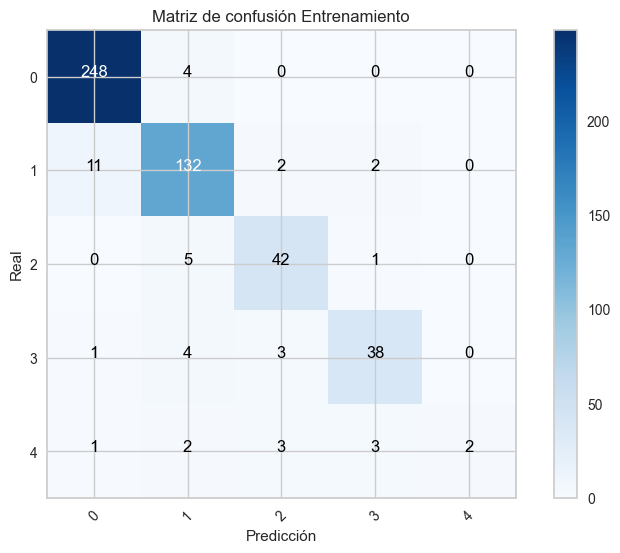

Reporte Prueba
              precision    recall  f1-score   support

           0       0.86      0.84      0.85       108
           1       0.54      0.65      0.59        62
           2       0.35      0.40      0.37        20
           3       0.23      0.16      0.19        19
           4       0.00      0.00      0.00         7

    accuracy                           0.66       216
   macro avg       0.40      0.41      0.40       216
weighted avg       0.64      0.66      0.65       216



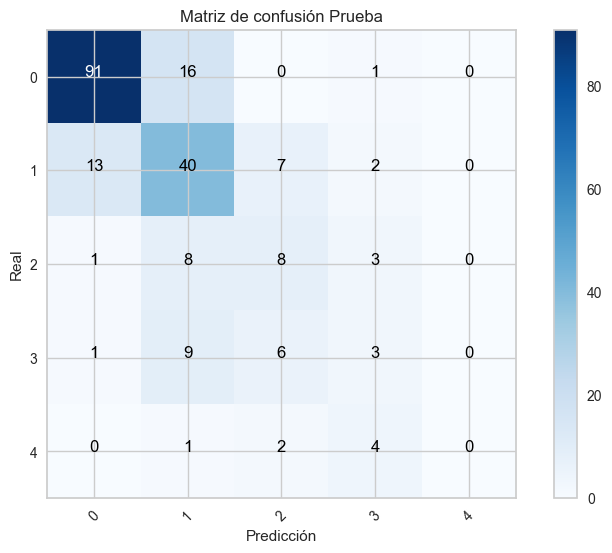

In [125]:
pipeline_xgb = make_pipeline(SelectKBest(score_func=f_classif,k=25),
                             xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=7,
                               n_estimators=500,
                               subsample=0.2))

report_and_conf_matrix(pipeline_xgb,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

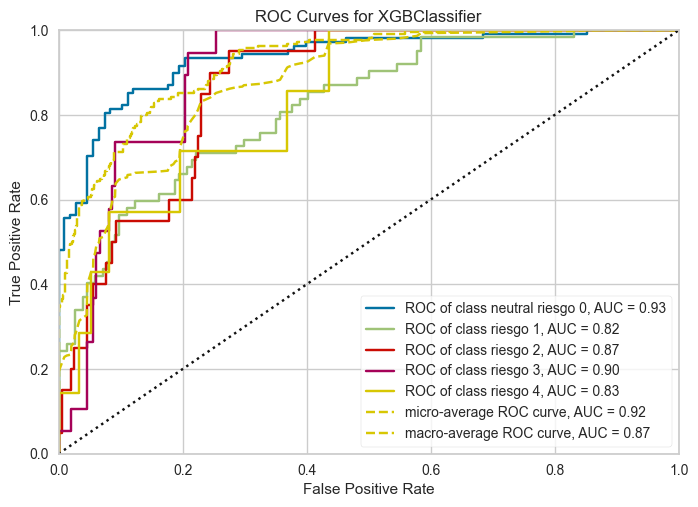

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for XGBClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={0: 'neutral riesgo 0', 1: 'riesgo 1', 2: 'riesgo 2',
                3: 'riesgo 3', 4: 'riesgo 4'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=25)),
                                 ('xgbclassifier',
                                  XGBClassifier(base_score=None, booster=None,
                                                callbacks=None,
                                                colsample_bylevel=None,...
                                                grow_policy=None,
                                                importance_type=None,
                                                interaction_constraints=None,
                                                learning_rate=0.03,
                                                max_bin=None,
                                                max_cat_threshold=None,
                                                max_cat_to_onehot=None,
                                                max_delta_step=None,
                                                max_depth=7, max_leaves=None,
                                                min_child_weight=None,
                                                missing=nan,
                                                monotone_constraints=None,
                                                multi_strategy=None,
                                                n_estimators=500, n_jobs=None,
                                                num_parallel_tree=None,
                                                objective='multi:softprob', ...))]))

In [126]:
pipeline_xgb = make_pipeline(SelectKBest(score_func=f_classif,k=25),
                             xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=7,
                               n_estimators=500,
                               subsample=0.2))

plot_ROC_curve_xgb(pipeline_xgb,X_train=X_train['pca_rem'], y_train=y_train['pca_rem'],X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

### 8. Comparación de los distintos modelos

Cargamos las métricas de los modelos previamente guardados 

In [127]:
metrics = list()
names = list()
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/logisticRegressionRemMetrics.pkl','rb')))
names.append('logisticRegressionRemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/logisticRegressionRemFSMetrics.pkl','rb')))
names.append('logisticRegressionRemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/logisticRegressionPCARemMetrics.pkl','rb')))
names.append('logisticRegressionPCARemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/logisticRegressionPCARemFSMetrics.pkl','rb')))
names.append('logisticRegressionPCARemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/KnnClassifierRemMetrics.pkl','rb')))
names.append('KnnClassifierRemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/KnnClassifierPCARemMetrics.pkl','rb')))
names.append('KnnClassifiePCARemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/NBClassifierRemMetrics.pkl','rb')))
names.append('NBClassifierRemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/NBClassifierRemFSMetrics.pkl','rb')))
names.append('NBClassifierRemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/NBClassifierPCARemMetrics.pkl','rb')))
names.append('NBClassifierPCARemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/NBClassifierPCARemFSMetrics.pkl','rb')))
names.append('NBClassifierPCARemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/DecisionTreeClassifierRemMetrics.pkl','rb')))
names.append('DecisionTreeClassifierRemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/DecisionTreeClassifierRemFSMetrics.pkl','rb')))
names.append('DecisionTreeClassifierRemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/DecisionTreeClassifierPCARemMetrics.pkl','rb')))
names.append('DecisionTreeClassifierPCARemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/DecisionTreeClassifierPCARemFSMetrics.pkl','rb')))
names.append('DecisionTreeClassifierPCARemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/RandomForestClassifierRemMetrics.pkl','rb')))
names.append('RandomForestClassifierRemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/RandomForestClassifierRemFSMetrics.pkl','rb')))
names.append('RandomForestClassifierRemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/RandomForestClassifierPCARemMetrics.pkl','rb')))
names.append('RandomForestClassifierPCARemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/RandomForestClassifierPCARemFSMetrics.pkl','rb')))
names.append('RandomForestClassifierPCARemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/GradientBoostingClassifierRemMetrics.pkl','rb')))
names.append('GradientBoostingClassifierRemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/GradientBoostingClassifierRemFSMetrics.pkl','rb')))
names.append('GradientBoostingClassifierRemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/GradientBoostingClassifierPCARemMetrics.pkl','rb')))
names.append('GradientBoostingClassifierPCARemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/GradientBoostingClassifierPCARemFSMetrics.pkl','rb')))
names.append('GradientBoostingClassifierPCARemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/XGBoostClassifierRemMetrics.pkl','rb')))
names.append('XGBoostClassifierRemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/XGBoostClassifierRemFSMetrics.pkl','rb')))
names.append('XGBoostClassifierRemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/XGBoostClassifierPCARemMetrics.pkl','rb')))
names.append('XGBoostClassifierPCARemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/XGBoostClassifierPCARemFSMetrics.pkl','rb')))
names.append('XGBoostClassifierPCARemFSMetrics')

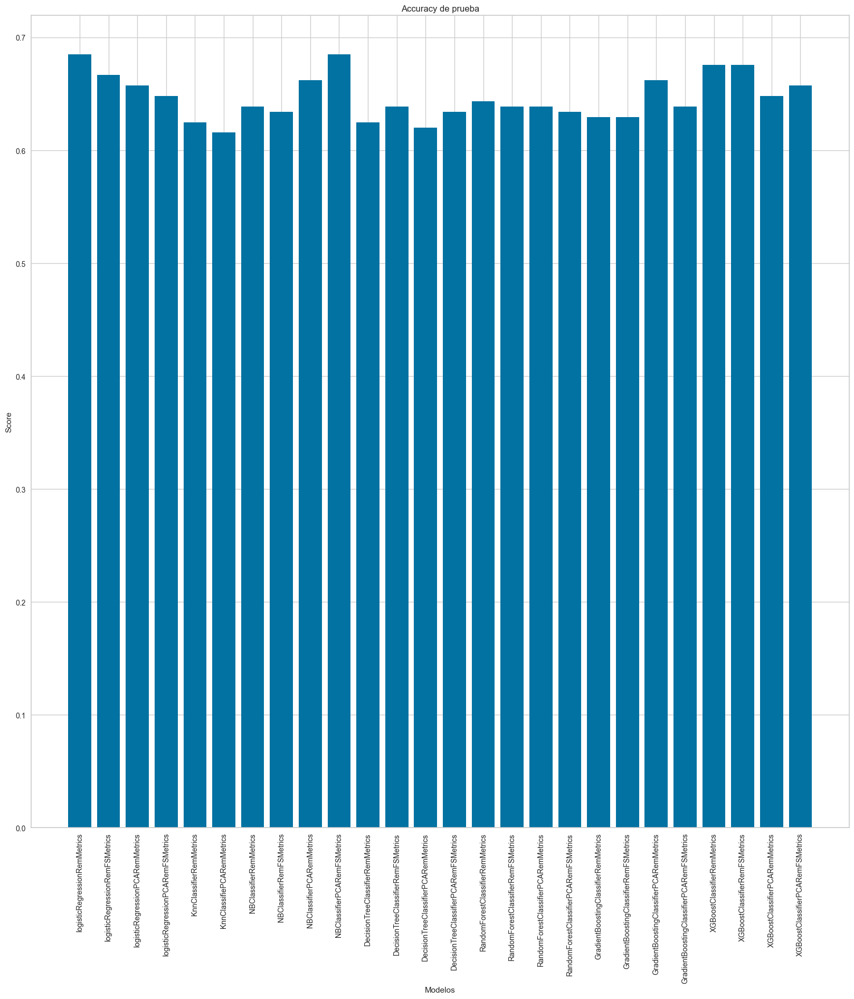

In [128]:
# Diagrama de barras para observar el modelo más importante de acuerdo al Accuracy de prueba

fig, ax = plt.subplots()
fig.set_size_inches((20,20))
ax.bar(names, [i['Test Accuracy'] for i in metrics])
ax.set(title='Accuracy de prueba',xlabel='Modelos',ylabel='Score')
plt.xticks(rotation='vertical')
plt.show()

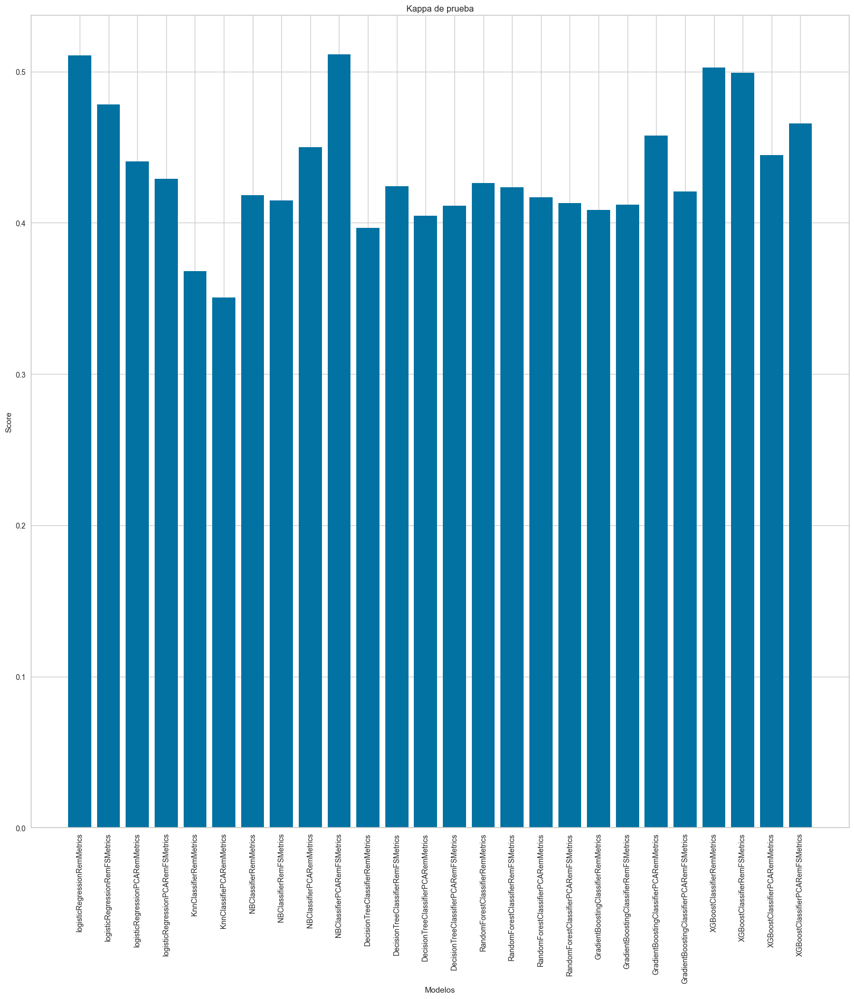

In [129]:
# Diagrama de barras para observar el modelo más importante de acuerdo al Kappa de prueba

fig, ax = plt.subplots()
fig.set_size_inches((20,20))
ax.bar(names, [i['Test Kappa'] for i in metrics])
ax.set(title='Kappa de prueba',xlabel='Modelos',ylabel='Score')
plt.xticks(rotation='vertical')
plt.show()

In [130]:
# Se organizan los modelos de acuerdo a su Accuracy de prueba

models = [(names[i],metrics[i]) for i in range(len(names))]
models = sorted(models,key=lambda x:x[1]['Test Accuracy'],reverse=True)
ranking = pd.DataFrame(columns=['Model','Test Accuracy'])
for model in models:
    ranking = pd.concat([ranking, pd.DataFrame([{'Model':model[0],'Test Accuracy':model[1]['Test Accuracy']}])],ignore_index=True)
ranking

,Model,Test Accuracy
0,logisticRegressionRemMetrics,0.685185
1,NBClassifierPCARemFSMetrics,0.685185
2,XGBoostClassifierRemMetrics,0.675926
3,XGBoostClassifierRemFSMetrics,0.675926
4,logisticRegressionRemFSMetrics,0.666667
5,NBClassifierPCARemMetrics,0.662037
6,GradientBoostingClassifierPCARemMetrics,0.662037
7,logisticRegressionPCARemMetrics,0.657407
8,XGBoostClassifierPCARemFSMetrics,0.657407
9,logisticRegressionPCARemFSMetrics,0.648148


In [131]:
# Se organizan los modelos de acuerdo a su Kappa de prueba

models = [(names[i],metrics[i]) for i in range(len(names))]
models = sorted(models,key=lambda x:x[1]['Test Kappa'],reverse=True)
ranking = pd.DataFrame(columns=['Model','Test Kappa'])
for model in models:
    ranking = pd.concat([ranking, pd.DataFrame([{'Model':model[0],'Test Kappa':model[1]['Test Kappa']}])],ignore_index=True)
ranking

,Model,Test Kappa
0,NBClassifierPCARemFSMetrics,0.511475
1,logisticRegressionRemMetrics,0.510824
2,XGBoostClassifierRemMetrics,0.502615
3,XGBoostClassifierRemFSMetrics,0.499205
4,logisticRegressionRemFSMetrics,0.478173
5,XGBoostClassifierPCARemFSMetrics,0.465650
6,GradientBoostingClassifierPCARemMetrics,0.457697
7,NBClassifierPCARemMetrics,0.449979
8,XGBoostClassifierPCARemMetrics,0.444918
9,logisticRegressionPCARemMetrics,0.440591
